# Use PEP Dataset to Detect County Level Migration
**Contents:**
* [Preprocess](#county)
* [Net Migration Rate for each county from 2000-2020](#NMR)
* [Net Migration Rate for each year](#year)
* [Regression Analysis](#re)

In [280]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import contextily as cx
import statsmodels.api as sm
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker
import matplotlib.dates as mdates
from scipy.stats import pearsonr, spearmanr
from scipy.stats import ttest_ind
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from matplotlib.colors import ListedColormap

# Preprocess <a class="anchor" id="county"></a>

In [281]:
data_path = r"F:/IRS_Migration/"
SHELDUS = pd.read_csv("F:/SHELDUS/ORIGINAL.csv")
state    = gpd.read_file("D:/Users/xiang11/Documents/GitHub/EvacuationIan/datasets/usstate/cb_2018_us_state_500k.shp").to_crs('ESRI:102003')
county  = gpd.read_file("D:/Users/xiang11/Documents/GitHub/EvacuationIan/datasets/maincounty/us_conu_county.shp").to_crs('ESRI:102003')
df_pep_2010 = pd.read_csv(r"F:\PEP\co-est2010-alldata.csv", encoding='latin-1')
df_pep_2020 = pd.read_csv(r"F:\PEP\co-est2020-alldata.csv", encoding='latin-1')
SVI_10 = pd.read_csv(r"F:\PEP\SVI_2010_US_county.csv")

SVI_10['FIPS'] = SVI_10['FIPS'].astype("str").str.rjust(5,"0")

state = state[~state["NAME"].isin(["Alaska","Hawaii","Puerto Rico",
                                   "American Samoa","United States Virgin Islands",
                                   "Guam","Commonwealth of the Northern Mariana Islands"])]

## SHELDUS DOC
https://cemhs.asu.edu/sheldus/metadata

In [282]:
SHELDUS['County FIPS'] = SHELDUS['County FIPS'].str.replace("'", "")
SHELDUS_0020 = SHELDUS[(SHELDUS["Year"]<2021) & (SHELDUS["Year"]>2000)]

In [283]:
SHELDUS_0020 = SHELDUS_0020[~((SHELDUS_0020['Year'] == 2000) & (SHELDUS_0020['Month'] <= 6))]
SHELDUS_0020 = SHELDUS_0020[~((SHELDUS_0020['Year'] == 2020) & (SHELDUS_0020['Month'] >= 7))]

In [284]:
SHELDUS_0020_sel = SHELDUS_0020[SHELDUS_0020["Hazard"].isin(['Flooding','Hurricane/Tropical Storm','Wildfire'])].reset_index(drop=True)

In [285]:
SHELDUS_0020_hurricane = SHELDUS_0020_sel[SHELDUS_0020_sel["Hazard"]=="Hurricane/Tropical Storm"].reset_index()
SHELDUS_0020_flooding  = SHELDUS_0020_sel[SHELDUS_0020_sel["Hazard"]=="Flooding"].reset_index()

In [286]:
hurricane_induced_floods = pd.merge(
    SHELDUS_0020_flooding, 
    SHELDUS_0020_hurricane, 
    on=['County FIPS', 'Year', 'Month'],
    suffixes=('_flood', '_hurricane')
)
flood_indices = hurricane_induced_floods['index_flood']

In [287]:
SHELDUS_0020_sel.loc[flood_indices, 'Hazard'] = 'Hurricane/Tropical Storm'

In [288]:
SHELDUS_0020_use = SHELDUS_0020_sel[(SHELDUS_0020_sel["Fatalities"]!=0)|(SHELDUS_0020_sel["Injuries"]!=0)|(SHELDUS_0020_sel["PropertyDmgPerCapita(ADJ 2020)"]>1)]
SHELDUS_0020_use_group = SHELDUS_0020_use.groupby(["County FIPS","Hazard","Year"]).agg({"Month":"count",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()
SHELDUS_0020_use_group = SHELDUS_0020_use_group.rename(columns={"Month":"count"})
df_20_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()


In [289]:
conditions1 = [
    SHELDUS_0020_use_group["Year"].between(2001,2011, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2011,2021, inclusive="left")
]

choices1 = ["2001-2010", "2011-2020"]

SHELDUS_0020_use_group['decade'] = np.select(conditions1, choices1, default=np.nan)


conditions2 = [
    SHELDUS_0020_use_group["Year"].between(2001,2006, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2006,2011, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2011,2016, inclusive="left"),
    SHELDUS_0020_use_group["Year"].between(2016,2021, inclusive="left")
]

choices2 = ["2001-2005", "2006-2010","2011-2015", "2016-2020"]

SHELDUS_0020_use_group['interval'] = np.select(conditions2, choices2, default=np.nan)

In [290]:
df_10_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard","decade"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()

df_5_years_by_county = SHELDUS_0020_use_group.groupby(['County FIPS',"Hazard","interval"]).agg({"count":"sum",
                                                                                        "Fatalities":"sum",
                                                                                        "Injuries":"sum",
                                                                                        "PropertyDmg(ADJ 2020)":"sum",
                                                                                        "PropertyDmgPerCapita(ADJ 2020)":"mean"}).reset_index()


In [291]:
SHELDUS_20_use_flooding  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Flooding"]
SHELDUS_20_use_hurricane = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_20_use_wildfire  = df_20_years_by_county[df_20_years_by_county["Hazard"]=="Wildfire"]

SHELDUS_10_use_flooding  = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Flooding"]
SHELDUS_10_use_hurricane = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_10_use_wildfire  = df_10_years_by_county[df_10_years_by_county["Hazard"]=="Wildfire"]

SHELDUS_5_use_flooding   = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Flooding"]
SHELDUS_5_use_hurricane  = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Hurricane/Tropical Storm"]
SHELDUS_5_use_wildfire   = df_5_years_by_county[df_5_years_by_county["Hazard"]=="Wildfire"]

In [292]:
def classify_impact(data, value_column):
    Q1 = data[value_column].quantile(0.25)
    Q3 = data[value_column].quantile(0.75)
    
    def classification(value):
        if value <= Q1:
            return 'Low Impact'
        elif (value > Q1) & (value < Q3):
            return 'Moderate Impact'
        elif value >= Q3:
            return 'High Impact'
    
    return data[value_column].apply(classification)

In [293]:
Q1_20_flooding = SHELDUS_20_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_flooding = SHELDUS_20_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_20_hurricane = SHELDUS_20_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_hurricane = SHELDUS_20_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_20_wildfire = SHELDUS_20_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_20_wildfire = SHELDUS_20_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_flooding = SHELDUS_10_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_flooding = SHELDUS_10_use_flooding["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_hurricane = SHELDUS_10_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_hurricane = SHELDUS_10_use_hurricane["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

Q1_10_wildfire = SHELDUS_10_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.25)
Q3_10_wildfire = SHELDUS_10_use_wildfire["PropertyDmgPerCapita(ADJ 2020)"].quantile(0.75)

In [294]:
SHELDUS_20_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_20_use_wildfire['ImpactLevel'] = classify_impact(SHELDUS_20_use_wildfire, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_10_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_10_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
SHELDUS_10_use_wildfire['ImpactLevel'] = classify_impact(SHELDUS_10_use_wildfire, "PropertyDmgPerCapita(ADJ 2020)")

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3703201973.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_flooding['ImpactLevel'] = classify_impact(SHELDUS_20_use_flooding, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3703201973.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  SHELDUS_20_use_hurricane['ImpactLevel'] = classify_impact(SHELDUS_20_use_hurricane, "PropertyDmgPerCapita(ADJ 2020)")
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516

In [295]:
SHELDUS_flooding_county  = list(SHELDUS_20_use_flooding["County FIPS"].unique())
SHELDUS_hurricane_county = list(SHELDUS_20_use_hurricane["County FIPS"].unique())
SHELDUS_wildfire_county  = list(SHELDUS_20_use_wildfire["County FIPS"].unique())

flooding_county  = county[county["FIPS"].isin(SHELDUS_flooding_county)].reset_index(drop=True)
hurricane_county = county[county["FIPS"].isin(SHELDUS_hurricane_county)].reset_index(drop=True)
wildfire_county  = county[county["FIPS"].isin(SHELDUS_wildfire_county)].reset_index(drop=True)

In [296]:
df_SHELDUS_20_flooding_county  = pd.merge(SHELDUS_20_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_20_hurricane_county = pd.merge(SHELDUS_20_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_20_wildfire_county  = pd.merge(SHELDUS_20_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_20_flooding_county = gpd.GeoDataFrame(df_SHELDUS_20_flooding_county,geometry="geometry")
gdf_SHELDUS_20_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_20_hurricane_county,geometry="geometry")
gdf_SHELDUS_20_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_20_wildfire_county,geometry="geometry")

df_SHELDUS_10_flooding_county  = pd.merge(SHELDUS_10_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_10_hurricane_county = pd.merge(SHELDUS_10_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_10_wildfire_county  = pd.merge(SHELDUS_10_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_10_flooding_county = gpd.GeoDataFrame(df_SHELDUS_10_flooding_county,geometry="geometry")
gdf_SHELDUS_10_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_10_hurricane_county,geometry="geometry")
gdf_SHELDUS_10_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_10_wildfire_county,geometry="geometry")

df_SHELDUS_5_flooding_county  = pd.merge(SHELDUS_5_use_flooding,flooding_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_5_hurricane_county = pd.merge(SHELDUS_5_use_hurricane,hurricane_county,left_on="County FIPS",right_on="FIPS")
df_SHELDUS_5_wildfire_county  = pd.merge(SHELDUS_5_use_wildfire,wildfire_county,left_on="County FIPS",right_on="FIPS")

gdf_SHELDUS_5_flooding_county = gpd.GeoDataFrame(df_SHELDUS_5_flooding_county,geometry="geometry")
gdf_SHELDUS_5_hurricane_county= gpd.GeoDataFrame(df_SHELDUS_5_hurricane_county,geometry="geometry")
gdf_SHELDUS_5_wildfire_county = gpd.GeoDataFrame(df_SHELDUS_5_wildfire_county,geometry="geometry")

In [297]:
gdf_SHELDUS_20_flooding_county_low = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_flooding_county_med = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_flooding_county_high= gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]=="High Impact"]

gdf_SHELDUS_20_hurricane_county_low = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_hurricane_county_med = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_hurricane_county_high= gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]=="High Impact"]

gdf_SHELDUS_20_wildfire_county_low = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="Low Impact"]
gdf_SHELDUS_20_wildfire_county_med = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="Moderate Impact"]
gdf_SHELDUS_20_wildfire_county_high= gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]=="High Impact"]

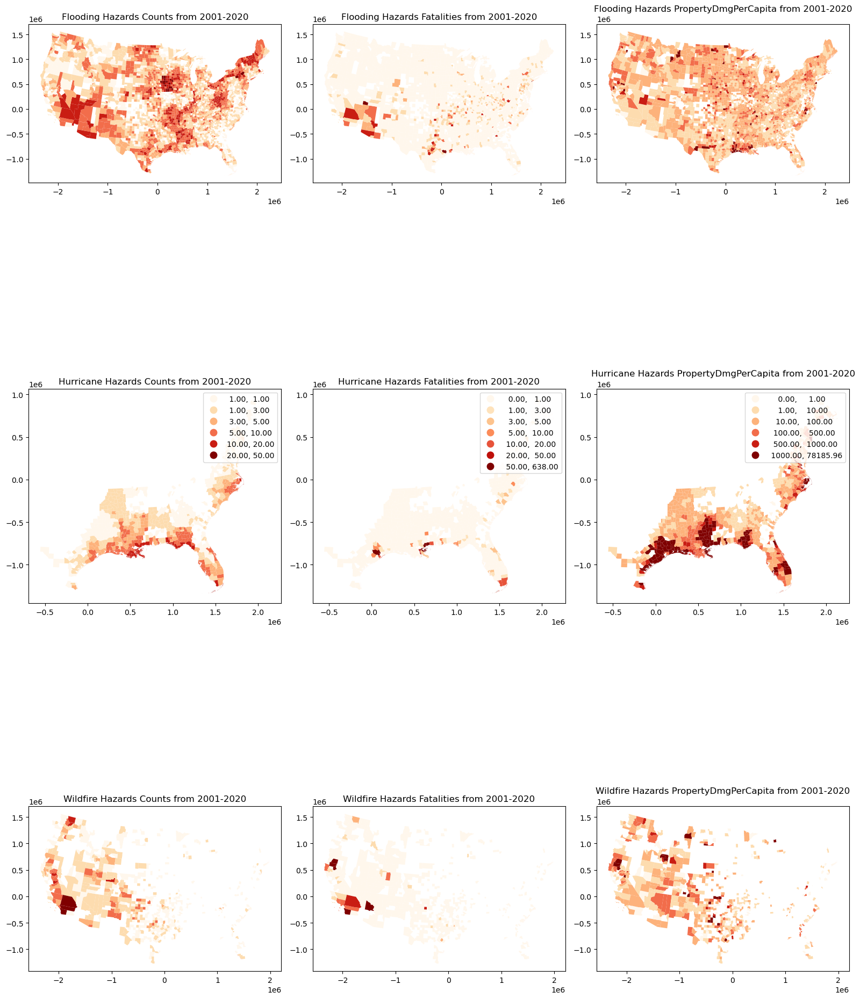

In [298]:
fig, axes = plt.subplots(3,3,figsize=(16,24))
gdf_SHELDUS_20_flooding_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
#                                     legend=True,
                                    ax=axes[0,0])
gdf_SHELDUS_20_flooding_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
#                                     legend=True,
                                    ax=axes[0,1])
gdf_SHELDUS_20_flooding_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",
#                                     legend=True,
                                    ax=axes[0,2])

gdf_SHELDUS_20_hurricane_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
                                    legend=True,
                                     ax=axes[1,0])
gdf_SHELDUS_20_hurricane_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
                                    legend=True,
                                     ax=axes[1,1])
gdf_SHELDUS_20_hurricane_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",legend=True,ax=axes[1,2])

gdf_SHELDUS_20_wildfire_county.plot(column="count",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="percentiles",
#                                     legend=True,
                                    ax=axes[2,0])
gdf_SHELDUS_20_wildfire_county.plot(column="Fatalities",cmap="OrRd",
                                    scheme='userdefined',classification_kwds={'bins':[1,3,5,10,20,50]},
#                                     scheme="FisherJenksSampled",
#                                     legend=True,
                                    ax=axes[2,1])
gdf_SHELDUS_20_wildfire_county.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
#                                     scheme="percentiles",
                                    cmap="OrRd",
#                                     legend=True,
                                    ax=axes[2,2])

axes[0,0].set_title("Flooding Hazards Counts from 2001-2020")
axes[1,0].set_title("Hurricane Hazards Counts from 2001-2020")
axes[2,0].set_title("Wildfire Hazards Counts from 2001-2020")

axes[0,1].set_title("Flooding Hazards Fatalities from 2001-2020")
axes[1,1].set_title("Hurricane Hazards Fatalities from 2001-2020")
axes[2,1].set_title("Wildfire Hazards Fatalities from 2001-2020")

axes[0,2].set_title("Flooding Hazards PropertyDmgPerCapita from 2001-2020")
axes[1,2].set_title("Hurricane Hazards PropertyDmgPerCapita from 2001-2020")
axes[2,2].set_title("Wildfire Hazards PropertyDmgPerCapita from 2001-2020")

plt.tight_layout()
plt.show()

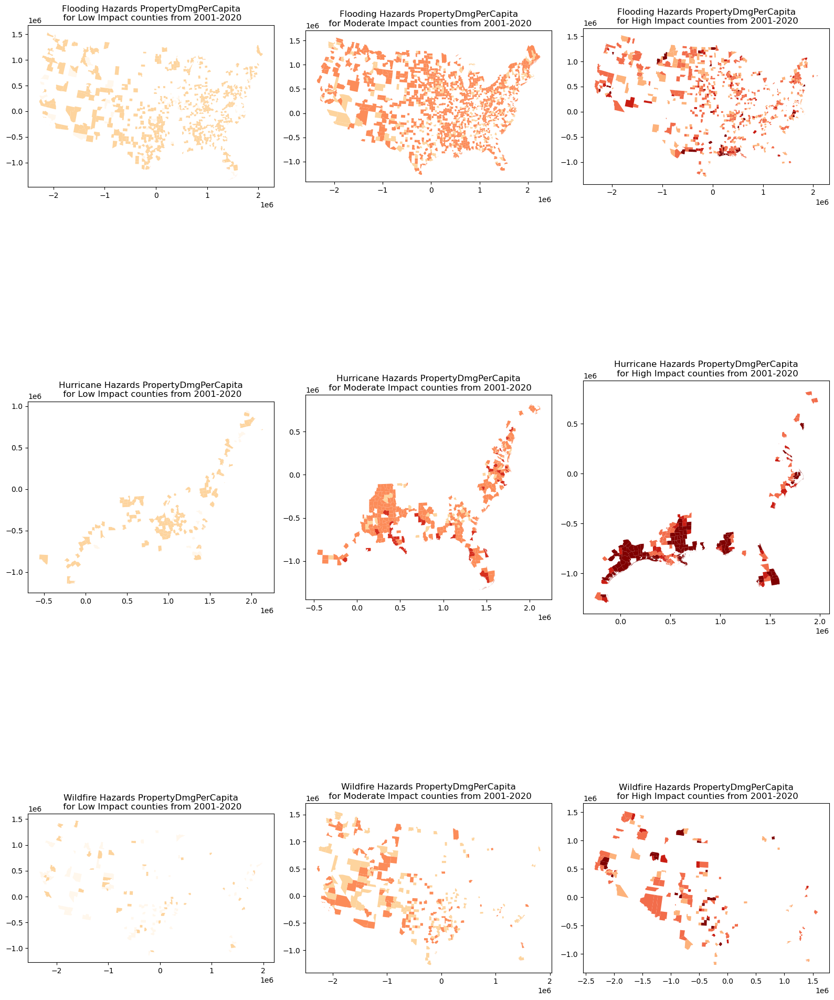

In [299]:
i = 0
fig, axes = plt.subplots(3,3,figsize=(16,24))
for level in ["Low Impact","Moderate Impact","High Impact"]:
    flooding_county_20 = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]==level]
    flooding_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[0,i])
    hurricane_county_20 = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]==level]
    hurricane_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[1,i])
    wildfire_county_20 = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]==level]
    wildfire_county_20.plot(column="PropertyDmgPerCapita(ADJ 2020)",
                                    scheme='userdefined',classification_kwds={'bins':[1,10,100,500,1000]},
                                    cmap="OrRd",
                                    ax=axes[2,i])
    axes[0,i].set_title(f"Flooding Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    axes[1,i].set_title(f"Hurricane Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    axes[2,i].set_title(f"Wildfire Hazards PropertyDmgPerCapita\n for {level} counties from 2001-2020")
    
    i = i+1
    
plt.tight_layout()
plt.show()


In [300]:
flooding_county_list_20  = []
hurricane_county_list_20 = []
wildfire_county_list_20  = []

for level in ["Low Impact","Moderate Impact","High Impact"]:
    flooding_county_20 = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["ImpactLevel"]==level]
    flooding_county_list_20.append(list(flooding_county_20["County FIPS"].unique()))
    
    hurricane_county_20 = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["ImpactLevel"]==level]
    hurricane_county_list_20.append(list(hurricane_county_20["County FIPS"].unique()))
    
    wildfire_county_20 = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["ImpactLevel"]==level]
    wildfire_county_list_20.append(list(wildfire_county_20["County FIPS"].unique()))

In [301]:
df_pep_2010["state"] = df_pep_2010["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2010["county"] = df_pep_2010["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2010["FIPS"] = df_pep_2010["state"] + df_pep_2010["county"]

df_pep_2020["state"] = df_pep_2020["STATE"].astype('int64').astype('str').str.rjust(2, "0")
df_pep_2020["county"] = df_pep_2020["COUNTY"].astype('int64').astype('str').str.rjust(3, "0")
df_pep_2020["FIPS"] = df_pep_2020["state"] + df_pep_2020["county"]

In [302]:
df_pep_0120 = pd.merge(df_pep_2010,df_pep_2020,on="FIPS")

In [303]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)
        
# columns_needed = ['STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
# relevant_data = data[columns_needed]

In [304]:
columns_needed = ['FIPS','STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
relevant_data = df_pep_0120[columns_needed]

In [305]:
relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3865312276.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')


# Net Migration Rate <a class="anchor" id="NMR"></a>

### NetMigrationRate1 is calculated by average net migration rate
### NetMigrationRate2 is calculated by (migration pop/average pop * 1000)
### NetMigrationRate1 is better in the further results

In [306]:
relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
relevant_data['NetMigrationRate1'] = relevant_data[correct_netmig_columns].mean(axis=1)
relevant_data['NetMigrationRate2'] = (relevant_data['TotalNetMigration'] / relevant_data['AveragePopulation']) * 1000
final_data = relevant_data[['FIPS','STNAME_x', 'CTYNAME_x', 'TotalNetMigration', 'AveragePopulation', 'NetMigrationRate1', 'NetMigrationRate2']]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\433456365.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\433456365.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\433456365.py:3: SettingWithCopyWarning: 


In [307]:
df_NMR = pd.merge(final_data,county,on="FIPS",how="inner")
gdf_NMR = gpd.GeoDataFrame(df_NMR,geometry="geometry")

Text(0.5, 1.0, 'Net Migration Rate from 2001-2020 (Calculated by Average Migration Rate)')

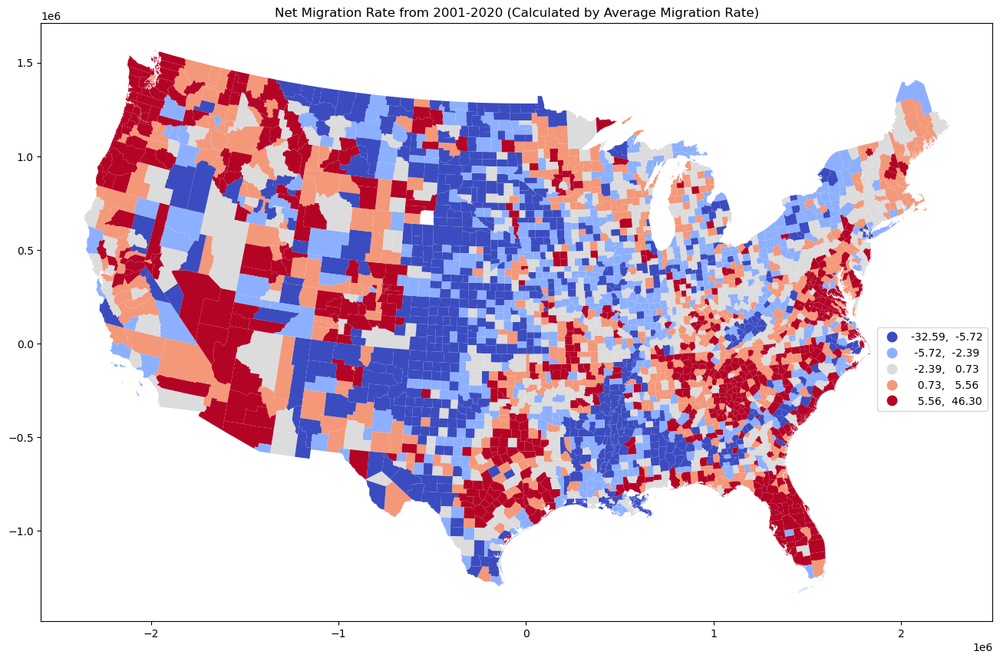

In [308]:
fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 
ax.set_title("Net Migration Rate from 2001-2020 (Calculated by Average Migration Rate)")

# gdf_NMR.plot(column="NetMigrationRate2",cmap="coolwarm",
#              scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

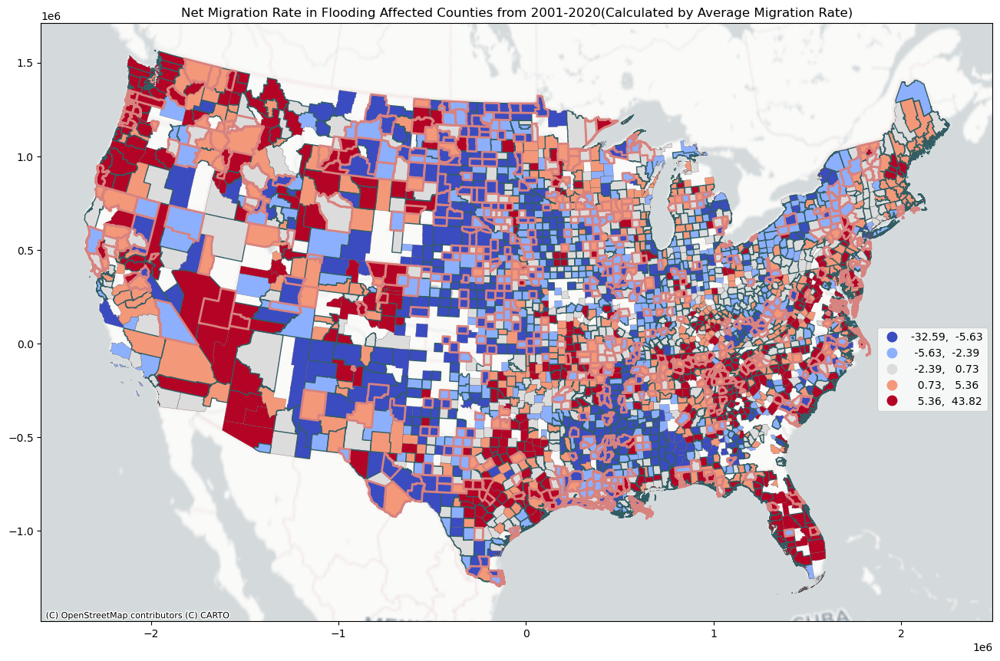

In [309]:
gdf_NMR_flooding = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_flooding_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_flooding.plot(column="NetMigrationRate1",cmap="coolwarm",
                      scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#584f4f', 'linewidth': 0.2},
    'Moderate Impact': {'color': '#325e63', 'linewidth': 1},
    'High Impact': {'color': '#d7837f', 'linewidth': 2}
}

gdf_SHELDUS_20_flooding_county['line_color'] = gdf_SHELDUS_20_flooding_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_flooding_county['line_width'] = gdf_SHELDUS_20_flooding_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'])

ax.set_title("Net Migration Rate in Flooding Affected Counties from 2001-2020(Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

# gdf_NMR_flooding.plot(column="NetMigrationRate2",cmap="coolwarm",
#                       scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate in Flooding Affected Counties from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

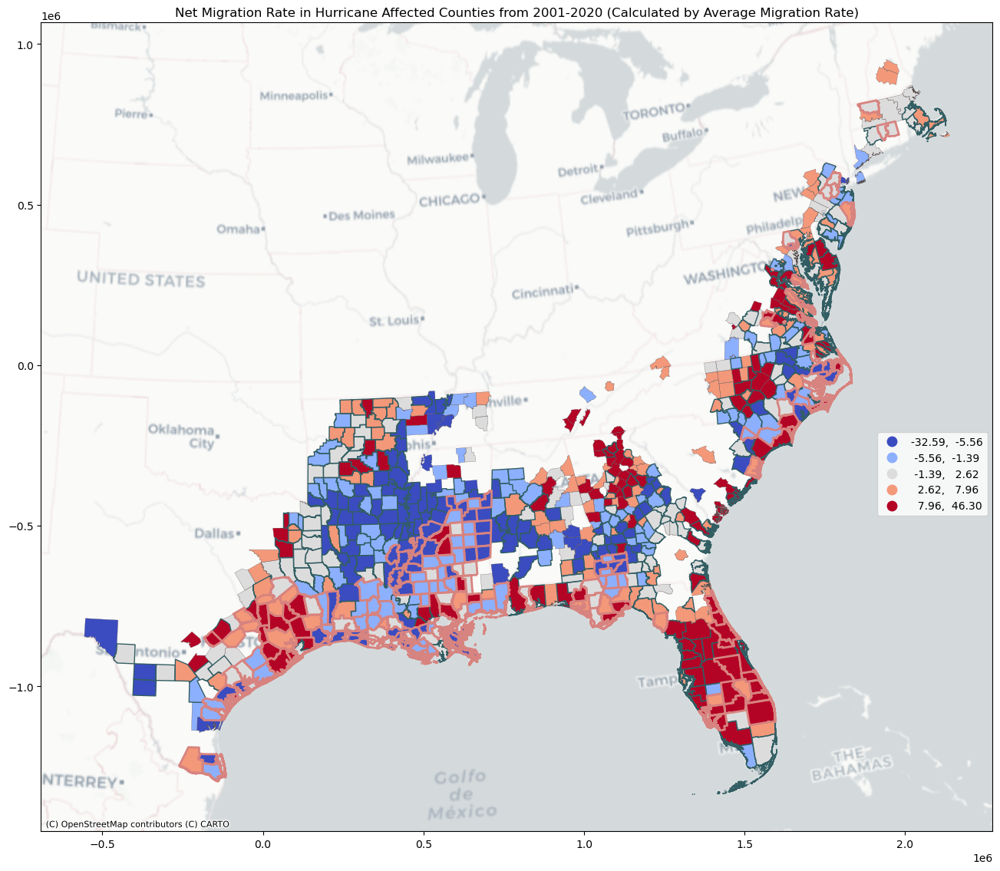

In [310]:
gdf_NMR_hurricane = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_hurricane_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_hurricane.plot(column="NetMigrationRate1",cmap="coolwarm",
                       scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#584f4f', 'linewidth': 0.2},
    'Moderate Impact': {'color': '#325e63', 'linewidth': 1},
    'High Impact': {'color': '#d7837f', 'linewidth': 2}
    # Grey, olive, pink
}

gdf_SHELDUS_20_hurricane_county['line_color'] = gdf_SHELDUS_20_hurricane_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_hurricane_county['line_width'] = gdf_SHELDUS_20_hurricane_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'])

ax.set_title("Net Migration Rate in Hurricane Affected Counties from 2001-2020 (Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)
# gdf_NMR_hurricane.plot(column="NetMigrationRate2",cmap="coolwarm",
#                        scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate in Hurricane Affected Counties from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

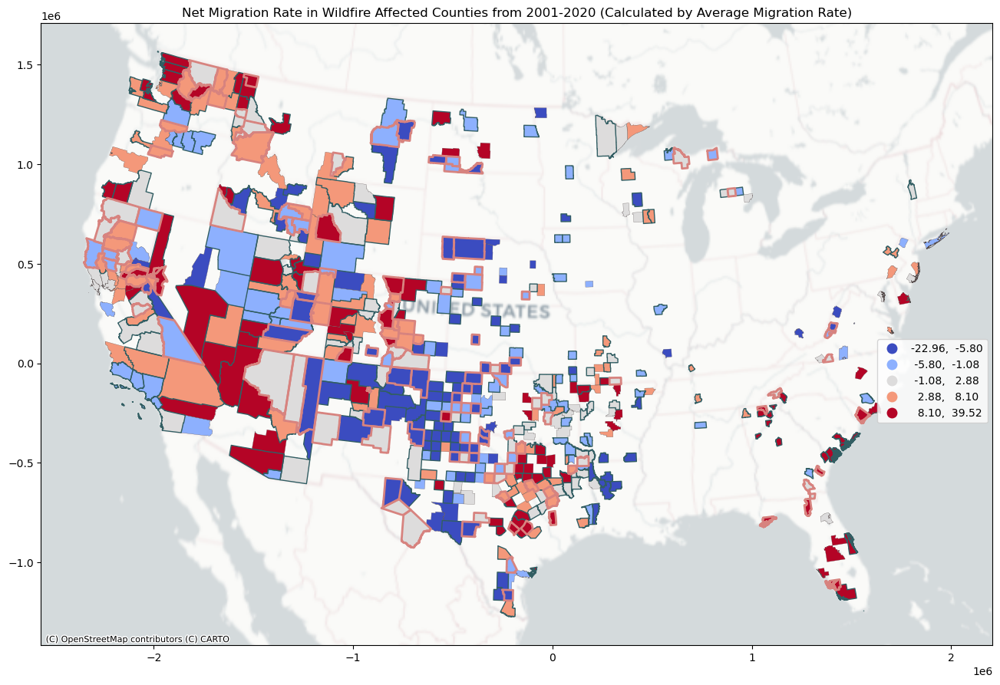

In [311]:
gdf_NMR_wildfire = gdf_NMR[gdf_NMR["FIPS"].isin(SHELDUS_wildfire_county)].reset_index(drop=True)

fig, ax = plt.subplots(1, 1, figsize=(16, 20))
gdf_NMR_wildfire.plot(column="NetMigrationRate1",cmap="coolwarm",
                      scheme="quantiles",
#              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=ax)
leg = ax.get_legend()
leg.set_bbox_to_anchor(( 1, 0.5)) 

properties_map = {
    'Low Impact': {'color': '#584f4f', 'linewidth': 0.2},
    'Moderate Impact': {'color': '#325e63', 'linewidth': 1},
    'High Impact': {'color': '#d7837f', 'linewidth': 2}
    # Grey, olive, pink
}

gdf_SHELDUS_20_wildfire_county['line_color'] = gdf_SHELDUS_20_wildfire_county['ImpactLevel'].map(lambda x: properties_map[x]['color'])
gdf_SHELDUS_20_wildfire_county['line_width'] = gdf_SHELDUS_20_wildfire_county['ImpactLevel'].map(lambda x: properties_map[x]['linewidth'])

for level, properties in properties_map.items():
    subset = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county['ImpactLevel'] == level]
    subset.boundary.plot(ax=ax, color=properties['color'], linewidth=properties['linewidth'])

ax.set_title("Net Migration Rate in Wildfire Affected Counties from 2001-2020 (Calculated by Average Migration Rate)")
cx.add_basemap(ax=ax, source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)
# gdf_NMR_wildfire.plot(column="NetMigrationRate2",cmap="coolwarm",
#                       scheme="quantiles",
# #              scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
#              legend=True,ax=ax[1])
# leg = ax[1].get_legend()
# leg.set_bbox_to_anchor(( 1, 0.5)) 
# ax[1].set_title("Net Migration Rate in Wildfire Affected Counties from 2001-2020")
# cx.add_basemap(ax=ax[1], source=cx.providers.CartoDB.Positron, crs=gdf_NMR.crs)

Three color to show the position

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


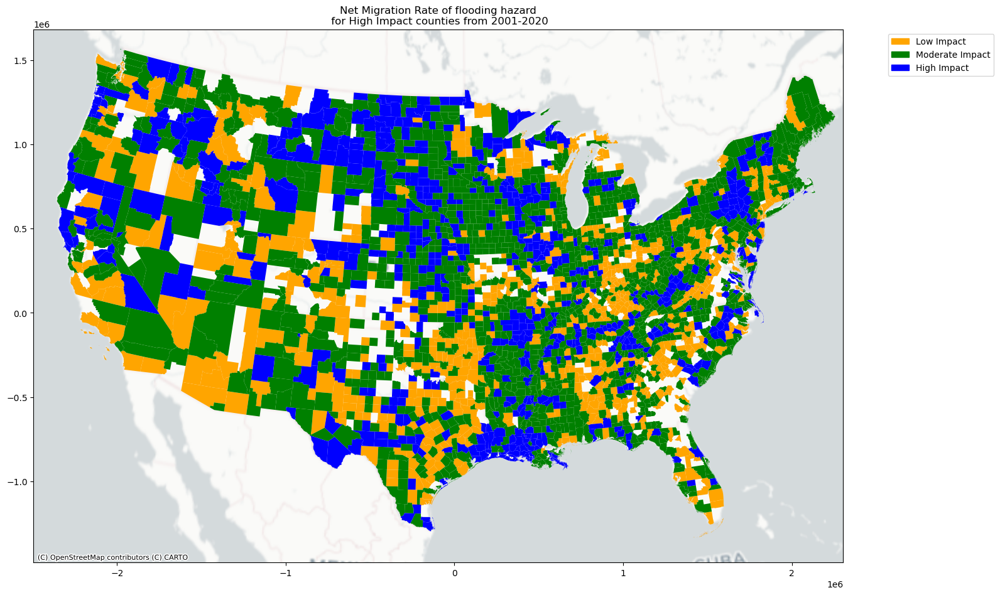

In [312]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_flooding_use = gdf_NMR[gdf_NMR["FIPS"].isin(flooding_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_flooding_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of flooding hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

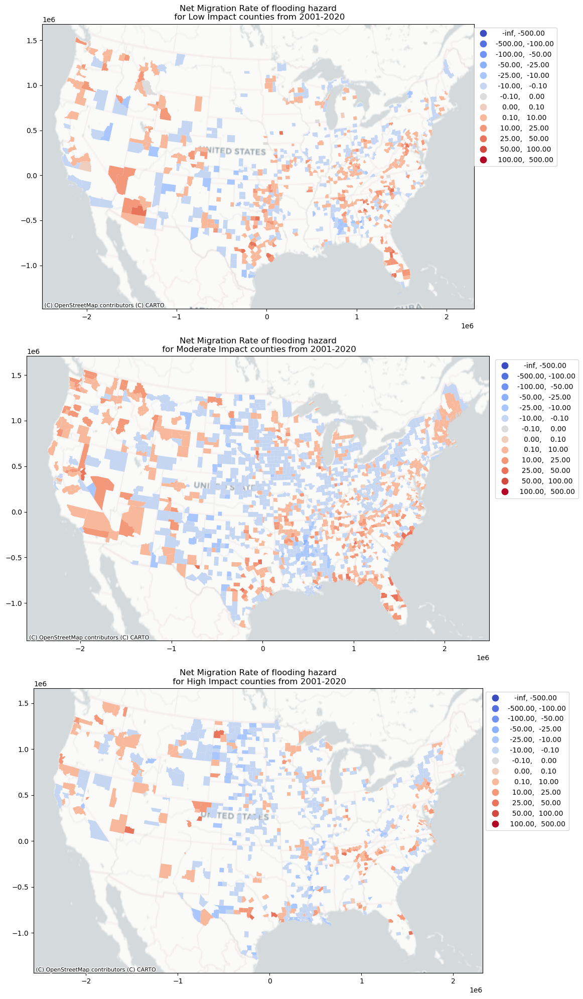

In [313]:
list_use = ["Low Impact","Moderate Impact","High Impact"]

fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_flooding_use = gdf_NMR[gdf_NMR["FIPS"].isin(flooding_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_flooding_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of flooding hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

plt.tight_layout()
plt.show()

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


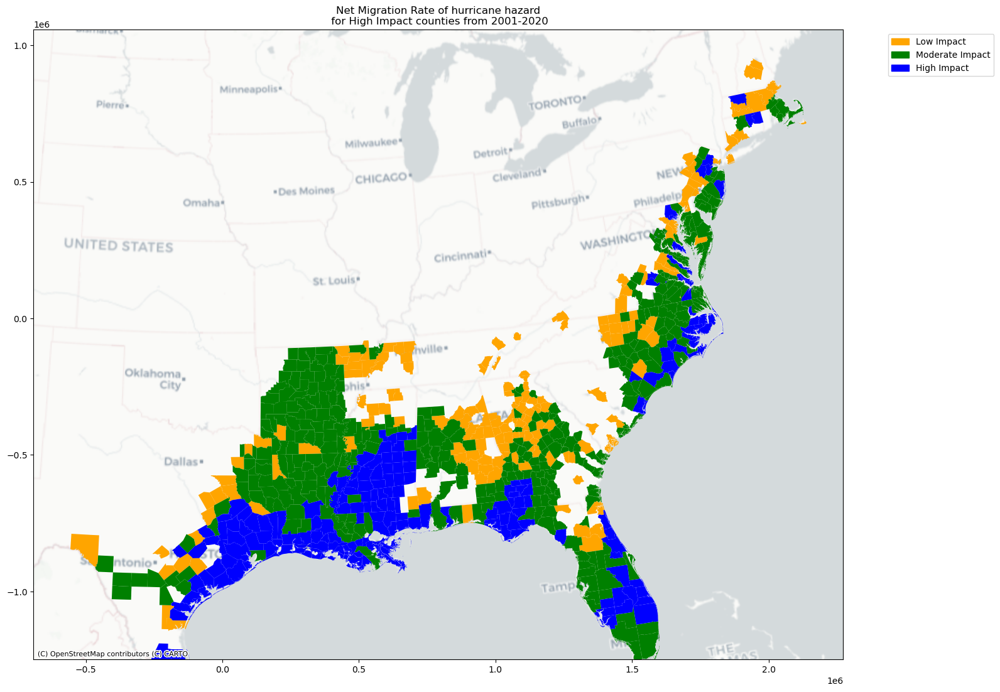

In [314]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_hurricane_use = gdf_NMR[gdf_NMR["FIPS"].isin(hurricane_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of hurricane hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

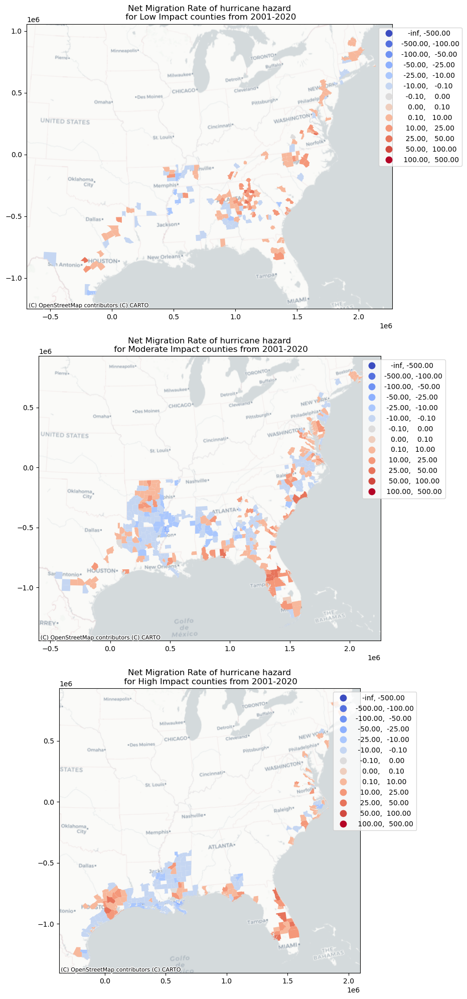

In [315]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_hurricane_use = gdf_NMR[gdf_NMR["FIPS"].isin(hurricane_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_hurricane_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of hurricane hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_hurricane_use.crs)

plt.tight_layout()
plt.show()

C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(
C:\Users\xiang11\.conda\envs\geo\lib\site-packages\geopandas\plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


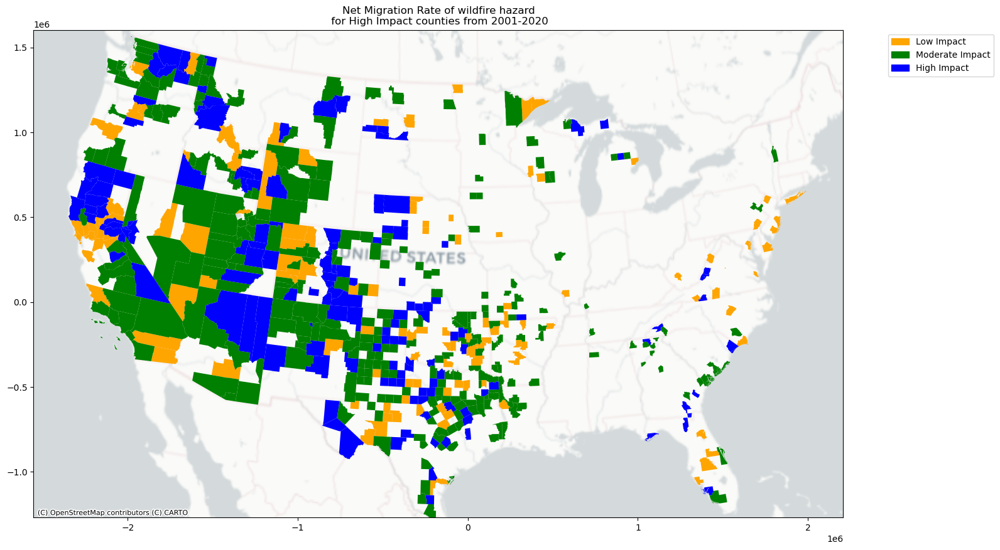

In [316]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
color_list = ["orange","green","blue"]
fig, axes = plt.subplots(1, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_wildfire_use = gdf_NMR[gdf_NMR["FIPS"].isin(wildfire_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",color= color_list[i],
             ax=axes)
    axes.legend(["Low Impact","Moderate Impact","High Impact"])
    axes.set_title(f"Net Migration Rate of wildfire hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes, source=cx.providers.CartoDB.Positron, crs=gdf_NMR_flooding_use.crs)

legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(color_list, list_use)]
axes.legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

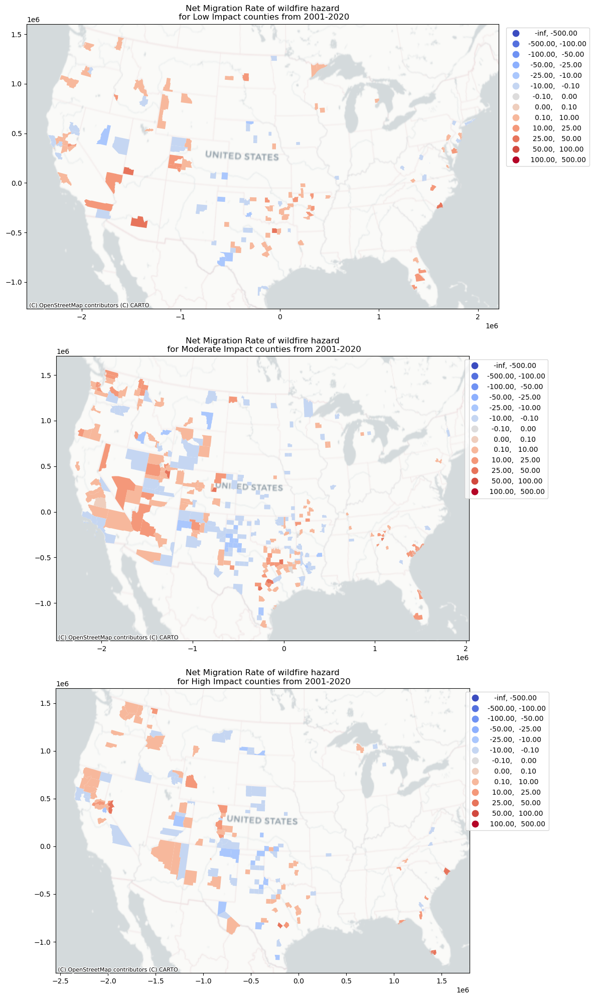

In [317]:
list_use = ["Low Impact","Moderate Impact","High Impact"]
fig, axes = plt.subplots(3, 1, figsize=(16, 20))

for i in range(3):
    gdf_NMR_wildfire_use = gdf_NMR[gdf_NMR["FIPS"].isin(wildfire_county_list_20[i])].reset_index(drop=True)
    gdf_NMR_wildfire_use.plot(column="NetMigrationRate1",cmap="coolwarm",
             scheme='userdefined',classification_kwds={'bins':[-500,-100,-50,-25,-10,-0.1,0,0.1,10,25,50,100,500]},
             legend=True,ax=axes[i])
    leg = axes[i].get_legend()
    leg.set_bbox_to_anchor((1.2, 1)) 
    axes[i].set_title(f"Net Migration Rate of wildfire hazard\n for {list_use[i]} counties from 2001-2020")
    cx.add_basemap(ax=axes[i], source=cx.providers.CartoDB.Positron, crs=gdf_NMR_wildfire_use.crs)

plt.tight_layout()
plt.show()

# Net Migration Rate for each year <a class="anchor" id="year"></a>

In [318]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [319]:
def determine_period(row):
    if row['Month'] >= 7:
        return row['Year'] + 1
    else:
        return row['Year']

In [320]:
flooding_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Flooding"]

In [321]:
flooding_year = flooding_year[~((flooding_year['Year'] == 2000) & (flooding_year['Month'] <= 6))]
flooding_year = flooding_year[~((flooding_year['Year'] == 2020) & (flooding_year['Month'] >= 7))]

flooding_year['Period'] = flooding_year.apply(determine_period, axis=1)

In [322]:
# flooding_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Flooding"]
flooding_year = flooding_year.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
flooding_year = flooding_year.rename(columns={"Month":"count"})

In [323]:
flooding_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[0])].reset_index(drop=True)
flooding_county_low_mean = flooding_county_low[correct_netmig_columns].mean()
flooding_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[1])].reset_index(drop=True)
flooding_county_med_mean = flooding_county_med[correct_netmig_columns].mean()
flooding_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(flooding_county_list_20[2])].reset_index(drop=True)
flooding_county_high_mean = flooding_county_high[correct_netmig_columns].mean()

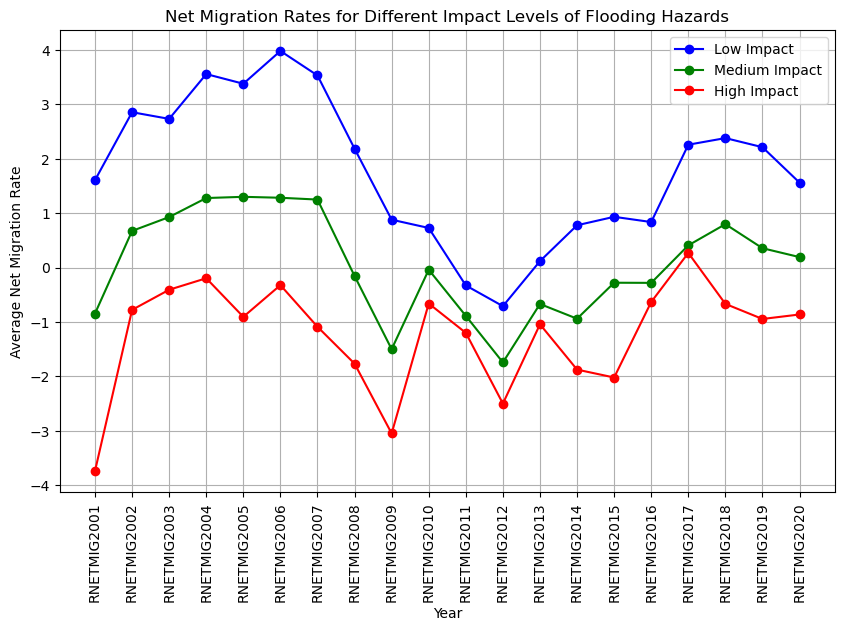

In [324]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# years = np.arange(2000, 2020)

# Plot each dataset
plt.plot(flooding_county_low_mean.index, flooding_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(flooding_county_med_mean.index, flooding_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(flooding_county_high_mean.index, flooding_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Flooding Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# plt.xticks(np.arange(min(years), max(years) + 1, 1))

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

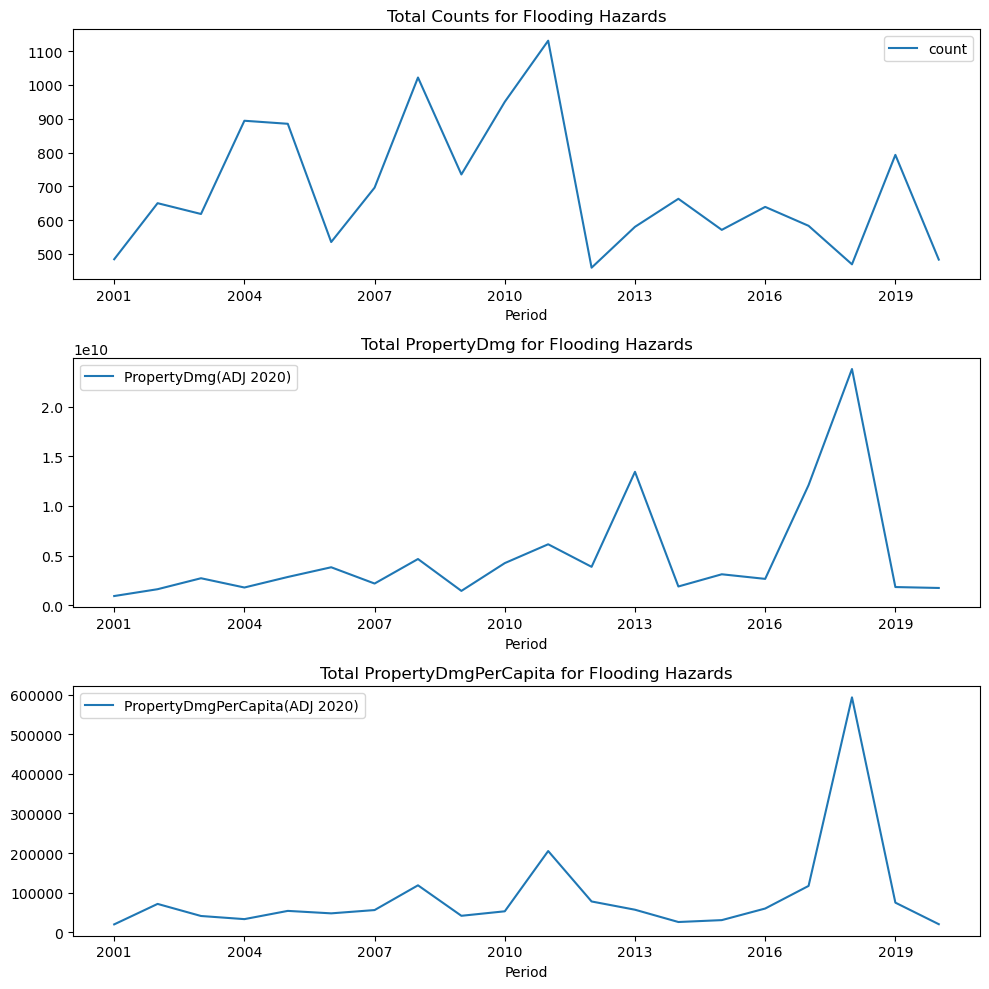

In [325]:
fig, axes = plt.subplots(3,1,figsize=(10,10))
flooding_year.plot.line("Period","count",ax=axes[0],title="Total Counts for Flooding Hazards")
flooding_year.plot.line("Period","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Flooding Hazards") 
flooding_year.plot.line("Period","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Flooding Hazards")
for ax in axes:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_xlabel("Period")
plt.tight_layout()
plt.show()

In [326]:
hurricane_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]

hurricane_year = hurricane_year[~((hurricane_year['Year'] == 2000) & (hurricane_year['Month'] <= 6))]
hurricane_year = hurricane_year[~((hurricane_year['Year'] == 2020) & (hurricane_year['Month'] >= 7))]

hurricane_year['Period'] = hurricane_year.apply(determine_period, axis=1)

hurricane_year = hurricane_year.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
hurricane_year = hurricane_year.rename(columns={"Month":"count"})

In [327]:
hurricane_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[0])].reset_index(drop=True)
hurricane_county_low_mean = hurricane_county_low[correct_netmig_columns].mean()
hurricane_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[1])].reset_index(drop=True)
hurricane_county_med_mean = hurricane_county_med[correct_netmig_columns].mean()
hurricane_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(hurricane_county_list_20[2])].reset_index(drop=True)
hurricane_county_high_mean = hurricane_county_high[correct_netmig_columns].mean()

## Test why Hurricane Sandy is not showing accurately

It looks like Hurricane Sandy's damage is classified in Flooding Hazard in SHELDUS dataset.

In [328]:
SHELDUS_0020_use[SHELDUS_0020_use["Year"]==2012].sort_values("PropertyDmg",ascending=False)[0:5]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
27502,NEW JERSEY,Ocean,34029,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,2
27486,NEW JERSEY,Monmouth,34025,Flooding,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,2
27478,NEW JERSEY,Middlesex,34023,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,5.000000e+08,...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0,1
1781,COLORADO,El Paso,08041,Wildfire,2012,7,0.0,0.0,0.0,4.000000e+08,...,0.0,0.0,0.0,0.0,10.0,0.0,0.0,10.0,0.0,1
18418,COLORADO,El Paso,08041,Wildfire,2012,6,0.0,0.0,0.0,4.000000e+08,...,0.0,0.0,2.0,0.0,5.0,5.0,0.0,5.0,0.0,1


In [329]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2005].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
24457,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,1.790000e+10,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1
18935,FLORIDA,Palm Beach,12099,Hurricane/Tropical Storm,2005,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,1.0,0.00000,1.0,1.0,0.0,1.0,0.0,1
24528,LOUISIANA,St. Bernard,22087,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,6.040000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,2
25798,MISSISSIPPI,Harrison,28047,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,5.630000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1
24478,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,4.030000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,2
8749,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.560000e+09,...,0.0,0.0,638.0,0.00140,2.0,2.0,0.0,2.0,0.0,1
8803,LOUISIANA,St. Bernard,22087,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.560000e+09,...,0.0,0.0,140.0,0.00216,2.0,2.0,0.0,2.0,0.0,2
25788,MISSISSIPPI,Hancock,28045,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.380000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1
8767,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.040000e+09,...,0.0,0.0,2.0,0.00007,2.0,2.0,0.0,2.0,0.0,2
24608,LOUISIANA,St. Tammany,22103,Hurricane/Tropical Storm,2005,8,0.0,0.0,0.0,3.030000e+09,...,0.0,0.0,0.0,0.00000,1.0,0.0,0.0,1.0,0.0,1


In [330]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2012].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
27502,NEW JERSEY,Ocean,34029,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,1.000000e+10,...,0.0,0.0,2.0,0.00000,1.0,1.0,0.0,1.0,0.0,2
27478,NEW JERSEY,Middlesex,34023,Hurricane/Tropical Storm,2012,10,0.0,0.0,0.0,5.000000e+08,...,0.0,0.0,0.0,0.00000,2.0,0.0,0.0,2.0,0.0,1
8834,LOUISIANA,St. John the Baptist,22095,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,1.076000e+08,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,1
24378,LOUISIANA,Jefferson,22051,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,1.074000e+08,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,3
8755,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,6.255000e+07,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,2
8770,LOUISIANA,Plaquemines,22075,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,4.980000e+07,...,0.0,0.0,2.0,0.00008,4.0,4.0,0.0,4.0,0.0,1
24611,LOUISIANA,St. Tammany,22103,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,4.280000e+07,...,0.0,0.0,1.0,0.00000,4.0,4.0,0.0,4.0,0.0,1
8756,LOUISIANA,Orleans,22071,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,2.680000e+07,...,0.0,0.0,0.0,0.00000,3.0,0.0,0.0,3.0,0.0,1
8893,LOUISIANA,Tangipahoa,22105,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,2.680000e+07,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,1
24426,LOUISIANA,Livingston,22063,Hurricane/Tropical Storm,2012,8,0.0,0.0,0.0,2.280000e+07,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,0.0,1


In [331]:
test = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Hurricane/Tropical Storm"]
test[test["Year"]==2017].sort_values("PropertyDmg",ascending=False)[0:10]

,State Name,County Name,County FIPS,Hazard,Year,Month,CropDmg,CropDmg(ADJ 2020),CropDmgPerCapita(ADJ 2020),PropertyDmg,...,Injuries,InjuriesPerCapita,Fatalities,FatalitiesPerCapita,Duration_Days,Fatalities_Duration,Injuries_Duration,Property_Damage_Duration,Crop_Damage_Duration,Records
30113,TEXAS,Galveston,48167,Hurricane/Tropical Storm,2017,8,10000.0,10508.62,0.03137,1.000000e+10,...,0.0,0.0,3.0,0.00001,5.0,5.0,0.0,5.0,5.0,2
14825,TEXAS,Harris,48201,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,1.000000e+10,...,0.0,0.0,36.0,0.00001,5.0,5.0,0.0,5.0,0.0,1
14722,TEXAS,Galveston,48167,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,1.000000e+10,...,0.0,0.0,3.0,0.00001,6.0,6.0,0.0,6.0,0.0,1
30226,TEXAS,Harris,48201,Hurricane/Tropical Storm,2017,8,100000.0,105086.20,0.02258,1.000000e+10,...,0.0,0.0,36.0,0.00001,4.0,4.0,0.0,4.0,4.0,1
14686,TEXAS,Fort Bend,48157,Hurricane/Tropical Storm,2017,8,50000.0,52543.10,0.06870,8.000000e+09,...,0.0,0.0,3.0,0.00000,4.0,4.0,0.0,4.0,4.0,1
14687,TEXAS,Fort Bend,48157,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,8.000000e+09,...,0.0,0.0,3.0,0.00000,5.0,5.0,0.0,5.0,0.0,1
30628,TEXAS,Montgomery,48339,Hurricane/Tropical Storm,2017,8,10000.0,10508.62,0.01841,7.000000e+09,...,0.0,0.0,3.0,0.00001,4.0,4.0,0.0,4.0,4.0,1
15305,TEXAS,Montgomery,48339,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,7.000000e+09,...,0.0,0.0,3.0,0.00001,6.0,6.0,0.0,6.0,0.0,1
29796,TEXAS,Brazoria,48039,Hurricane/Tropical Storm,2017,8,100000.0,105086.20,0.28993,2.000000e+09,...,0.0,0.0,0.0,0.00000,4.0,0.0,0.0,4.0,4.0,1
14344,TEXAS,Brazoria,48039,Hurricane/Tropical Storm,2017,8,0.0,0.00,0.00000,2.000000e+09,...,0.0,0.0,0.0,0.00000,6.0,0.0,0.0,6.0,0.0,1


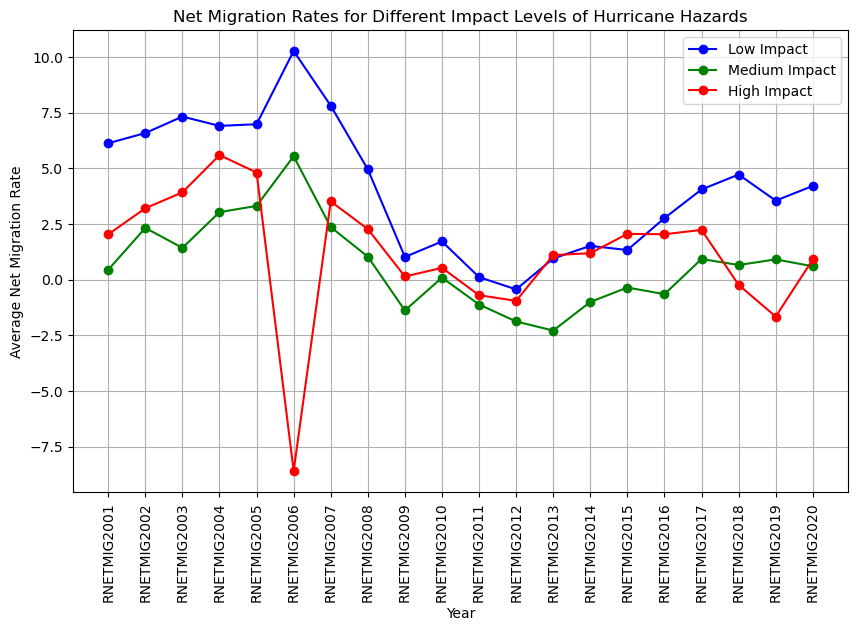

In [332]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(hurricane_county_low_mean.index, hurricane_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(hurricane_county_med_mean.index, hurricane_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(hurricane_county_high_mean.index, hurricane_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Hurricane Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

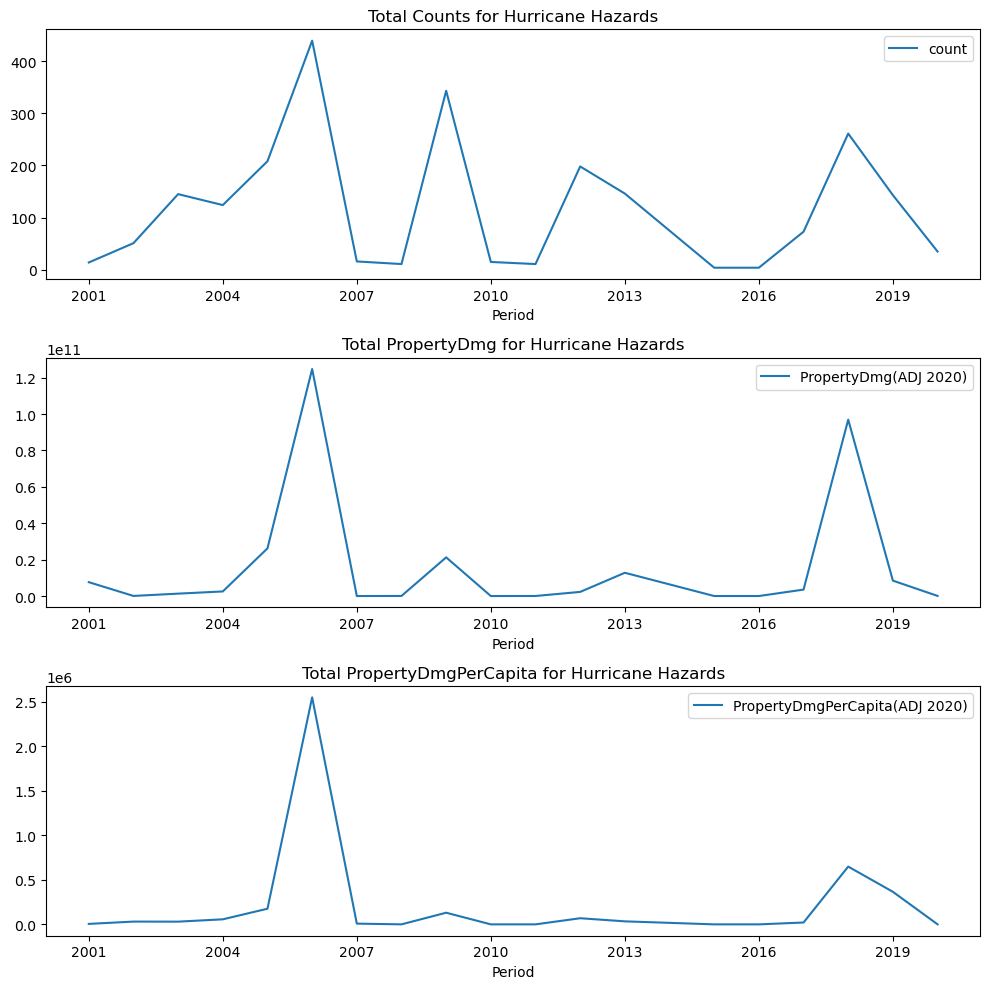

In [333]:
fig, axes = plt.subplots(3,1,figsize=(10,10))
hurricane_year.plot.line("Period","count",ax=axes[0],title="Total Counts for Hurricane Hazards")
hurricane_year.plot.line("Period","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Hurricane Hazards") 
hurricane_year.plot.line("Period","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Hurricane Hazards")
for ax in axes:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_xlabel("Period")
plt.tight_layout()
plt.show()

Hurricane sandy in 2012

In [334]:
wildfire_year = SHELDUS_0020_use[SHELDUS_0020_use["Hazard"]=="Wildfire"]

wildfire_year = wildfire_year[~((wildfire_year['Year'] == 2000) & (wildfire_year['Month'] <= 6))]
wildfire_year = wildfire_year[~((wildfire_year['Year'] == 2020) & (wildfire_year['Month'] >= 7))]

wildfire_year['Period'] = wildfire_year.apply(determine_period, axis=1)

wildfire_year = wildfire_year.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
    
}).reset_index()
wildfire_year = wildfire_year.rename(columns={"Month":"count"})

In [335]:
wildfire_county_low = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[0])].reset_index(drop=True)
wildfire_county_low_mean = wildfire_county_low[correct_netmig_columns].mean()
wildfire_county_med = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[1])].reset_index(drop=True)
wildfire_county_med_mean = wildfire_county_med[correct_netmig_columns].mean()
wildfire_county_high = df_pep_0120[df_pep_0120["FIPS"].isin(wildfire_county_list_20[2])].reset_index(drop=True)
wildfire_county_high_mean = wildfire_county_high[correct_netmig_columns].mean()

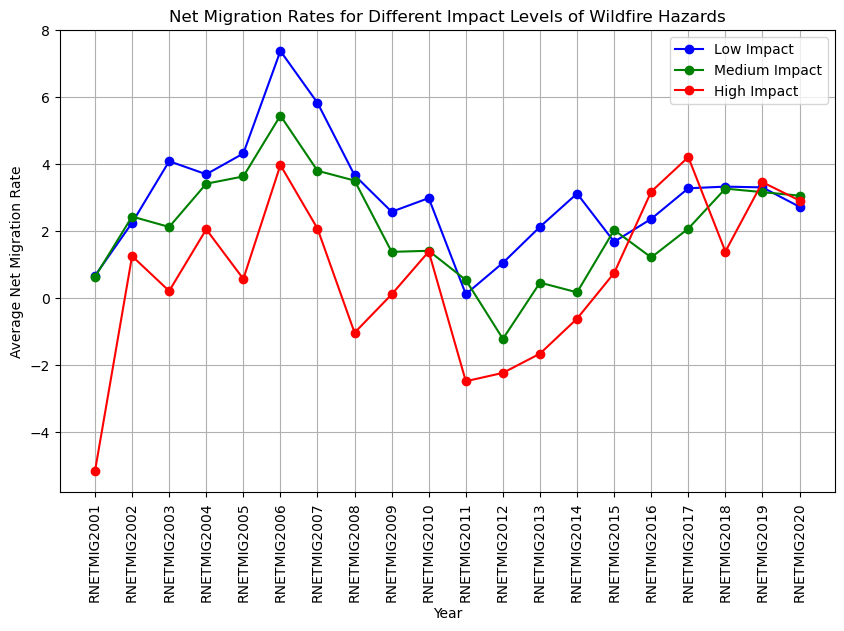

In [336]:
# Create a line chart with multiple lines
plt.figure(figsize=(10, 6))

# Plot each dataset
plt.plot(wildfire_county_low_mean.index, wildfire_county_low_mean.values, marker='o', linestyle='-', color='b', label='Low Impact')
plt.plot(wildfire_county_med_mean.index, wildfire_county_med_mean.values, marker='o', linestyle='-', color='g', label='Medium Impact')
plt.plot(wildfire_county_high_mean.index, wildfire_county_high_mean.values, marker='o', linestyle='-', color='r', label='High Impact')

# Add titles and labels
plt.title('Net Migration Rates for Different Impact Levels of Wildfire Hazards')
plt.xlabel('Year')
plt.ylabel('Average Net Migration Rate')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Add a legend
plt.legend()

# Display the plot
plt.grid(True)
plt.show()

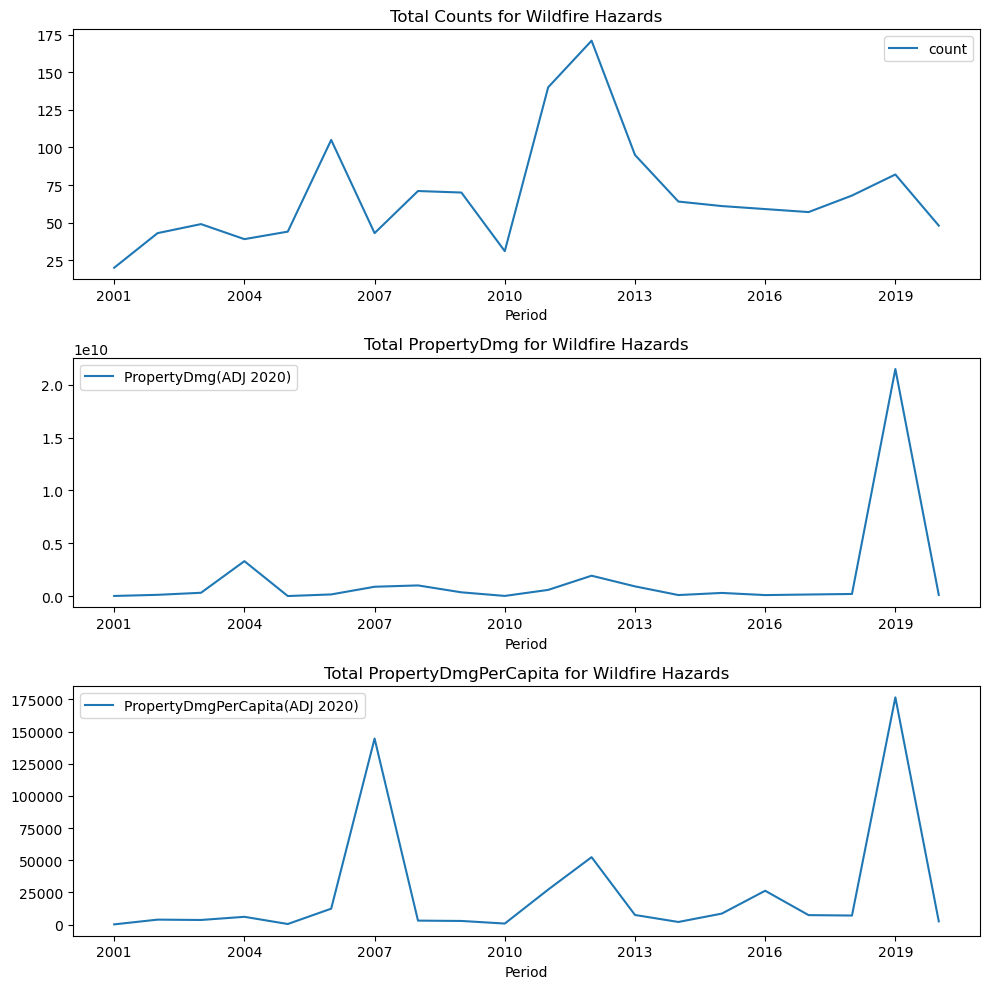

In [337]:
fig, axes = plt.subplots(3,1,figsize=(10,10))
wildfire_year.plot.line("Period","count",ax=axes[0],title="Total Counts for Wildfire Hazards")
wildfire_year.plot.line("Period","PropertyDmg(ADJ 2020)",ax=axes[1],title="Total PropertyDmg for Wildfire Hazards") 
wildfire_year.plot.line("Period","PropertyDmgPerCapita(ADJ 2020)",ax=axes[2],title="Total PropertyDmgPerCapita for Wildfire Hazards")
for ax in axes:
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True))
    ax.set_xlabel("Period")
plt.tight_layout()
plt.show()

In [338]:
# NMR= [gdf_NMR.NetMigrationRate.mean(),gdf_NMR.NetMigrationRate.min(),gdf_NMR.NetMigrationRate.max(),gdf_NMR.NetMigrationRate.std()]
# NMR_f= [gdf_NMR_flooding.NetMigrationRate1.mean(),gdf_NMR_flooding.NetMigrationRate.min(),gdf_NMR_flooding.NetMigrationRate.max(),gdf_NMR_flooding.NetMigrationRate.std()]
# NMR_h= [gdf_NMR_hurricane.NetMigrationRate.mean(),gdf_NMR_hurricane.NetMigrationRate.min(),gdf_NMR_hurricane.NetMigrationRate.max(),gdf_NMR_hurricane.NetMigrationRate.std()]
# NMR_w= [gdf_NMR_wildfire.NetMigrationRate.mean(),gdf_NMR_wildfire.NetMigrationRate.min(),gdf_NMR_wildfire.NetMigrationRate.max(),gdf_NMR_wildfire.NetMigrationRate.std()]

count_f = [gdf_SHELDUS_20_flooding_county["count"].mean(),gdf_SHELDUS_20_flooding_county["count"].min(),gdf_SHELDUS_20_flooding_county["count"].max(),gdf_SHELDUS_20_flooding_county["count"].std()]
count_h = [gdf_SHELDUS_20_hurricane_county["count"].mean(),gdf_SHELDUS_20_hurricane_county["count"].min(),gdf_SHELDUS_20_hurricane_county["count"].max(),gdf_SHELDUS_20_hurricane_county["count"].std()]
count_w = [gdf_SHELDUS_20_wildfire_county["count"].mean(),gdf_SHELDUS_20_wildfire_county["count"].min(),gdf_SHELDUS_20_wildfire_county["count"].max(),gdf_SHELDUS_20_wildfire_county["count"].std()]

# Regression Analysis<a class="anchor" id="re"></a>

### CDC SVI 2010 is used
https://www.atsdr.cdc.gov/placeandhealth/svi/documentation/pdf/SVI-2010-Documentation-H.pdf

In [339]:
def append_stars(row):
    if row['p-value'] < 0.001:
        return f"{row['Coefficient']}***"
    elif row['p-value'] < 0.01:
        return f"{row['Coefficient']}**"
    elif row['p-value'] < 0.05:
        return f"{row['Coefficient']}*"
    else:
        return row['Coefficient']

In [340]:
# used_list = ["E_TOTPOP","E_HU","E_POV","E_UNEMP","E_PCI","E_NOHSDIP","AGE65","AGE17","SNGPRNT","MINORITY","E_LIMENG","E_MUNIT","E_MOBILE","E_CROWD","E_NOVEH"]
used_list = ["E_P_POV","E_P_UNEMP","E_P_PCI","E_P_NOHSDIP","P_AGE65","P_AGE17","P_SNGPRNT","P_MINORITY","E_P_LIMENG","E_P_MUNIT","E_P_MOBILE","E_P_CROWD","E_P_NOVEH","P_GROUPQ"]
# used_list = ["E_TOTPOP","E_HU","E_HH","E_POV150","E_UNEMP","E_AGE65","E_AGE17","E_SNGPNT","E_MINRTY","E_MOBILE","E_NOVEH","EP_UNEMP"]
name_list = ["BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]

In [341]:
floodingFips = list(gdf_NMR_flooding.FIPS)
gdf_SHELDUS_20_flooding_county = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips)].reset_index(drop=True)
SVI_20_use_flooding = SVI_10[SVI_10["FIPS"].isin(floodingFips)].reset_index()
gdf_SHELDUS_20_flooding_county[name_list] = SVI_20_use_flooding[used_list]

### Do the z-score normalization for each column

In [342]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county[columns_to_normalize] - gdf_SHELDUS_20_flooding_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county[columns_to_normalize].std()

### Regression results for all flooding impact counties

In [477]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_f =  gdf_SHELDUS_20_flooding_county[input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

all_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
all_flooding_cor['R-squared'] = model.rsquared

all_flooding_cor['Coefficient'] = all_flooding_cor['Coefficient'].astype(float).round(5)
all_flooding_cor['Std Error'] = all_flooding_cor['Std Error'].astype(float).round(5)
all_flooding_cor['p-value'] = all_flooding_cor['p-value'].astype(float).round(5)
all_flooding_cor['R-squared'] = all_flooding_cor['R-squared'].astype(float).round(5)
all_flooding_cor['CI_lower'] = all_flooding_cor['CI_lower'].astype(float).round(5)
all_flooding_cor['CI_upper'] = all_flooding_cor['CI_upper'].astype(float).round(5)
all_flooding_cor['Coefficient'] = all_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.298
Model:                            OLS   Adj. R-squared:                  0.294
Method:                 Least Squares   F-statistic:                     65.08
Date:                Thu, 08 Aug 2024   Prob (F-statistic):          2.33e-196
Time:                        02:40:33   Log-Likelihood:                -9253.3
No. Observations:                2774   AIC:                         1.854e+04
Df Residuals:                    2755   BIC:                         1.866e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

### Regression results for all flooding impact counties only with disaster variables

In [479]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_f =  gdf_SHELDUS_20_flooding_county[input_list]
Y_f =  gdf_NMR_flooding["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

all_flooding_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_flooding_cor_dis['R-squared'] = model.rsquared

all_flooding_cor_dis['Coefficient'] = all_flooding_cor_dis['Coefficient'].astype(float).round(5)
all_flooding_cor_dis['Std Error'] = all_flooding_cor_dis['Std Error'].astype(float).round(5)
all_flooding_cor_dis['p-value'] = all_flooding_cor_dis['p-value'].astype(float).round(5)
all_flooding_cor_dis['R-squared'] = all_flooding_cor_dis['R-squared'].astype(float).round(5)
all_flooding_cor_dis['CI_lower'] = all_flooding_cor_dis['CI_lower'].astype(float).round(5)
all_flooding_cor_dis['CI_upper'] = all_flooding_cor_dis['CI_upper'].astype(float).round(5)
all_flooding_cor_dis['Coefficient'] = all_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.032
Model:                            OLS   Adj. R-squared:                  0.030
Method:                 Least Squares   F-statistic:                     22.63
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           2.05e-18
Time:                        02:41:09   Log-Likelihood:                -9700.1
No. Observations:                2774   AIC:                         1.941e+04
Df Residuals:                    2769   BIC:                         1.944e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [346]:
all_flooding_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,0.19045,0.15179,0.20967,0.03165
count,-1.11279***,0.15528,0.00000,0.03165
Fatalities,0.95777***,0.16426,0.00000,0.03165
Injuries,0.28923,0.16333,0.07669,0.03165
PropertyDmgPerCapita(ADJ 2020),-0.42315**,0.15196,0.00540,0.03165


In [347]:
HurricaneList = list(gdf_SHELDUS_20_hurricane_county["County FIPS"])
SVI_20_use_hurricane = SVI_10[SVI_10["FIPS"].isin(HurricaneList)].reset_index()
gdf_SHELDUS_20_hurricane_county[name_list] = SVI_20_use_hurricane[used_list]

In [348]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county[columns_to_normalize].std()

### Regression results for all hurricane impact counties

In [480]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_h =  gdf_SHELDUS_20_hurricane_county[input_list]
Y_h =  gdf_NMR_hurricane["NetMigrationRate1"]
data = pd.concat([X_h, Y_h], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_h_clean = data[input_list]
Y_h_clean = data["NetMigrationRate1"]
X_h_clean = sm.add_constant(X_h_clean)
model = sm.OLS(Y_h_clean, X_h_clean).fit()
print(model.summary())

all_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_hurricane_cor['R-squared'] = model.rsquared

all_hurricane_cor['Coefficient'] = all_hurricane_cor['Coefficient'].astype(float).round(5)
all_hurricane_cor['Std Error'] = all_hurricane_cor['Std Error'].astype(float).round(5)
all_hurricane_cor['p-value'] = all_hurricane_cor['p-value'].astype(float).round(5)
all_hurricane_cor['R-squared'] = all_hurricane_cor['R-squared'].astype(float).round(5)
all_hurricane_cor['CI_lower'] = all_hurricane_cor['CI_lower'].astype(float).round(5)
all_hurricane_cor['CI_upper'] = all_hurricane_cor['CI_upper'].astype(float).round(5)
all_hurricane_cor['Coefficient'] = all_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.495
Model:                            OLS   Adj. R-squared:                  0.482
Method:                 Least Squares   F-statistic:                     38.16
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           2.26e-91
Time:                        02:41:37   Log-Likelihood:                -2441.7
No. Observations:                 721   AIC:                             4921.
Df Residuals:                     702   BIC:                             5008.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [350]:
all_hurricane_cor

,Coefficient,Std Error,p-value,R-squared
const,1.63813***,0.26999,0.00000,0.49455
count,-0.50035,0.29576,0.09114,0.49455
Fatalities,-0.66772*,0.28085,0.01770,0.49455
Injuries,0.2929,0.27643,0.28970,0.49455
PropertyDmgPerCapita(ADJ 2020),-0.95223***,0.27810,0.00065,0.49455
BelowPoverty,-2.12528***,0.57449,0.00023,0.49455
16+Unemployed,0.44025,0.38032,0.24743,0.49455
PerCapitaIncome,-0.73766,0.65426,0.25993,0.49455
NoHighSchoolDiploma25+,-2.83182***,0.53793,0.00000,0.49455
65+,1.24947**,0.48175,0.00970,0.49455


### Regression results for all hurricane impact counties only with disaster variables

In [481]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_h =  gdf_SHELDUS_20_hurricane_county[input_list]
Y_h =  gdf_NMR_hurricane["NetMigrationRate1"]
data = pd.concat([X_h, Y_h], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_h_clean = data[input_list]
Y_h_clean = data["NetMigrationRate1"]
X_h_clean = sm.add_constant(X_h_clean)
model = sm.OLS(Y_h_clean, X_h_clean).fit()
print(model.summary())

all_hurricane_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_hurricane_cor_dis['R-squared'] = model.rsquared

all_hurricane_cor_dis['Coefficient'] = all_hurricane_cor_dis['Coefficient'].astype(float).round(5)
all_hurricane_cor_dis['Std Error'] = all_hurricane_cor_dis['Std Error'].astype(float).round(5)
all_hurricane_cor_dis['p-value'] = all_hurricane_cor_dis['p-value'].astype(float).round(5)
all_hurricane_cor_dis['R-squared'] = all_hurricane_cor_dis['R-squared'].astype(float).round(5)
all_hurricane_cor_dis['CI_lower'] = all_hurricane_cor_dis['CI_lower'].astype(float).round(5)
all_hurricane_cor_dis['CI_upper'] = all_hurricane_cor_dis['CI_upper'].astype(float).round(5)
all_hurricane_cor_dis['Coefficient'] = all_hurricane_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     4.931
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           0.000631
Time:                        02:42:40   Log-Likelihood:                -2677.9
No. Observations:                 721   AIC:                             5366.
Df Residuals:                     716   BIC:                             5389.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [352]:
wildfireFips = list(gdf_NMR_wildfire.FIPS)
SVI_20_use_wildfire = SVI_10[SVI_10["FIPS"].isin(wildfireFips)].reset_index()
gdf_SHELDUS_20_wildfire_county[name_list] = SVI_20_use_wildfire[used_list]

In [353]:
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county[columns_to_normalize].std()

### Regression results for all wildfire impact counties

In [482]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
X_w =  gdf_SHELDUS_20_wildfire_county[input_list]
Y_w =  gdf_NMR_wildfire["NetMigrationRate1"]
data = pd.concat([X_w, Y_w], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_w_clean = data[input_list]
Y_w_clean = data["NetMigrationRate1"]
X_w_clean = sm.add_constant(X_w_clean)
model = sm.OLS(Y_w_clean, X_w_clean).fit()
print(model.summary())

all_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_wildfire_cor['R-squared'] = model.rsquared

all_wildfire_cor['Coefficient'] = all_wildfire_cor['Coefficient'].astype(float).round(5)
all_wildfire_cor['Std Error'] = all_wildfire_cor['Std Error'].astype(float).round(5)
all_wildfire_cor['p-value'] = all_wildfire_cor['p-value'].astype(float).round(5)
all_wildfire_cor['R-squared'] = all_wildfire_cor['R-squared'].astype(float).round(5)
all_wildfire_cor['CI_lower'] = all_wildfire_cor['CI_lower'].astype(float).round(5)
all_wildfire_cor['CI_upper'] = all_wildfire_cor['CI_upper'].astype(float).round(5)
all_wildfire_cor['Coefficient'] = all_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.292
Method:                 Least Squares   F-statistic:                     13.51
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           2.72e-33
Time:                        02:42:58   Log-Likelihood:                -1901.1
No. Observations:                 546   AIC:                             3840.
Df Residuals:                     527   BIC:                             3922.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [355]:
all_wildfire_cor

,Coefficient,Std Error,p-value,R-squared
const,1.9616***,0.34277,0.00000,0.31567
count,0.14174,0.49422,0.77438,0.31567
Fatalities,0.86514*,0.41639,0.03822,0.31567
Injuries,-0.83084,0.51090,0.10450,0.31567
PropertyDmgPerCapita(ADJ 2020),-1.33006***,0.37395,0.00041,0.31567
BelowPoverty,-1.50315*,0.62538,0.01658,0.31567
16+Unemployed,2.54486***,0.45495,0.00000,0.31567
PerCapitaIncome,1.66969**,0.64405,0.00979,0.31567
NoHighSchoolDiploma25+,-1.80136*,0.73008,0.01393,0.31567
65+,0.04156,0.60219,0.94500,0.31567


### Regression results for all wildfire impact counties only with disaster variables

In [483]:
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
X_w =  gdf_SHELDUS_20_wildfire_county[input_list]
Y_w =  gdf_NMR_wildfire["NetMigrationRate1"]
data = pd.concat([X_w, Y_w], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_w_clean = data[input_list]
Y_w_clean = data["NetMigrationRate1"]
X_w_clean = sm.add_constant(X_w_clean)
model = sm.OLS(Y_w_clean, X_w_clean).fit()
print(model.summary())

all_wildfire_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

all_wildfire_cor_dis['R-squared'] = model.rsquared

all_wildfire_cor_dis['Coefficient'] = all_wildfire_cor_dis['Coefficient'].astype(float).round(5)
all_wildfire_cor_dis['Std Error'] = all_wildfire_cor_dis['Std Error'].astype(float).round(5)
all_wildfire_cor_dis['p-value'] = all_wildfire_cor_dis['p-value'].astype(float).round(5)
all_wildfire_cor_dis['R-squared'] = all_wildfire_cor_dis['R-squared'].astype(float).round(5)
all_wildfire_cor_dis['CI_lower'] = all_wildfire_cor_dis['CI_lower'].astype(float).round(5)
all_wildfire_cor_dis['CI_upper'] = all_wildfire_cor_dis['CI_upper'].astype(float).round(5)
all_wildfire_cor_dis['Coefficient'] = all_wildfire_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     2.329
Date:                Thu, 08 Aug 2024   Prob (F-statistic):             0.0551
Time:                        02:43:21   Log-Likelihood:                -2000.0
No. Observations:                 546   AIC:                             4010.
Df Residuals:                     541   BIC:                             4031.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [357]:
all_wildfire_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,1.9616***,0.40548,0.00000,0.01693
count,0.84396,0.55338,0.12782,0.01693
Fatalities,1.05905*,0.48669,0.02999,0.01693
Injuries,-1.0981,0.59093,0.06367,0.01693
PropertyDmgPerCapita(ADJ 2020),-0.94842*,0.43355,0.02913,0.01693


### Regression results of flooding affected counties in med&high impact and high impact levels

In [484]:
floodingFips_medhigh = list(flooding_county_med.FIPS) + list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_medhigh = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
SVI_20_use_flooding_medhigh = SVI_10[SVI_10["FIPS"].isin(floodingFips_medhigh)].reset_index()
gdf_SHELDUS_20_flooding_county_medhigh[name_list] = SVI_20_use_flooding_medhigh[used_list]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].std()
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
gdf_NMR_flooding_medhigh = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_medhigh[input_list]
Y_f =  gdf_NMR_flooding_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_flooding_cor['R-squared'] = model.rsquared

medhigh_flooding_cor['Coefficient'] = medhigh_flooding_cor['Coefficient'].astype(float).round(5)
medhigh_flooding_cor['Std Error'] = medhigh_flooding_cor['Std Error'].astype(float).round(5)
medhigh_flooding_cor['p-value'] = medhigh_flooding_cor['p-value'].astype(float).round(5)
medhigh_flooding_cor['R-squared'] = medhigh_flooding_cor['R-squared'].astype(float).round(5)
medhigh_flooding_cor['CI_lower'] = medhigh_flooding_cor['CI_lower'].astype(float).round(5)
medhigh_flooding_cor['CI_upper'] = medhigh_flooding_cor['CI_upper'].astype(float).round(5)
medhigh_flooding_cor['Coefficient'] = medhigh_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.310
Model:                            OLS   Adj. R-squared:                  0.304
Method:                 Least Squares   F-statistic:                     50.85
Date:                Thu, 08 Aug 2024   Prob (F-statistic):          1.65e-149
Time:                        02:43:43   Log-Likelihood:                -6841.2
No. Observations:                2060   AIC:                         1.372e+04
Df Residuals:                    2041   BIC:                         1.383e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [359]:
medhigh_flooding_cor

,Coefficient,Std Error,p-value,R-squared
const,-0.35818*,0.14829,0.01580,0.3096
count,-0.8506***,0.15781,0.00000,0.3096
Fatalities,0.74186***,0.15918,0.00000,0.3096
Injuries,0.37595*,0.15752,0.01709,0.3096
PropertyDmgPerCapita(ADJ 2020),-0.33731*,0.14962,0.02428,0.3096
BelowPoverty,-0.86754**,0.30607,0.00464,0.3096
16+Unemployed,1.40776***,0.21928,0.00000,0.3096
PerCapitaIncome,2.17081***,0.28170,0.00000,0.3096
NoHighSchoolDiploma25+,-0.32759,0.27715,0.23735,0.3096
65+,-0.95857***,0.25458,0.00017,0.3096


In [485]:
floodingFips_medhigh = list(flooding_county_med.FIPS) + list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_medhigh = gdf_SHELDUS_20_flooding_county[gdf_SHELDUS_20_flooding_county["County FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
SVI_20_use_flooding_medhigh = SVI_10[SVI_10["FIPS"].isin(floodingFips_medhigh)].reset_index()
gdf_SHELDUS_20_flooding_county_medhigh[name_list] = SVI_20_use_flooding_medhigh[used_list]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_medhigh[columns_to_normalize].std()
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_NMR_flooding_medhigh = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_medhigh[input_list]
Y_f =  gdf_NMR_flooding_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_flooding_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_flooding_cor_dis['R-squared'] = model.rsquared

medhigh_flooding_cor_dis['Coefficient'] = medhigh_flooding_cor_dis['Coefficient'].astype(float).round(5)
medhigh_flooding_cor_dis['Std Error'] = medhigh_flooding_cor_dis['Std Error'].astype(float).round(5)
medhigh_flooding_cor_dis['p-value'] = medhigh_flooding_cor_dis['p-value'].astype(float).round(5)
medhigh_flooding_cor_dis['R-squared'] = medhigh_flooding_cor_dis['R-squared'].astype(float).round(5)
medhigh_flooding_cor_dis['CI_lower'] = medhigh_flooding_cor_dis['CI_lower'].astype(float).round(5)
medhigh_flooding_cor_dis['CI_upper'] = medhigh_flooding_cor_dis['CI_upper'].astype(float).round(5)
medhigh_flooding_cor_dis['Coefficient'] = medhigh_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.040
Model:                            OLS   Adj. R-squared:                  0.038
Method:                 Least Squares   F-statistic:                     21.26
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           3.38e-17
Time:                        02:44:05   Log-Likelihood:                -7181.0
No. Observations:                2060   AIC:                         1.437e+04
Df Residuals:                    2055   BIC:                         1.440e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [361]:
medhigh_flooding_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,-0.35818*,0.17429,0.04000,0.03973
count,-1.30609***,0.17881,0.00000,0.03973
Fatalities,1.01953***,0.18407,0.00000,0.03973
Injuries,0.38981*,0.18423,0.03447,0.03973
PropertyDmgPerCapita(ADJ 2020),-0.4186*,0.17490,0.01678,0.03973


In [486]:
floodingFips_high = list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_high = gdf_SHELDUS_20_flooding_county_high[gdf_SHELDUS_20_flooding_county_high["County FIPS"].isin(floodingFips_high)].reset_index(drop=True)
SVI_20_use_flooding_high = SVI_10[SVI_10["FIPS"].isin(floodingFips_high)].reset_index()
gdf_SHELDUS_20_flooding_county_high[name_list] = SVI_20_use_flooding_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].std()
gdf_NMR_flooding_high = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_high[input_list]
Y_f =  gdf_NMR_flooding_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_flooding_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_flooding_cor['R-squared'] = model.rsquared

high_flooding_cor['Coefficient'] = high_flooding_cor['Coefficient'].astype(float).round(5)
high_flooding_cor['Std Error'] = high_flooding_cor['Std Error'].astype(float).round(5)
high_flooding_cor['p-value'] = high_flooding_cor['p-value'].astype(float).round(5)
high_flooding_cor['R-squared'] = high_flooding_cor['R-squared'].astype(float).round(5)
high_flooding_cor['CI_lower'] = high_flooding_cor['CI_lower'].astype(float).round(5)
high_flooding_cor['CI_upper'] = high_flooding_cor['CI_upper'].astype(float).round(5)
high_flooding_cor['Coefficient'] = high_flooding_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.320
Model:                            OLS   Adj. R-squared:                  0.301
Method:                 Least Squares   F-statistic:                     16.98
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           1.52e-43
Time:                        02:44:28   Log-Likelihood:                -2216.7
No. Observations:                 670   AIC:                             4471.
Df Residuals:                     651   BIC:                             4557.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [363]:
high_flooding_cor

,Coefficient,Std Error,p-value,R-squared
const,-1.21876***,0.25930,0.00000,0.31952
count,-0.90198**,0.28044,0.00136,0.31952
Fatalities,1.24893***,0.30453,0.00005,0.31952
Injuries,0.35886,0.29490,0.22409,0.31952
PropertyDmgPerCapita(ADJ 2020),-0.33401,0.26579,0.20934,0.31952
BelowPoverty,-0.23514,0.53924,0.66294,0.31952
16+Unemployed,1.47048***,0.40299,0.00028,0.31952
PerCapitaIncome,2.28408***,0.47908,0.00000,0.31952
NoHighSchoolDiploma25+,-0.12211,0.49656,0.80582,0.31952
65+,-1.40337**,0.47606,0.00331,0.31952


In [487]:
floodingFips_high = list(flooding_county_high.FIPS)
gdf_SHELDUS_20_flooding_county_high = gdf_SHELDUS_20_flooding_county_high[gdf_SHELDUS_20_flooding_county_high["County FIPS"].isin(floodingFips_high)].reset_index(drop=True)
SVI_20_use_flooding_high = SVI_10[SVI_10["FIPS"].isin(floodingFips_high)].reset_index()
gdf_SHELDUS_20_flooding_county_high[name_list] = SVI_20_use_flooding_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] = (gdf_SHELDUS_20_flooding_county_high[columns_to_normalize] - gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_flooding_county_high[columns_to_normalize].std()
gdf_NMR_flooding_high = gdf_NMR_flooding[gdf_NMR_flooding["FIPS"].isin(floodingFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_flooding_county_high[input_list]
Y_f =  gdf_NMR_flooding_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_flooding_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_flooding_cor_dis['R-squared'] = model.rsquared

high_flooding_cor_dis['Coefficient'] = high_flooding_cor_dis['Coefficient'].astype(float).round(5)
high_flooding_cor_dis['Std Error'] = high_flooding_cor_dis['Std Error'].astype(float).round(5)
high_flooding_cor_dis['p-value'] = high_flooding_cor_dis['p-value'].astype(float).round(5)
high_flooding_cor_dis['R-squared'] = high_flooding_cor_dis['R-squared'].astype(float).round(5)
high_flooding_cor_dis['CI_lower'] = high_flooding_cor_dis['CI_lower'].astype(float).round(5)
high_flooding_cor_dis['CI_upper'] = high_flooding_cor_dis['CI_upper'].astype(float).round(5)
high_flooding_cor_dis['Coefficient'] = high_flooding_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     10.23
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           4.79e-08
Time:                        02:44:57   Log-Likelihood:                -2325.6
No. Observations:                 670   AIC:                             4661.
Df Residuals:                     665   BIC:                             4684.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [365]:
high_flooding_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,-1.21876***,0.30186,0.00006,0.05799
count,-1.27041***,0.31021,0.00005,0.05799
Fatalities,1.48569***,0.34914,0.00002,0.05799
Injuries,0.46227,0.34171,0.17658,0.05799
PropertyDmgPerCapita(ADJ 2020),-0.35199,0.30326,0.24619,0.05799


### Regression results of hurricane affected counties in med&high impact and high impact levels

In [488]:
hurricaneFips_medhigh = list(hurricane_county_med.FIPS) + list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_medhigh = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["County FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
SVI_20_use_hurricane_medhigh = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_medhigh)].reset_index()
gdf_SHELDUS_20_hurricane_county_medhigh[name_list] = SVI_20_use_hurricane_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].std()
gdf_NMR_hurricane_medhigh = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_medhigh[input_list]
Y_f =  gdf_NMR_hurricane_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_hurricane_cor['R-squared'] = model.rsquared

medhigh_hurricane_cor['Coefficient'] = medhigh_hurricane_cor['Coefficient'].astype(float).round(5)
medhigh_hurricane_cor['Std Error'] = medhigh_hurricane_cor['Std Error'].astype(float).round(5)
medhigh_hurricane_cor['p-value'] = medhigh_hurricane_cor['p-value'].astype(float).round(5)
medhigh_hurricane_cor['R-squared'] = medhigh_hurricane_cor['R-squared'].astype(float).round(5)
medhigh_hurricane_cor['CI_lower'] = medhigh_hurricane_cor['CI_lower'].astype(float).round(5)
medhigh_hurricane_cor['CI_upper'] = medhigh_hurricane_cor['CI_upper'].astype(float).round(5)
medhigh_hurricane_cor['Coefficient'] = medhigh_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.509
Model:                            OLS   Adj. R-squared:                  0.492
Method:                 Least Squares   F-statistic:                     30.41
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           8.76e-70
Time:                        02:45:15   Log-Likelihood:                -1848.0
No. Observations:                 547   AIC:                             3734.
Df Residuals:                     528   BIC:                             3816.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [367]:
medhigh_hurricane_cor

,Coefficient,Std Error,p-value,R-squared
const,0.8496**,0.30881,0.00614,0.50898
count,-0.18686,0.34337,0.58654,0.50898
Fatalities,-0.81427*,0.32294,0.01198,0.50898
Injuries,0.25331,0.31705,0.42467,0.50898
PropertyDmgPerCapita(ADJ 2020),-1.04743**,0.31793,0.00105,0.50898
BelowPoverty,-2.0299**,0.68304,0.00310,0.50898
16+Unemployed,-0.01322,0.43594,0.97581,0.50898
PerCapitaIncome,0.26928,0.77027,0.72678,0.50898
NoHighSchoolDiploma25+,-2.84647***,0.60668,0.00000,0.50898
65+,2.31274***,0.58581,0.00009,0.50898


In [489]:
hurricaneFips_medhigh = list(hurricane_county_med.FIPS) + list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_medhigh = gdf_SHELDUS_20_hurricane_county[gdf_SHELDUS_20_hurricane_county["County FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
SVI_20_use_hurricane_medhigh = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_medhigh)].reset_index()
gdf_SHELDUS_20_hurricane_county_medhigh[name_list] = SVI_20_use_hurricane_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_medhigh[columns_to_normalize].std()
gdf_NMR_hurricane_medhigh = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_medhigh[input_list]
Y_f =  gdf_NMR_hurricane_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_hurricane_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_hurricane_cor_dis['R-squared'] = model.rsquared

medhigh_hurricane_cor_dis['Coefficient'] = medhigh_hurricane_cor_dis['Coefficient'].astype(float).round(5)
medhigh_hurricane_cor_dis['Std Error'] = medhigh_hurricane_cor_dis['Std Error'].astype(float).round(5)
medhigh_hurricane_cor_dis['p-value'] = medhigh_hurricane_cor_dis['p-value'].astype(float).round(5)
medhigh_hurricane_cor_dis['R-squared'] = medhigh_hurricane_cor_dis['R-squared'].astype(float).round(5)
medhigh_hurricane_cor_dis['CI_lower'] = medhigh_hurricane_cor_dis['CI_lower'].astype(float).round(5)
medhigh_hurricane_cor_dis['CI_upper'] = medhigh_hurricane_cor_dis['CI_upper'].astype(float).round(5)
medhigh_hurricane_cor_dis['Coefficient'] = medhigh_hurricane_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     4.269
Date:                Thu, 08 Aug 2024   Prob (F-statistic):            0.00207
Time:                        02:45:47   Log-Likelihood:                -2034.1
No. Observations:                 547   AIC:                             4078.
Df Residuals:                     542   BIC:                             4100.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [369]:
medhigh_hurricane_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,0.8496*,0.42827,0.04778,0.03054
count,0.07983,0.44362,0.85726,0.03054
Fatalities,-1.25708**,0.43882,0.00434,0.03054
Injuries,1.08685*,0.42944,0.01166,0.03054
PropertyDmgPerCapita(ADJ 2020),-0.61163,0.43326,0.15862,0.03054


In [490]:
hurricaneFips_high = list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_high = gdf_SHELDUS_20_hurricane_county_high[gdf_SHELDUS_20_hurricane_county_high["County FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
SVI_20_use_hurricane_high = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_high)].reset_index()
gdf_SHELDUS_20_hurricane_county_high[name_list] = SVI_20_use_hurricane_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].std()
gdf_NMR_hurricane_high = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_high[input_list]
Y_f =  gdf_NMR_hurricane_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_hurricane_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_hurricane_cor['R-squared'] = model.rsquared

high_hurricane_cor['Coefficient'] = high_hurricane_cor['Coefficient'].astype(float).round(5)
high_hurricane_cor['Std Error'] = high_hurricane_cor['Std Error'].astype(float).round(5)
high_hurricane_cor['p-value'] = high_hurricane_cor['p-value'].astype(float).round(5)
high_hurricane_cor['R-squared'] = high_hurricane_cor['R-squared'].astype(float).round(5)
high_hurricane_cor['CI_lower'] = high_hurricane_cor['CI_lower'].astype(float).round(5)
high_hurricane_cor['CI_upper'] = high_hurricane_cor['CI_upper'].astype(float).round(5)
high_hurricane_cor['Coefficient'] = high_hurricane_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.571
Model:                            OLS   Adj. R-squared:                  0.523
Method:                 Least Squares   F-statistic:                     11.97
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           1.50e-21
Time:                        02:46:06   Log-Likelihood:                -611.26
No. Observations:                 181   AIC:                             1261.
Df Residuals:                     162   BIC:                             1321.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [491]:
hurricaneFips_high = list(hurricane_county_high.FIPS)
gdf_SHELDUS_20_hurricane_county_high = gdf_SHELDUS_20_hurricane_county_high[gdf_SHELDUS_20_hurricane_county_high["County FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
SVI_20_use_hurricane_high = SVI_10[SVI_10["FIPS"].isin(hurricaneFips_high)].reset_index()
gdf_SHELDUS_20_hurricane_county_high[name_list] = SVI_20_use_hurricane_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] = (gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize] - gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_hurricane_county_high[columns_to_normalize].std()
gdf_NMR_hurricane_high = gdf_NMR_hurricane[gdf_NMR_hurricane["FIPS"].isin(hurricaneFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_hurricane_county_high[input_list]
Y_f =  gdf_NMR_hurricane_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_hurricane_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_hurricane_cor_dis['R-squared'] = model.rsquared

high_hurricane_cor_dis['Coefficient'] = high_hurricane_cor_dis['Coefficient'].astype(float).round(5)
high_hurricane_cor_dis['Std Error'] = high_hurricane_cor_dis['Std Error'].astype(float).round(5)
high_hurricane_cor_dis['p-value'] = high_hurricane_cor_dis['p-value'].astype(float).round(5)
high_hurricane_cor_dis['R-squared'] = high_hurricane_cor_dis['R-squared'].astype(float).round(5)
high_hurricane_cor_dis['CI_lower'] = high_hurricane_cor_dis['CI_lower'].astype(float).round(5)
high_hurricane_cor_dis['CI_upper'] = high_hurricane_cor_dis['CI_upper'].astype(float).round(5)
high_hurricane_cor_dis['Coefficient'] = high_hurricane_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.101
Model:                            OLS   Adj. R-squared:                  0.081
Method:                 Least Squares   F-statistic:                     4.968
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           0.000809
Time:                        02:46:23   Log-Likelihood:                -678.13
No. Observations:                 181   AIC:                             1366.
Df Residuals:                     176   BIC:                             1382.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [372]:
high_hurricane_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,1.1651,0.77289,0.13349,0.10146
count,-1.43228,0.79844,0.07455,0.10146
Fatalities,-1.9186*,0.79779,0.01721,0.10146
Injuries,1.81703*,0.77531,0.02021,0.10146
PropertyDmgPerCapita(ADJ 2020),-1.18937,0.77568,0.12699,0.10146


### Regression results of wildfire affected counties in med&high impact and high impact levels¶

In [492]:
wildfireFips_medhigh = list(wildfire_county_med.FIPS) + list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_medhigh = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["County FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
SVI_20_use_wildfire_medhigh = SVI_10[SVI_10["FIPS"].isin(wildfireFips_medhigh)].reset_index()
gdf_SHELDUS_20_wildfire_county_medhigh[name_list] = SVI_20_use_wildfire_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].std()
gdf_NMR_wildfire_medhigh = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_medhigh[input_list]
Y_f =  gdf_NMR_wildfire_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_wildfire_cor['R-squared'] = model.rsquared

medhigh_wildfire_cor['Coefficient'] = medhigh_wildfire_cor['Coefficient'].astype(float).round(5)
medhigh_wildfire_cor['Std Error'] = medhigh_wildfire_cor['Std Error'].astype(float).round(5)
medhigh_wildfire_cor['p-value'] = medhigh_wildfire_cor['p-value'].astype(float).round(5)
medhigh_wildfire_cor['R-squared'] = medhigh_wildfire_cor['R-squared'].astype(float).round(5)
medhigh_wildfire_cor['CI_lower'] = medhigh_wildfire_cor['CI_lower'].astype(float).round(5)
medhigh_wildfire_cor['CI_upper'] = medhigh_wildfire_cor['CI_upper'].astype(float).round(5)
medhigh_wildfire_cor['Coefficient'] = medhigh_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.338
Model:                            OLS   Adj. R-squared:                  0.308
Method:                 Least Squares   F-statistic:                     11.31
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           2.58e-26
Time:                        02:47:10   Log-Likelihood:                -1448.4
No. Observations:                 418   AIC:                             2935.
Df Residuals:                     399   BIC:                             3011.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [374]:
medhigh_wildfire_cor

,Coefficient,Std Error,p-value,R-squared
const,1.63588***,0.38736,0.00003,0.33789
count,-0.24374,0.57585,0.67233,0.33789
Fatalities,0.93268*,0.46889,0.04737,0.33789
Injuries,-0.67432,0.58903,0.25298,0.33789
PropertyDmgPerCapita(ADJ 2020),-1.36839**,0.42525,0.00140,0.33789
BelowPoverty,-1.12806,0.73552,0.12590,0.33789
16+Unemployed,2.69725***,0.52583,0.00000,0.33789
PerCapitaIncome,2.67625***,0.70999,0.00019,0.33789
NoHighSchoolDiploma25+,-1.44558,0.86097,0.09393,0.33789
65+,-0.38821,0.69162,0.57490,0.33789


In [493]:
wildfireFips_medhigh = list(wildfire_county_med.FIPS) + list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_medhigh = gdf_SHELDUS_20_wildfire_county[gdf_SHELDUS_20_wildfire_county["County FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
SVI_20_use_wildfire_medhigh = SVI_10[SVI_10["FIPS"].isin(wildfireFips_medhigh)].reset_index()
gdf_SHELDUS_20_wildfire_county_medhigh[name_list] = SVI_20_use_wildfire_medhigh[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_medhigh[columns_to_normalize].std()
gdf_NMR_wildfire_medhigh = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_medhigh)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_medhigh[input_list]
Y_f =  gdf_NMR_wildfire_medhigh["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

medhigh_wildfire_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
medhigh_wildfire_cor_dis['R-squared'] = model.rsquared

medhigh_wildfire_cor_dis['Coefficient'] = medhigh_wildfire_cor_dis['Coefficient'].astype(float).round(5)
medhigh_wildfire_cor_dis['Std Error'] = medhigh_wildfire_cor_dis['Std Error'].astype(float).round(5)
medhigh_wildfire_cor_dis['p-value'] = medhigh_wildfire_cor_dis['p-value'].astype(float).round(5)
medhigh_wildfire_cor_dis['R-squared'] = medhigh_wildfire_cor_dis['R-squared'].astype(float).round(5)
medhigh_wildfire_cor_dis['CI_lower'] = medhigh_wildfire_cor_dis['CI_lower'].astype(float).round(5)
medhigh_wildfire_cor_dis['CI_upper'] = medhigh_wildfire_cor_dis['CI_upper'].astype(float).round(5)
medhigh_wildfire_cor_dis['Coefficient'] = medhigh_wildfire_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     1.789
Date:                Thu, 08 Aug 2024   Prob (F-statistic):              0.130
Time:                        02:47:30   Log-Likelihood:                -1531.0
No. Observations:                 418   AIC:                             3072.
Df Residuals:                     413   BIC:                             3092.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [376]:
medhigh_wildfire_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,1.63588***,0.46391,0.00047,0.01703
count,0.56832,0.64745,0.38057,0.01703
Fatalities,1.16999*,0.55299,0.03496,0.01703
Injuries,-1.09191,0.68750,0.11300,0.01703
PropertyDmgPerCapita(ADJ 2020),-0.99183*,0.49596,0.04617,0.01703


In [494]:
wildfireFips_high = list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_high = gdf_SHELDUS_20_wildfire_county_high[gdf_SHELDUS_20_wildfire_county_high["County FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
SVI_20_use_wildfire_high = SVI_10[SVI_10["FIPS"].isin(wildfireFips_high)].reset_index()
gdf_SHELDUS_20_wildfire_county_high[name_list] = SVI_20_use_wildfire_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"] + name_list
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].std()
gdf_NMR_wildfire_high = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_high[input_list]
Y_f =  gdf_NMR_wildfire_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_wildfire_cor = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_wildfire_cor['R-squared'] = model.rsquared

high_wildfire_cor['Coefficient'] = high_wildfire_cor['Coefficient'].astype(float).round(5)
high_wildfire_cor['Std Error'] = high_wildfire_cor['Std Error'].astype(float).round(5)
high_wildfire_cor['p-value'] = high_wildfire_cor['p-value'].astype(float).round(5)
high_wildfire_cor['R-squared'] = high_wildfire_cor['R-squared'].astype(float).round(5)
high_wildfire_cor['CI_lower'] = high_wildfire_cor['CI_lower'].astype(float).round(5)
high_wildfire_cor['CI_upper'] = high_wildfire_cor['CI_upper'].astype(float).round(5)
high_wildfire_cor['Coefficient'] = high_wildfire_cor.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.330
Model:                            OLS   Adj. R-squared:                  0.234
Method:                 Least Squares   F-statistic:                     3.443
Date:                Thu, 08 Aug 2024   Prob (F-statistic):           2.23e-05
Time:                        02:47:46   Log-Likelihood:                -493.99
No. Observations:                 145   AIC:                             1026.
Df Residuals:                     126   BIC:                             1083.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [378]:
high_wildfire_cor

,Coefficient,Std Error,p-value,R-squared
const,0.71469,0.65037,0.27390,0.32969
count,1.00986,0.84521,0.23440,0.32969
Fatalities,0.99596,0.83431,0.23481,0.32969
Injuries,-1.30891,0.88839,0.14315,0.32969
PropertyDmgPerCapita(ADJ 2020),-1.70605*,0.80118,0.03516,0.32969
BelowPoverty,0.41712,1.49091,0.78011,0.32969
16+Unemployed,0.76353,1.06898,0.47639,0.32969
PerCapitaIncome,1.17658,1.24747,0.34740,0.32969
NoHighSchoolDiploma25+,-1.26074,1.40112,0.36994,0.32969
65+,-1.58141,1.07930,0.14535,0.32969


In [495]:
wildfireFips_high = list(wildfire_county_high.FIPS)
gdf_SHELDUS_20_wildfire_county_high = gdf_SHELDUS_20_wildfire_county_high[gdf_SHELDUS_20_wildfire_county_high["County FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
SVI_20_use_wildfire_high = SVI_10[SVI_10["FIPS"].isin(wildfireFips_high)].reset_index()
gdf_SHELDUS_20_wildfire_county_high[name_list] = SVI_20_use_wildfire_high[used_list]
input_list = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)"]
columns_to_normalize = ["count","Fatalities","Injuries","PropertyDmgPerCapita(ADJ 2020)","BelowPoverty","16+Unemployed","PerCapitaIncome","NoHighSchoolDiploma25+","65+","<18","single-parent household","minority","LessThanWellEnglish5+","HouseWith10+Units","MobileHome","HouseWithPop>Room","NoVehicleHousehold","GroupQuarters"]
gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] = (gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize] - gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].mean()) / gdf_SHELDUS_20_wildfire_county_high[columns_to_normalize].std()
gdf_NMR_wildfire_high = gdf_NMR_wildfire[gdf_NMR_wildfire["FIPS"].isin(wildfireFips_high)].reset_index(drop=True)
X_f =  gdf_SHELDUS_20_wildfire_county_high[input_list]
Y_f =  gdf_NMR_wildfire_high["NetMigrationRate1"]
data = pd.concat([X_f, Y_f], axis=1)
data.replace([np.inf, -np.inf], np.nan, inplace=True)
data.dropna(inplace=True)
X_f_clean = data[input_list]
Y_f_clean = data["NetMigrationRate1"]
X_f_clean = sm.add_constant(X_f_clean)
model = sm.OLS(Y_f_clean, X_f_clean).fit()
print(model.summary())

high_wildfire_cor_dis = pd.DataFrame({
    'Coefficient': model.params,
    'Std Error': model.bse,
    'p-value': model.pvalues,
    'CI_lower':model.conf_int(alpha=0.05)[0],
    'CI_upper':model.conf_int(alpha=0.05)[1]
})

# Adding R-squared to the DataFrame
high_wildfire_cor_dis['R-squared'] = model.rsquared

high_wildfire_cor_dis['Coefficient'] = high_wildfire_cor_dis['Coefficient'].astype(float).round(5)
high_wildfire_cor_dis['Std Error'] = high_wildfire_cor_dis['Std Error'].astype(float).round(5)
high_wildfire_cor_dis['p-value'] = high_wildfire_cor_dis['p-value'].astype(float).round(5)
high_wildfire_cor_dis['R-squared'] = high_wildfire_cor_dis['R-squared'].astype(float).round(5)
high_wildfire_cor_dis['CI_lower'] = high_wildfire_cor_dis['CI_lower'].astype(float).round(5)
high_wildfire_cor_dis['CI_upper'] = high_wildfire_cor_dis['CI_upper'].astype(float).round(5)
high_wildfire_cor_dis['Coefficient'] = high_wildfire_cor_dis.apply(append_stars, axis=1)

                            OLS Regression Results                            
Dep. Variable:      NetMigrationRate1   R-squared:                       0.036
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.324
Date:                Thu, 08 Aug 2024   Prob (F-statistic):              0.264
Time:                        02:48:06   Log-Likelihood:                -520.30
No. Observations:                 145   AIC:                             1051.
Df Residuals:                     140   BIC:                             1065.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

In [380]:
high_wildfire_cor_dis

,Coefficient,Std Error,p-value,R-squared
const,0.71469,0.73974,0.33564,0.03645
count,1.54261,0.89590,0.08731,0.03645
Fatalities,1.21986,0.89915,0.17707,0.03645
Injuries,-1.30787,0.97526,0.18208,0.03645
PropertyDmgPerCapita(ADJ 2020),-1.20144,0.81981,0.14502,0.03645


In [381]:
correct_netmig_columns = []
for year in range(2001, 2021):
    column_name_x = f'RNETMIG{year}_x'
    column_name_y = f'RNETMIG{year}_y'
    column_name = f'RNETMIG{year}'
    if column_name in df_pep_0120.columns:
        correct_netmig_columns.append(column_name)
    elif column_name_x in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_x)
    elif column_name_y in df_pep_0120.columns:
        correct_netmig_columns.append(column_name_y)

In [382]:
columns_needed = ['FIPS','STNAME_x', 'CTYNAME_x', 'CENSUS2000POP', 'CENSUS2010POP'] + correct_netmig_columns
relevant_data = df_pep_0120[columns_needed]

In [383]:
relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3865312276.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['CENSUS2010POP'] = relevant_data['CENSUS2010POP'].astype('float')


In [384]:
flooding_list_all  = sum(flooding_county_list_20, [])
hurricane_list_all = sum(hurricane_county_list_20,[])
wildfire_list_all  = sum(wildfire_county_list_20, [])

In [385]:
flooding_yearly = relevant_data[relevant_data["FIPS"].isin(flooding_list_all)]
hurricane_yearly = relevant_data[relevant_data["FIPS"].isin(hurricane_list_all)]
wildfire_yearly = relevant_data[relevant_data["FIPS"].isin(wildfire_list_all)]

In [386]:
flooding_yearly_mean  = flooding_yearly[correct_netmig_columns].mean()
hurricane_yearly_mean = hurricane_yearly[correct_netmig_columns].mean()
wildfire_yearly_mean  = hurricane_yearly[correct_netmig_columns].mean()

In [387]:
hurricane_yearly

,FIPS,STNAME_x,CTYNAME_x,CENSUS2000POP,CENSUS2010POP,RNETMIG2001,RNETMIG2002,RNETMIG2003,RNETMIG2004,RNETMIG2005,...,RNETMIG2011,RNETMIG2012,RNETMIG2013,RNETMIG2014,RNETMIG2015,RNETMIG2016,RNETMIG2017,RNETMIG2018,RNETMIG2019,RNETMIG2020
1,01001,Alabama,Autauga County,43671.0,54571.0,7.189609,11.302332,8.442436,21.594219,14.911994,...,6.236931,-5.971016,-3.773344,2.206640,-1.529706,4.954403,0.993228,-0.018021,3.486011,6.290545
2,01003,Alabama,Baldwin County,140415.0,182265.0,21.249926,19.352374,21.801817,29.432171,34.159925,...,16.705437,17.670696,22.924288,20.300088,17.902273,21.436499,22.476720,24.846335,25.242507,26.401562
3,01005,Alabama,Barbour County,29038.0,27457.0,-5.389633,-5.674632,-1.224781,-8.581653,-8.484931,...,0.329254,-6.860371,-8.093425,-5.063857,-15.677998,-18.377839,-25.138734,-8.790155,-6.257064,0.649799
4,01007,Alabama,Bibb County,20826.0,22915.0,44.665865,-1.149095,2.960770,6.697065,7.493461,...,-4.912927,-3.789130,-5.800695,1.420612,1.286202,-0.841769,-3.235672,-7.271592,0.268980,-7.199262
5,01009,Alabama,Blount County,51024.0,57322.0,12.783457,12.720362,17.390978,11.403752,8.802688,...,0.348029,-1.597971,-0.277742,-1.997117,-1.303543,-1.217158,6.193186,0.242275,0.934175,1.192544
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2986,51740,Virginia,Portsmouth city,100565.0,95535.0,-10.894421,-8.255747,-11.721138,1.527158,5.108467,...,-2.876208,2.309096,-9.250463,-8.041290,0.644849,-16.077707,-6.601805,-4.045448,-7.209927,1.897973
2988,51760,Virginia,Richmond city,197790.0,204214.0,1.308111,-3.780958,-4.727054,-5.326468,-1.168201,...,5.578515,15.030821,9.634256,10.007930,11.899927,14.809078,3.873908,3.735448,2.044945,2.296801
2992,51800,Virginia,Suffolk city,63677.0,84585.0,28.906513,36.335216,42.477577,34.128264,22.565910,...,-5.776020,1.563529,2.734412,8.448683,8.723154,8.324416,5.679667,5.646135,9.061566,15.263978
2993,51810,Virginia,Virginia Beach city,425257.0,437994.0,-6.627408,-5.406321,-6.595095,3.315727,-12.750371,...,0.905257,-2.286440,-0.575516,-4.327465,-3.460869,-4.866180,-8.100434,-5.430095,-4.180841,-2.809322


### All Affected Counties

In [388]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
all_cor = pd.DataFrame(columns=columns,index=years)
all_cor = all_cor.reset_index(drop=False)
all_cor = all_cor.rename(columns={"index":"Year"})

In [390]:
all_cor['Net migration rate flooding'] = list(flooding_yearly_mean)
all_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_mean)[1:]
all_cor["Total count of flooding"]=flooding_year["count"]
all_cor["Total property damage of flooding"] = flooding_year["PropertyDmg(ADJ 2020)"]
all_cor["Property Damage per capita of flooding"] = flooding_year["PropertyDmgPerCapita(ADJ 2020)"]
all_cor['Net migration rate hurricane'] = list(hurricane_yearly_mean)
all_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_mean)[1:]
all_cor["Total count of hurricane"]=hurricane_year["count"]
all_cor["Total property damage of hurricane"] = hurricane_year["PropertyDmg(ADJ 2020)"]
all_cor["Property Damage per capita of hurricane"] = hurricane_year["PropertyDmgPerCapita(ADJ 2020)"]
all_cor['Net migration rate wildfire'] = list(wildfire_yearly_mean)
all_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_mean)[1:]
all_cor["Total count of wildfire"]=wildfire_year["count"]
all_cor["Total property damage of wildfire"] = wildfire_year["PropertyDmg(ADJ 2020)"]
all_cor["Property Damage per capita of wildfire"] = wildfire_year["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\1603887441.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\1603887441.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  all_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\1603887441.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/p

In [392]:
all_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,-0.911999,0.884773,484,9.224617e+08,19594.18721,2.209865,3.56775,14.0,7.621951e+09,5.432923e+03,2.209865,3.56775,20,1.843274e+07,109.53323
1,2002,0.884773,1.070156,650,1.610718e+09,71334.15447,3.567750,3.470069,51.0,5.711491e+07,3.121932e+04,3.567750,3.470069,43,1.256172e+08,3795.59997
2,2003,1.070156,1.508069,618,2.714809e+09,40782.68473,3.470069,4.604716,145.0,1.320573e+09,3.063689e+04,3.470069,4.604716,49,3.186433e+08,3524.09116
3,2004,1.508069,1.302332,894,1.781738e+09,32850.71824,4.604716,4.568226,124.0,2.523777e+09,5.660717e+04,4.604716,4.568226,39,3.308237e+09,5984.28074
4,2005,1.302332,1.589467,885,2.842419e+09,53675.10382,4.568226,3.128055,208.0,2.619861e+10,1.755916e+05,4.568226,3.128055,44,1.071499e+07,386.30898
5,2006,1.589467,1.271987,535,3.820391e+09,47459.33301,3.128055,3.958605,439.0,1.247263e+11,2.546947e+06,3.128055,3.958605,105,1.630572e+08,12314.35472
6,2007,1.271987,0.058321,696,2.181090e+09,55769.52386,3.958605,2.284403,16.0,1.627346e+06,8.360043e+03,3.958605,2.284403,43,8.890776e+08,144524.65825
7,2008,0.058321,-1.260899,1022,4.651388e+09,118356.48602,2.284403,-0.426287,11.0,4.889254e+07,3.460111e+02,2.284403,-0.426287,71,1.015081e+09,3025.66142
8,2009,-1.260899,0.007995,735,1.440063e+09,41279.92477,-0.426287,0.587022,343.0,2.124965e+10,1.307902e+05,-0.426287,0.587022,70,3.618857e+08,2763.82140
9,2010,0.007995,-0.818593,950,4.239050e+09,52653.87609,0.587022,-0.720915,15.0,1.209574e+06,4.955865e+01,0.587022,-0.720915,31,2.188740e+07,744.73246


In [393]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        print(var,hazard)
#         corr_coeff, p_value = pearsonr(all_cor[f'Net migration rate {hazard}'], all_cor[var+hazard])
#         corr_coeff_next_year, p_value_next_year = pearsonr(all_cor[f'Net migration rate Year+1 {hazard}'][0:-1], all_cor[var+hazard][0:-1])
#         results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

        if hazard == "hurricane":
            print(var,hazard)
            corr_coeff, p_value = pearsonr(all_cor[f'Net migration rate {hazard}'][0:-1], all_cor[var+hazard][0:-1])
            corr_coeff_next_year, p_value_next_year = pearsonr(all_cor[f'Net migration rate Year+1 {hazard}'][0:-1], all_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        else:
            corr_coeff, p_value = pearsonr(all_cor[f'Net migration rate {hazard}'], all_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(all_cor[f'Net migration rate Year+1 {hazard}'][0:-1], all_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

# result_df = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
#                                            'Correlation with Net migration rate in Year +1', 'P-value next year'],
#                          index=variables)


Total count of  flooding
Total property damage of  flooding
Property Damage per capita of  flooding
Total count of  hurricane
Total count of  hurricane
Total property damage of  hurricane
Total property damage of  hurricane
Property Damage per capita of  hurricane
Property Damage per capita of  hurricane
Total count of  wildfire
Total property damage of  wildfire
Property Damage per capita of  wildfire


In [394]:
result_df = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [396]:
result_df

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,0.061798,0.795772,-0.407632,0.083208
Total property damage of flooding,0.088574,0.710385,-0.122831,0.616395
Property Damage per capita of flooding,0.109298,0.646451,-0.108716,0.657745
Total count of hurricane/tropical storm,0.080016,0.744709,0.249360,0.303234
Total property damage of hurricane/tropical storm,0.195728,0.421945,0.251702,0.298565
Property Damage per capita of flooding/tropical storm,0.212687,0.382005,0.299289,0.213213
Total count of wildfire,-0.603948,0.004803,-0.520005,0.022478
Total property damage of wildfire,-0.078426,0.742416,0.001237,0.995989
Property Damage per capita of wildfire,-0.009301,0.968957,-0.043923,0.858296


### Low Impact Counties

In [397]:
flooding_yearly_low = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[0])]
hurricane_yearly_low = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[0])]
wildfire_yearly_low = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[0])]

In [398]:
flooding_yearly_low_mean  = flooding_yearly_low[correct_netmig_columns].mean()
hurricane_yearly_low_mean = hurricane_yearly_low[correct_netmig_columns].mean()
wildfire_yearly_low_mean  = wildfire_yearly_low[correct_netmig_columns].mean()

In [399]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
low_cor = pd.DataFrame(columns=columns,index=years)
low_cor = low_cor.reset_index(drop=False)
low_cor = low_cor.rename(columns={"index":"Year"})

In [400]:
SHELDUS_flooding_low = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[0])]
SHELDUS_flooding_low = SHELDUS_flooding_low[SHELDUS_flooding_low["Hazard"]=="Flooding"]

SHELDUS_flooding_low = SHELDUS_flooding_low[~((SHELDUS_flooding_low['Year'] == 2000) & (SHELDUS_flooding_low['Month'] <= 6))]
SHELDUS_flooding_low = SHELDUS_flooding_low[~((SHELDUS_flooding_low['Year'] == 2020) & (SHELDUS_flooding_low['Month'] >= 7))]

SHELDUS_flooding_low['Period'] = SHELDUS_flooding_low.apply(determine_period, axis=1)

SHELDUS_flooding_low_group = SHELDUS_flooding_low.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_low_group = SHELDUS_flooding_low_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_low = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[0])]
SHELDUS_hurricane_low = SHELDUS_hurricane_low[SHELDUS_hurricane_low["Hazard"]=="Hurricane/Tropical Storm"]

SHELDUS_hurricane_low = SHELDUS_hurricane_low[~((SHELDUS_hurricane_low['Year'] == 2000) & (SHELDUS_hurricane_low['Month'] <= 6))]
SHELDUS_hurricane_low = SHELDUS_hurricane_low[~((SHELDUS_hurricane_low['Year'] == 2020) & (SHELDUS_hurricane_low['Month'] >= 7))]

SHELDUS_hurricane_low['Period'] = SHELDUS_hurricane_low.apply(determine_period, axis=1)

SHELDUS_hurricane_low_group = SHELDUS_hurricane_low.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_low_group = SHELDUS_hurricane_low_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_low = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[0])]
SHELDUS_wildfire_low = SHELDUS_wildfire_low[SHELDUS_wildfire_low["Hazard"]=="Wildfire"]

SHELDUS_wildfire_low = SHELDUS_wildfire_low[~((SHELDUS_wildfire_low['Year'] == 2000) & (SHELDUS_wildfire_low['Month'] <= 6))]
SHELDUS_wildfire_low = SHELDUS_wildfire_low[~((SHELDUS_wildfire_low['Year'] == 2020) & (SHELDUS_wildfire_low['Month'] >= 7))]

SHELDUS_wildfire_low['Period'] = SHELDUS_wildfire_low.apply(determine_period, axis=1)

SHELDUS_wildfire_low_group = SHELDUS_wildfire_low.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_low_group = SHELDUS_wildfire_low_group.rename(columns={"Month":"count"})

In [401]:
low_cor['Net migration rate flooding'] = list(flooding_yearly_low_mean)
low_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_low_mean)[1:]
low_cor["Total count of flooding"]=SHELDUS_flooding_low_group["count"]
low_cor["Total property damage of flooding"] = SHELDUS_flooding_low_group["PropertyDmg(ADJ 2020)"]
low_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_low_group["PropertyDmgPerCapita(ADJ 2020)"]

low_cor['Net migration rate hurricane'] = list(hurricane_yearly_low_mean)
low_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_low_mean)[1:]
low_cor["Total count of hurricane"]=SHELDUS_hurricane_low_group["count"]
low_cor["Total property damage of hurricane"] = SHELDUS_hurricane_low_group["PropertyDmg(ADJ 2020)"]
low_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_low_group["PropertyDmgPerCapita(ADJ 2020)"]

low_cor['Net migration rate wildfire'] = list(wildfire_yearly_low_mean)
low_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_low_mean)[1:]
low_cor["Total count of wildfire"]=SHELDUS_wildfire_low_group["count"]
low_cor["Total property damage of wildfire"] = SHELDUS_wildfire_low_group["PropertyDmg(ADJ 2020)"]
low_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_low_group["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3799832343.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  low_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_low_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3799832343.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  low_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_low_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3799832343.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pyda

In [402]:
low_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,1.606481,2.854725,51,1.046999e+07,206.86567,6.120193,6.579117,1.0,1776078.87,6.71757,0.666527,2.245221,5,444019.72,0.62795
1,2002,2.854725,2.732238,117,2.724850e+07,361.34524,6.579117,7.316782,2.0,1399375.02,9.08712,2.245221,4.084334,7,2516831.61,4.61784
2,2003,2.732238,3.555474,120,3.662987e+07,374.38900,7.316782,6.900876,20.0,12731321.87,65.09386,4.084334,3.694614,9,594947.19,1.77011
3,2004,3.555474,3.377916,142,3.642763e+07,535.60785,6.900876,6.974187,9.0,192877.88,14.55814,3.694614,4.315112,7,27024719.25,15.11436
4,2005,3.377916,3.97998,161,1.555218e+08,716.96428,6.974187,10.264356,46.0,5674561.42,133.27549,4.315112,7.376518,3,130782.30,0.07086
5,2006,3.979980,3.529901,95,5.736068e+07,371.53101,10.264356,7.805819,27.0,5074312.30,93.77615,7.376518,5.82685,19,886859.92,12.30755
6,2007,3.529901,2.184379,120,1.172544e+08,491.70742,7.805819,4.947139,3.0,324560.22,10.52380,5.826850,3.664494,11,14535063.56,22.26108
7,2008,2.184379,0.879874,154,7.991380e+07,654.08073,4.947139,1.014415,36.0,39684022.57,115.20043,3.664494,2.57476,7,210237.83,6.04423
8,2009,0.879874,0.728032,123,7.368947e+07,412.74980,1.014415,1.708409,3.0,0.00,0.00000,2.574760,2.983367,13,710472.19,8.70579
9,2010,0.728032,-0.328137,164,5.266735e+07,655.07439,1.708409,0.106798,7.0,332512.24,6.36002,2.983367,0.113941,4,1238137.13,3.23342


In [403]:
low_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,1.606481,2.854725,51,1.046999e+07,206.86567,6.120193,6.579117,1.0,1776078.87,6.71757,0.666527,2.245221,5,444019.72,0.62795
1,2002,2.854725,2.732238,117,2.724850e+07,361.34524,6.579117,7.316782,2.0,1399375.02,9.08712,2.245221,4.084334,7,2516831.61,4.61784
2,2003,2.732238,3.555474,120,3.662987e+07,374.38900,7.316782,6.900876,20.0,12731321.87,65.09386,4.084334,3.694614,9,594947.19,1.77011
3,2004,3.555474,3.377916,142,3.642763e+07,535.60785,6.900876,6.974187,9.0,192877.88,14.55814,3.694614,4.315112,7,27024719.25,15.11436
4,2005,3.377916,3.97998,161,1.555218e+08,716.96428,6.974187,10.264356,46.0,5674561.42,133.27549,4.315112,7.376518,3,130782.30,0.07086
5,2006,3.979980,3.529901,95,5.736068e+07,371.53101,10.264356,7.805819,27.0,5074312.30,93.77615,7.376518,5.82685,19,886859.92,12.30755
6,2007,3.529901,2.184379,120,1.172544e+08,491.70742,7.805819,4.947139,3.0,324560.22,10.52380,5.826850,3.664494,11,14535063.56,22.26108
7,2008,2.184379,0.879874,154,7.991380e+07,654.08073,4.947139,1.014415,36.0,39684022.57,115.20043,3.664494,2.57476,7,210237.83,6.04423
8,2009,0.879874,0.728032,123,7.368947e+07,412.74980,1.014415,1.708409,3.0,0.00,0.00000,2.574760,2.983367,13,710472.19,8.70579
9,2010,0.728032,-0.328137,164,5.266735e+07,655.07439,1.708409,0.106798,7.0,332512.24,6.36002,2.983367,0.113941,4,1238137.13,3.23342


In [404]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            print(var,hazard)
            corr_coeff, p_value = pearsonr(low_cor[f'Net migration rate {hazard}'][0:12], low_cor[var+hazard][0:12])
            corr_coeff_next_year, p_value_next_year = pearsonr(low_cor[f'Net migration rate Year+1 {hazard}'][0:12], low_cor[var+hazard][0:12])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        else:
            print(1)
            corr_coeff, p_value = pearsonr(low_cor[f'Net migration rate {hazard}'], low_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(low_cor[f'Net migration rate Year+1 {hazard}'][0:-1], low_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df1 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

1
1
1
Total count of  hurricane
Total property damage of  hurricane
Property Damage per capita of  hurricane
1
1
1


In [405]:
result_df1

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,0.075913,0.750413,-0.169022,0.489103
Total property damage of flooding,-0.089906,0.706212,-0.178138,0.465611
Property Damage per capita of flooding,0.167807,0.479460,-0.063147,0.797318
Total count of hurricane/tropical storm,-0.067812,0.834137,-0.054151,0.867258
Total property damage of hurricane/tropical storm,-0.131359,0.684056,-0.358430,0.252594
Property Damage per capita of flooding/tropical storm,-0.077101,0.811755,-0.084610,0.793754
Total count of wildfire,-0.162403,0.493921,-0.208657,0.391300
Total property damage of wildfire,0.237887,0.312517,0.109919,0.654182
Property Damage per capita of wildfire,0.146914,0.536520,-0.034002,0.890091


In [406]:
result_df1

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,0.075913,0.750413,-0.169022,0.489103
Total property damage of flooding,-0.089906,0.706212,-0.178138,0.465611
Property Damage per capita of flooding,0.167807,0.479460,-0.063147,0.797318
Total count of hurricane/tropical storm,-0.067812,0.834137,-0.054151,0.867258
Total property damage of hurricane/tropical storm,-0.131359,0.684056,-0.358430,0.252594
Property Damage per capita of flooding/tropical storm,-0.077101,0.811755,-0.084610,0.793754
Total count of wildfire,-0.162403,0.493921,-0.208657,0.391300
Total property damage of wildfire,0.237887,0.312517,0.109919,0.654182
Property Damage per capita of wildfire,0.146914,0.536520,-0.034002,0.890091


### Moderate

In [407]:
flooding_yearly_med = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[1])]
hurricane_yearly_med = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[1])]
wildfire_yearly_med = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[1])]

In [408]:
flooding_yearly_med_mean  = flooding_yearly_med[correct_netmig_columns].mean()
hurricane_yearly_med_mean = hurricane_yearly_med[correct_netmig_columns].mean()
wildfire_yearly_med_mean  = wildfire_yearly_med[correct_netmig_columns].mean()

In [409]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
med_cor = pd.DataFrame(columns=columns,index=years)
med_cor = med_cor.reset_index(drop=False)
med_cor = med_cor.rename(columns={"index":"Year"})

In [410]:
SHELDUS_flooding_med = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[1])]
SHELDUS_flooding_med = SHELDUS_flooding_med[SHELDUS_flooding_med["Hazard"]=="Flooding"]

SHELDUS_flooding_med = SHELDUS_flooding_med[~((SHELDUS_flooding_med['Year'] == 2000) & (SHELDUS_flooding_med['Month'] <= 6))]
SHELDUS_flooding_med = SHELDUS_flooding_med[~((SHELDUS_flooding_med['Year'] == 2020) & (SHELDUS_flooding_med['Month'] >= 7))]

SHELDUS_flooding_med['Period'] = SHELDUS_flooding_med.apply(determine_period, axis=1)

SHELDUS_flooding_med_group = SHELDUS_flooding_med.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_med_group = SHELDUS_flooding_med_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_med = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[1])]
SHELDUS_hurricane_med = SHELDUS_hurricane_med[SHELDUS_hurricane_med["Hazard"]=="Hurricane/Tropical Storm"]

SHELDUS_hurricane_med = SHELDUS_hurricane_med[~((SHELDUS_hurricane_med['Year'] == 2000) & (SHELDUS_hurricane_med['Month'] <= 6))]
SHELDUS_hurricane_med = SHELDUS_hurricane_med[~((SHELDUS_hurricane_med['Year'] == 2020) & (SHELDUS_hurricane_med['Month'] >= 7))]

SHELDUS_hurricane_med['Period'] = SHELDUS_hurricane_med.apply(determine_period, axis=1)


SHELDUS_hurricane_med_group = SHELDUS_hurricane_med.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_med_group = SHELDUS_hurricane_med_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_med = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[1])]
SHELDUS_wildfire_med = SHELDUS_wildfire_med[SHELDUS_wildfire_med["Hazard"]=="Wildfire"]

SHELDUS_wildfire_med = SHELDUS_wildfire_med[~((SHELDUS_wildfire_med['Year'] == 2000) & (SHELDUS_wildfire_med['Month'] <= 6))]
SHELDUS_wildfire_med = SHELDUS_wildfire_med[~((SHELDUS_wildfire_med['Year'] == 2020) & (SHELDUS_wildfire_med['Month'] >= 7))]

SHELDUS_wildfire_med['Period'] = SHELDUS_wildfire_med.apply(determine_period, axis=1)

SHELDUS_wildfire_med_group = SHELDUS_wildfire_med.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_med_group = SHELDUS_wildfire_med_group.rename(columns={"Month":"count"})

In [411]:
med_cor['Net migration rate flooding'] = list(flooding_yearly_med_mean)
med_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_med_mean)[1:]
med_cor["Total count of flooding"]=SHELDUS_flooding_med_group["count"]
med_cor["Total property damage of flooding"] = SHELDUS_flooding_med_group["PropertyDmg(ADJ 2020)"]
med_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_med_group["PropertyDmgPerCapita(ADJ 2020)"]

med_cor['Net migration rate hurricane'] = list(hurricane_yearly_med_mean)
med_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_med_mean)[1:]
med_cor["Total count of hurricane"]=SHELDUS_hurricane_med_group["count"]
med_cor["Total property damage of hurricane"] = SHELDUS_hurricane_med_group["PropertyDmg(ADJ 2020)"]
med_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_med_group["PropertyDmgPerCapita(ADJ 2020)"]

med_cor['Net migration rate wildfire'] = list(wildfire_yearly_med_mean)
med_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_med_mean)[1:]
med_cor["Total count of wildfire"]=SHELDUS_wildfire_med_group["count"]
med_cor["Total property damage of wildfire"] = SHELDUS_wildfire_med_group["PropertyDmg(ADJ 2020)"]
med_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_med_group["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\1720052967.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  med_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_med_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\1720052967.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  med_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_med_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\1720052967.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pyda

In [412]:
med_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,-0.843961,0.673813,292,2.808617e+08,4768.56079,0.439830,2.317906,1.0,8.835992e+05,33.27180,0.630485,2.431906,7,1.615788e+07,18.64202
1,2002,0.673813,0.928398,305,2.402162e+08,4345.20409,2.317906,1.421339,12.0,2.664118e+07,484.92383,2.431906,2.120773,18,6.205789e+07,132.62771
2,2003,0.928398,1.277768,305,4.488792e+08,7851.29364,1.421339,3.026441,31.0,1.813926e+08,3694.15682,2.120773,3.412368,19,2.639656e+08,591.81584
3,2004,1.277768,1.300204,485,1.141122e+09,14433.67031,3.026441,3.306655,70.0,5.362892e+08,5171.79074,3.412368,3.629849,22,3.265393e+09,1721.49867
4,2005,1.300204,1.283027,519,9.372893e+08,12487.68487,3.306655,5.534406,74.0,1.498198e+09,4696.22566,3.629849,5.447009,9,6.945761e+06,142.91925
5,2006,1.283027,1.249641,278,8.125690e+08,6141.74494,5.534406,2.352183,166.0,1.199142e+09,18382.87534,5.447009,3.799456,60,3.352069e+07,1012.60005
6,2007,1.249641,-0.154539,374,5.501941e+08,9607.14986,2.352183,1.02878,4.0,7.656757e+05,7.03853,3.799456,3.506025,20,1.181777e+08,157.14239
7,2008,-0.154539,-1.499483,616,9.295067e+08,21056.86938,1.028780,-1.389292,5.0,1.106166e+06,36.03248,3.506025,1.377069,43,1.000685e+09,697.55484
8,2009,-1.499483,-0.039775,411,5.099266e+08,7423.10328,-1.389292,0.084773,176.0,4.864668e+08,11069.51783,1.377069,1.40939,34,2.784445e+08,684.61791
9,2010,-0.039775,-0.887057,544,1.054371e+09,12859.30963,0.084773,-1.122411,3.0,2.626853e+05,5.92526,1.409390,0.538291,16,5.356950e+06,85.51828


In [413]:
med_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,-0.843961,0.673813,292,2.808617e+08,4768.56079,0.439830,2.317906,1.0,8.835992e+05,33.27180,0.630485,2.431906,7,1.615788e+07,18.64202
1,2002,0.673813,0.928398,305,2.402162e+08,4345.20409,2.317906,1.421339,12.0,2.664118e+07,484.92383,2.431906,2.120773,18,6.205789e+07,132.62771
2,2003,0.928398,1.277768,305,4.488792e+08,7851.29364,1.421339,3.026441,31.0,1.813926e+08,3694.15682,2.120773,3.412368,19,2.639656e+08,591.81584
3,2004,1.277768,1.300204,485,1.141122e+09,14433.67031,3.026441,3.306655,70.0,5.362892e+08,5171.79074,3.412368,3.629849,22,3.265393e+09,1721.49867
4,2005,1.300204,1.283027,519,9.372893e+08,12487.68487,3.306655,5.534406,74.0,1.498198e+09,4696.22566,3.629849,5.447009,9,6.945761e+06,142.91925
5,2006,1.283027,1.249641,278,8.125690e+08,6141.74494,5.534406,2.352183,166.0,1.199142e+09,18382.87534,5.447009,3.799456,60,3.352069e+07,1012.60005
6,2007,1.249641,-0.154539,374,5.501941e+08,9607.14986,2.352183,1.02878,4.0,7.656757e+05,7.03853,3.799456,3.506025,20,1.181777e+08,157.14239
7,2008,-0.154539,-1.499483,616,9.295067e+08,21056.86938,1.028780,-1.389292,5.0,1.106166e+06,36.03248,3.506025,1.377069,43,1.000685e+09,697.55484
8,2009,-1.499483,-0.039775,411,5.099266e+08,7423.10328,-1.389292,0.084773,176.0,4.864668e+08,11069.51783,1.377069,1.40939,34,2.784445e+08,684.61791
9,2010,-0.039775,-0.887057,544,1.054371e+09,12859.30963,0.084773,-1.122411,3.0,2.626853e+05,5.92526,1.409390,0.538291,16,5.356950e+06,85.51828


In [414]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            corr_coeff, p_value = pearsonr(med_cor[f'Net migration rate {hazard}'][0:-2], med_cor[var+hazard][0:-2])
            corr_coeff_next_year, p_value_next_year = pearsonr(med_cor[f'Net migration rate Year+1 {hazard}'][0:-2], med_cor[var+hazard][0:-2])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "flooding":
            corr_coeff, p_value = pearsonr(med_cor[f'Net migration rate {hazard}'], med_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(med_cor[f'Net migration rate Year+1 {hazard}'][0:-1], med_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "wildfire":
            corr_coeff, p_value = pearsonr(med_cor[f'Net migration rate {hazard}'], med_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(med_cor[f'Net migration rate Year+1 {hazard}'][0:-1], med_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df2 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [415]:
result_df2

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,-0.010068,0.966397,-0.465447,0.044618
Total property damage of flooding,0.241122,0.305784,-0.211133,0.385576
Property Damage per capita of flooding,0.083367,0.726766,-0.439837,0.059509
Total count of hurricane/tropical storm,0.092035,0.716446,0.145076,0.565718
Total property damage of hurricane/tropical storm,0.220016,0.380348,0.390673,0.108945
Property Damage per capita of flooding/tropical storm,0.360474,0.141696,0.257796,0.301694
Total count of wildfire,-0.315422,0.175524,-0.514321,0.024263
Total property damage of wildfire,0.282429,0.227630,0.225747,0.352744
Property Damage per capita of wildfire,-0.077807,0.744384,-0.135307,0.580742


### High

In [416]:
flooding_yearly_high = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[2])]
hurricane_yearly_high = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[2])]
wildfire_yearly_high = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[2])]

In [417]:
flooding_yearly_high_mean  = flooding_yearly_high[correct_netmig_columns].mean()
hurricane_yearly_high_mean = hurricane_yearly_high[correct_netmig_columns].mean()
wildfire_yearly_high_mean  = wildfire_yearly_high[correct_netmig_columns].mean()

In [418]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
high_cor = pd.DataFrame(columns=columns,index=years)
high_cor = high_cor.reset_index(drop=False)
high_cor = high_cor.rename(columns={"index":"Year"})

In [419]:
SHELDUS_flooding_high = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[2])]
SHELDUS_flooding_high = SHELDUS_flooding_high[SHELDUS_flooding_high["Hazard"]=="Flooding"]

SHELDUS_flooding_high = SHELDUS_flooding_high[~((SHELDUS_flooding_high['Year'] == 2000) & (SHELDUS_flooding_high['Month'] <= 6))]
SHELDUS_flooding_high = SHELDUS_flooding_high[~((SHELDUS_flooding_high['Year'] == 2020) & (SHELDUS_flooding_high['Month'] >= 7))]

SHELDUS_flooding_high['Period'] = SHELDUS_flooding_high.apply(determine_period, axis=1)

SHELDUS_flooding_high_group = SHELDUS_flooding_high.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_high_group = SHELDUS_flooding_high_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_high = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[2])]
SHELDUS_hurricane_high = SHELDUS_hurricane_high[SHELDUS_hurricane_high["Hazard"]=="Hurricane/Tropical Storm"]

SHELDUS_hurricane_high = SHELDUS_hurricane_high[~((SHELDUS_hurricane_high['Year'] == 2000) & (SHELDUS_hurricane_high['Month'] <= 6))]
SHELDUS_hurricane_high = SHELDUS_hurricane_high[~((SHELDUS_hurricane_high['Year'] == 2020) & (SHELDUS_hurricane_high['Month'] >= 7))]

SHELDUS_hurricane_high['Period'] = SHELDUS_hurricane_high.apply(determine_period, axis=1)

SHELDUS_hurricane_high_group = SHELDUS_hurricane_high.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_high_group = SHELDUS_hurricane_high_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_high = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[2])]
SHELDUS_wildfire_high = SHELDUS_wildfire_high[SHELDUS_wildfire_high["Hazard"]=="Wildfire"]
SHELDUS_wildfire_high = SHELDUS_wildfire_high[~((SHELDUS_wildfire_high['Year'] == 2000) & (SHELDUS_wildfire_high['Month'] <= 6))]
SHELDUS_wildfire_high = SHELDUS_wildfire_high[~((SHELDUS_wildfire_high['Year'] == 2020) & (SHELDUS_wildfire_high['Month'] >= 7))]

SHELDUS_wildfire_high['Period'] = SHELDUS_wildfire_high.apply(determine_period, axis=1)

SHELDUS_wildfire_high_group = SHELDUS_wildfire_high.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_high_group = SHELDUS_wildfire_high_group.rename(columns={"Month":"count"})

In [420]:
high_cor['Net migration rate flooding'] = list(flooding_yearly_high_mean)
high_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_high_mean)[1:]
high_cor["Total count of flooding"]=SHELDUS_flooding_high_group["count"]
high_cor["Total property damage of flooding"] = SHELDUS_flooding_high_group["PropertyDmg(ADJ 2020)"]
high_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_high_group["PropertyDmgPerCapita(ADJ 2020)"]

high_cor['Net migration rate hurricane'] = list(hurricane_yearly_high_mean)
high_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_high_mean)[1:]
high_cor["Total count of hurricane"]=SHELDUS_hurricane_high_group["count"]
high_cor["Total property damage of hurricane"] = SHELDUS_hurricane_high_group["PropertyDmg(ADJ 2020)"]
high_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_high_group["PropertyDmgPerCapita(ADJ 2020)"]

high_cor['Net migration rate wildfire'] = list(wildfire_yearly_high_mean)
high_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_high_mean)[1:]
high_cor["Total count of wildfire"]=SHELDUS_wildfire_high_group["count"]
high_cor["Total property damage of wildfire"] = SHELDUS_wildfire_high_group["PropertyDmg(ADJ 2020)"]
high_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_high_group["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\1022522643.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_high_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\1022522643.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  high_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_high_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\1022522643.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.

In [421]:
high_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,-3.737025,-0.776885,77,4.375733e+08,7861.59559,2.029950,3.200157,13.0,7.621067e+09,5.399651e+03,-5.165966,1.251125,14.0,6.045040e+07,3592.78899
1,2002,-0.776885,-0.406981,137,1.215284e+09,60237.15848,3.200157,3.914862,7.0,1.857482e+07,1.772604e+02,1.251125,0.208595,6.0,4.844624e+07,2561.22805
2,2003,-0.406981,-0.196005,157,2.087414e+09,29209.18603,3.914862,5.588785,109.0,9.300099e+08,1.737327e+04,0.208595,2.049937,8.0,1.580473e+07,4247.56025
3,2004,-0.196005,-0.905145,169,5.602157e+08,13687.09623,5.588785,4.806335,32.0,1.972940e+09,5.077594e+04,2.049937,0.569736,1.0,1.156342e+05,6.54929
4,2005,-0.905145,-0.322286,183,1.620671e+09,37881.35409,4.806335,-8.598136,95.0,2.459234e+10,1.210838e+05,0.569736,3.96933,23.0,1.282271e+08,11186.80909
5,2006,-0.322286,-1.087847,118,2.912981e+09,38455.34181,-8.598136,3.508524,226.0,1.235191e+11,1.723148e+06,3.969330,2.072758,12.0,7.563648e+08,144345.25478
6,2007,-1.087847,-1.765754,184,1.430833e+09,36923.04751,3.508524,2.263638,9.0,7.151082e+05,3.580024e+01,2.072758,-1.037401,21.0,1.418638e+07,2322.06235
7,2008,-1.765754,-3.047287,248,3.641047e+09,96574.62748,2.263638,0.136019,6.0,4.778637e+07,3.099786e+02,-1.037401,0.107425,23.0,8.273067e+07,2070.49770
8,2009,-3.047287,-0.660223,175,8.238153e+08,30258.00440,0.136019,0.524602,140.0,2.075811e+10,1.196269e+05,0.107425,1.386215,5.0,1.318376e+07,184.98060
9,2010,-0.660223,-1.199219,237,3.129395e+09,37285.19570,0.524602,-0.704752,12.0,9.468890e+05,4.363339e+01,1.386215,-2.485724,43.0,5.351572e+08,26089.04597


In [422]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            corr_coeff, p_value = pearsonr(high_cor[f'Net migration rate {hazard}'][0:-2], high_cor[var+hazard][0:-2])
            corr_coeff_next_year, p_value_next_year = pearsonr(high_cor[f'Net migration rate Year+1 {hazard}'][0:-2], high_cor[var+hazard][0:-2])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "flooding":
            corr_coeff, p_value = pearsonr(high_cor[f'Net migration rate {hazard}'], high_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(high_cor[f'Net migration rate Year+1 {hazard}'][0:-1], high_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "wildfire":
            corr_coeff, p_value = pearsonr(high_cor[f'Net migration rate {hazard}'][0:-1], high_cor[var+hazard][0:-1])
            corr_coeff_next_year, p_value_next_year = pearsonr(high_cor[f'Net migration rate Year+1 {hazard}'][0:-1], high_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df3 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

result_df3

In [424]:
result_df3

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,0.204561,0.386972,-0.563959,0.011904
Total property damage of flooding,0.321550,0.166830,-0.235250,0.332288
Property Damage per capita of flooding,0.191381,0.418927,-0.433032,0.064032
Total count of hurricane/tropical storm,-0.551315,0.017711,0.048317,0.849006
Total property damage of hurricane/tropical storm,-0.603506,0.008006,0.087928,0.728637
Property Damage per capita of flooding/tropical storm,-0.750166,0.000336,0.144336,0.567722
Total count of wildfire,-0.295890,0.218709,-0.463744,0.045509
Total property damage of wildfire,0.054312,0.825224,0.240727,0.320822
Property Damage per capita of wildfire,0.227474,0.348974,0.228785,0.346127


## Med&High

In [425]:
flooding_yearly_medhigh = relevant_data[relevant_data["FIPS"].isin(flooding_county_list_20[1]+flooding_county_list_20[2])]
hurricane_yearly_medhigh = relevant_data[relevant_data["FIPS"].isin(hurricane_county_list_20[1]+hurricane_county_list_20[2])]
wildfire_yearly_medhigh = relevant_data[relevant_data["FIPS"].isin(wildfire_county_list_20[1]+hurricane_county_list_20[2])]

In [426]:
flooding_yearly_medhigh_mean  = flooding_yearly_medhigh[correct_netmig_columns].mean()
hurricane_yearly_medhigh_mean = hurricane_yearly_medhigh[correct_netmig_columns].mean()
wildfire_yearly_medhigh_mean  = wildfire_yearly_medhigh[correct_netmig_columns].mean()

In [427]:
columns = [
    'Net migration rate flooding',
    'Net migration rate Year+1 flooding',
    'Total count of flooding',
    'Total property damage of flooding',
    'Property Damage per capita of flooding',
    'Net migration rate hurricane',
    'Net migration rate Year+1 hurricane',
    'Total count of hurricane',
    'Total property damage of hurricane',
    'Property Damage per capita of hurricane',   
    'Net migration rate wildfire',
    'Net migration rate Year+1 wildfire',
    'Total count of wildfire',
    'Total property damage of wildfire',
    'Property Damage per capita of wildfire',
]

years = range(2001, 2021)
medhigh_cor = pd.DataFrame(columns=columns,index=years)
medhigh_cor = medhigh_cor.reset_index(drop=False)
medhigh_cor = medhigh_cor.rename(columns={"index":"Year"})

In [428]:
SHELDUS_flooding_medhigh = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(flooding_county_list_20[1]+flooding_county_list_20[2])]
SHELDUS_flooding_medhigh = SHELDUS_flooding_medhigh[SHELDUS_flooding_medhigh["Hazard"]=="Flooding"]

SHELDUS_flooding_medhigh = SHELDUS_flooding_medhigh[~((SHELDUS_flooding_medhigh['Year'] == 2000) & (SHELDUS_flooding_medhigh['Month'] <= 6))]
SHELDUS_flooding_medhigh = SHELDUS_flooding_medhigh[~((SHELDUS_flooding_medhigh['Year'] == 2020) & (SHELDUS_flooding_medhigh['Month'] >= 7))]

SHELDUS_flooding_medhigh['Period'] = SHELDUS_flooding_medhigh.apply(determine_period, axis=1)

SHELDUS_flooding_medhigh_group = SHELDUS_flooding_medhigh.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_flooding_medhigh_group = SHELDUS_flooding_medhigh_group.rename(columns={"Month":"count"})

SHELDUS_hurricane_medhigh = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(hurricane_county_list_20[1]+hurricane_county_list_20[2])]
SHELDUS_hurricane_medhigh = SHELDUS_hurricane_medhigh[SHELDUS_hurricane_medhigh["Hazard"]=="Hurricane/Tropical Storm"]

SHELDUS_hurricane_medhigh = SHELDUS_hurricane_medhigh[~((SHELDUS_hurricane_medhigh['Year'] == 2000) & (SHELDUS_hurricane_medhigh['Month'] <= 6))]
SHELDUS_hurricane_medhigh = SHELDUS_hurricane_medhigh[~((SHELDUS_hurricane_medhigh['Year'] == 2020) & (SHELDUS_hurricane_medhigh['Month'] >= 7))]

SHELDUS_hurricane_medhigh['Period'] = SHELDUS_hurricane_medhigh.apply(determine_period, axis=1)

SHELDUS_hurricane_medhigh_group = SHELDUS_hurricane_medhigh.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_hurricane_medhigh_group = SHELDUS_hurricane_medhigh_group.rename(columns={"Month":"count"})

SHELDUS_wildfire_medhigh = SHELDUS_0020_use[SHELDUS_0020_use["County FIPS"].isin(wildfire_county_list_20[1]+wildfire_county_list_20[2])]
SHELDUS_wildfire_medhigh = SHELDUS_wildfire_medhigh[SHELDUS_wildfire_medhigh["Hazard"]=="Wildfire"]
SHELDUS_wildfire_medhigh = SHELDUS_wildfire_medhigh[~((SHELDUS_wildfire_medhigh['Year'] == 2000) & (SHELDUS_wildfire_medhigh['Month'] <= 6))]
SHELDUS_wildfire_medhigh = SHELDUS_wildfire_medhigh[~((SHELDUS_wildfire_medhigh['Year'] == 2020) & (SHELDUS_wildfire_medhigh['Month'] >= 7))]

SHELDUS_wildfire_medhigh['Period'] = SHELDUS_wildfire_medhigh.apply(determine_period, axis=1)

SHELDUS_wildfire_medhigh_group = SHELDUS_wildfire_medhigh.groupby(["Hazard","Period"]).agg({
    "Month":"count",
    "PropertyDmg(ADJ 2020)":"sum",                                                                     
    "PropertyDmgPerCapita(ADJ 2020)":"sum"
}).reset_index()
SHELDUS_wildfire_medhigh_group = SHELDUS_wildfire_medhigh_group.rename(columns={"Month":"count"})

In [429]:
medhigh_cor['Net migration rate flooding'] = list(flooding_yearly_medhigh_mean)
medhigh_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_medhigh_mean)[1:]
medhigh_cor["Total count of flooding"]=SHELDUS_flooding_medhigh_group["count"]
medhigh_cor["Total property damage of flooding"] = SHELDUS_flooding_medhigh_group["PropertyDmg(ADJ 2020)"]
medhigh_cor["Property Damage per capita of flooding"] = SHELDUS_flooding_medhigh_group["PropertyDmgPerCapita(ADJ 2020)"]

medhigh_cor['Net migration rate hurricane'] = list(hurricane_yearly_medhigh_mean)
medhigh_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_medhigh_mean)[1:]
medhigh_cor["Total count of hurricane"]=SHELDUS_hurricane_medhigh_group["count"]
medhigh_cor["Total property damage of hurricane"] = SHELDUS_hurricane_medhigh_group["PropertyDmg(ADJ 2020)"]
medhigh_cor["Property Damage per capita of hurricane"] = SHELDUS_hurricane_medhigh_group["PropertyDmgPerCapita(ADJ 2020)"]

medhigh_cor['Net migration rate wildfire'] = list(wildfire_yearly_medhigh_mean)
medhigh_cor['Net migration rate Year+1 wildfire'][0:-1] = list(wildfire_yearly_medhigh_mean)[1:]
medhigh_cor["Total count of wildfire"]=SHELDUS_wildfire_medhigh_group["count"]
medhigh_cor["Total property damage of wildfire"] = SHELDUS_wildfire_medhigh_group["PropertyDmg(ADJ 2020)"]
medhigh_cor["Property Damage per capita of wildfire"] = SHELDUS_wildfire_medhigh_group["PropertyDmgPerCapita(ADJ 2020)"]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3505177216.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  medhigh_cor['Net migration rate Year+1 flooding'][0:-1] = list(flooding_yearly_medhigh_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3505177216.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  medhigh_cor['Net migration rate Year+1 hurricane'][0:-1] = list(hurricane_yearly_medhigh_mean)[1:]
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3505177216.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: htt

In [430]:
medhigh_cor

,Year,Net migration rate flooding,Net migration rate Year+1 flooding,Total count of flooding,Total property damage of flooding,Property Damage per capita of flooding,Net migration rate hurricane,Net migration rate Year+1 hurricane,Total count of hurricane,Total property damage of hurricane,Property Damage per capita of hurricane,Net migration rate wildfire,Net migration rate Year+1 wildfire,Total count of wildfire,Total property damage of wildfire,Property Damage per capita of wildfire
0,2001,-1.784909,0.201984,369,7.184350e+08,12630.15638,0.965994,2.609839,14.0,7.621951e+09,5.432923e+03,1.090553,2.64961,7,1.615788e+07,18.64202
1,2002,0.201984,0.494076,442,1.455501e+09,64582.36257,2.609839,2.246435,19.0,4.521601e+07,6.621842e+02,2.649610,2.793801,32,1.225083e+08,3725.41670
2,2003,0.494076,0.798434,462,2.536293e+09,37060.47967,2.246435,3.87431,140.0,1.111403e+09,2.106743e+04,2.793801,4.291417,25,3.124118e+08,3153.04389
3,2004,0.798434,0.58293,654,1.701338e+09,28120.76654,3.874310,3.802893,102.0,2.509229e+09,5.594773e+04,4.291417,4.049017,30,3.281198e+09,5969.05892
4,2005,0.582930,0.760911,702,2.557960e+09,50369.03896,3.802893,0.858007,169.0,2.609054e+10,1.257800e+05,4.049017,-0.083441,10,7.061395e+06,149.46854
5,2006,0.760911,0.48939,396,3.725550e+09,44597.08675,0.858007,2.734811,392.0,1.247182e+11,1.741531e+06,-0.083441,3.676211,83,1.617478e+08,12199.40914
6,2007,0.489390,-0.678575,558,1.981027e+09,46530.19737,2.734811,1.43739,13.0,1.480784e+06,4.283877e+01,3.676211,2.939062,32,8.745425e+08,144502.39717
7,2008,-0.678575,-2.002895,864,4.570554e+09,117631.49686,1.437390,-0.884573,11.0,4.889254e+07,3.460111e+02,2.939062,0.833988,64,1.014871e+09,3019.61719
8,2009,-2.002895,-0.241571,586,1.333742e+09,37681.10768,-0.884573,0.23031,316.0,2.124458e+10,1.306964e+05,0.833988,1.022361,57,3.611752e+08,2755.11561
9,2010,-0.241571,-0.988586,781,4.183765e+09,50144.50533,0.230310,-0.984209,15.0,1.209574e+06,4.955865e+01,1.022361,-0.055783,21,1.854071e+07,270.49888


In [431]:
variables = [
    'Total count of ',
    'Total property damage of ',
    'Property Damage per capita of '
]
hazards = ["flooding","hurricane","wildfire"]

results = []

for hazard in hazards:
    for var in variables:
        if hazard == "hurricane":
            corr_coeff, p_value = pearsonr(medhigh_cor[f'Net migration rate {hazard}'][0:-1], medhigh_cor[var+hazard][0:-1])
            corr_coeff_next_year, p_value_next_year = pearsonr(medhigh_cor[f'Net migration rate Year+1 {hazard}'][0:-1], medhigh_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "flooding":
            corr_coeff, p_value = pearsonr(medhigh_cor[f'Net migration rate {hazard}'], medhigh_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(medhigh_cor[f'Net migration rate Year+1 {hazard}'][0:-1], medhigh_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])
        elif hazard == "wildfire":
            corr_coeff, p_value = pearsonr(medhigh_cor[f'Net migration rate {hazard}'], medhigh_cor[var+hazard])
            corr_coeff_next_year, p_value_next_year = pearsonr(medhigh_cor[f'Net migration rate Year+1 {hazard}'][0:-1], medhigh_cor[var+hazard][0:-1])
            results.append([corr_coeff, p_value, corr_coeff_next_year, p_value_next_year])

result_df4 = pd.DataFrame(results, columns=['Correlation with Net migration rate', 'P-value',
                                           'Correlation with Net migration rate in Year +1', 'P-value next year'],
                         index=["Total count of flooding","Total property damage of flooding","Property Damage per capita of flooding",
                               "Total count of hurricane/tropical storm","Total property damage of hurricane/tropical storm","Property Damage per capita of flooding/tropical storm",
                               "Total count of wildfire","Total property damage of wildfire","Property Damage per capita of wildfire"])

In [432]:
result_df4

,Correlation with Net migration rate,P-value,Correlation with Net migration rate in Year +1,P-value next year
Total count of flooding,0.012673,0.957711,-0.551965,0.014276
Total property damage of flooding,0.070648,0.767249,-0.301225,0.210122
Property Damage per capita of flooding,-0.040519,0.865320,-0.538175,0.017456
Total count of hurricane/tropical storm,-0.074092,0.763071,0.194976,0.423766
Total property damage of hurricane/tropical storm,0.059208,0.809733,0.182140,0.455482
Property Damage per capita of flooding/tropical storm,0.012826,0.958437,0.237672,0.327189
Total count of wildfire,-0.710504,0.000447,-0.365049,0.124346
Total property damage of wildfire,-0.051331,0.829832,0.097459,0.691425
Property Damage per capita of wildfire,-0.003821,0.987244,0.116420,0.635050


## Regression|

In [433]:
# all counties

r_all_flooding = []
r_all_flooding.append(float(all_flooding_cor["R-squared"].unique()))
r_all_flooding.append(float(all_flooding_cor_dis["R-squared"].unique()))

r_all_hurricane = []
r_all_hurricane.append(float(all_hurricane_cor["R-squared"].unique()))
r_all_hurricane.append(float(all_hurricane_cor_dis["R-squared"].unique()))

r_all_wildfire = []
r_all_wildfire.append(float(all_wildfire_cor["R-squared"].unique()))
r_all_wildfire.append(float(all_wildfire_cor_dis["R-squared"].unique()))

# counties in med&high

r_medhigh_flooding = []
r_medhigh_flooding.append(float(medhigh_flooding_cor["R-squared"].unique()))
r_medhigh_flooding.append(float(medhigh_flooding_cor_dis["R-squared"].unique()))

r_medhigh_hurricane = []
r_medhigh_hurricane.append(float(medhigh_hurricane_cor["R-squared"].unique()))
r_medhigh_hurricane.append(float(medhigh_hurricane_cor_dis["R-squared"].unique()))

r_medhigh_wildfire = []
r_medhigh_wildfire.append(float(medhigh_wildfire_cor["R-squared"].unique()))
r_medhigh_wildfire.append(float(medhigh_wildfire_cor_dis["R-squared"].unique()))

# counties in high

r_high_flooding = []
r_high_flooding.append(float(high_flooding_cor["R-squared"].unique()))
r_high_flooding.append(float(high_flooding_cor_dis["R-squared"].unique()))

r_high_hurricane = []
r_high_hurricane.append(float(high_hurricane_cor["R-squared"].unique()))
r_high_hurricane.append(float(high_hurricane_cor_dis["R-squared"].unique()))

r_high_wildfire = []
r_high_wildfire.append(float(high_wildfire_cor["R-squared"].unique()))
r_high_wildfire.append(float(high_wildfire_cor_dis["R-squared"].unique()))

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\121880.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  r_all_flooding.append(float(all_flooding_cor["R-squared"].unique()))
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\121880.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  r_all_flooding.append(float(all_flooding_cor_dis["R-squared"].unique()))
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\121880.py:8: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

In [434]:
r_table = pd.DataFrame(index=["all variables","hazard variables"])

In [435]:
r_table["All Counties of Flooding"] = r_all_flooding
r_table["All Counties of Hurricane"] = r_all_hurricane
r_table["All Counties of Wildfire"] = r_all_wildfire

r_table["Med&High Counties of Flooding"] = r_medhigh_flooding
r_table["Med&High Counties of Hurricane"] = r_medhigh_hurricane
r_table["Med&High Counties of Wildfire"] = r_medhigh_wildfire

r_table["High Counties of Flooding"] = r_high_flooding
r_table["High Counties of Hurricane"] = r_high_hurricane
r_table["High Counties of Wildfire"] = r_high_wildfire

In [436]:
r_table

,All Counties of Flooding,All Counties of Hurricane,All Counties of Wildfire,Med&High Counties of Flooding,Med&High Counties of Hurricane,Med&High Counties of Wildfire,High Counties of Flooding,High Counties of Hurricane,High Counties of Wildfire
all variables,0.29833,0.49455,0.31567,0.30960,0.50898,0.33789,0.31952,0.57083,0.32969
hazard variables,0.03165,0.02681,0.01693,0.03973,0.03054,0.01703,0.05799,0.10146,0.03645


In [497]:
all_flooding_cor_use = all_flooding_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
all_flooding_cor_use = all_flooding_cor_use.rename(columns={"Coefficient":"Coefficient of all flooding counties",
                                                     "p-value":"p-value of all flooding counties",
                                                     "Std Error":"Std Error of all flooding counties",
                                                     "CI_lower":"CI_lower of all flooding counties",
                                                     "CI_upper":"CI_upper of all flooding counties"})

all_hurricane_cor_use = all_hurricane_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
all_hurricane_cor_use = all_hurricane_cor_use.rename(columns={"Coefficient":"Coefficient of all hurricane counties",
                                                     "p-value":"p-value of all hurricane counties",
                                                     "Std Error":"Std Error of all hurricane counties"})

all_wildfire_cor_use = all_wildfire_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
all_wildfire_cor_use = all_wildfire_cor_use.rename(columns={"Coefficient":"Coefficient of all wildfire counties",
                                                     "p-value":"p-value of all wildfire counties",
                                                     "Std Error":"Std Error of all wildfire counties"})

In [498]:
all_cor_table = all_flooding_cor_use
all_cor_table["Coefficient of all hurricane counties"] = all_hurricane_cor_use["Coefficient of all hurricane counties"]
all_cor_table["p-value of all hurricane counties"] = all_hurricane_cor_use["p-value of all hurricane counties"]
all_cor_table["Std Error of all hurricane counties"] = all_hurricane_cor_use["Std Error of all hurricane counties"]
all_cor_table["CI_lower of all hurricane counties"] = all_hurricane_cor_use["CI_lower"]
all_cor_table["CI_upper of all hurricane counties"] = all_hurricane_cor_use["CI_upper"]
all_cor_table["Coefficient of all wildfire counties"] = all_wildfire_cor_use["Coefficient of all wildfire counties"]
all_cor_table["p-value of all wildfire counties"] = all_wildfire_cor_use["p-value of all wildfire counties"]
all_cor_table["Std Error of all wildfire counties"] = all_wildfire_cor_use["Std Error of all wildfire counties"]
all_cor_table["CI_lower of all wildfire counties"] = all_wildfire_cor_use["CI_lower"]
all_cor_table["CI_upper of all wildfire counties"] = all_wildfire_cor_use["CI_upper"]
all_cor_table

,Coefficient of all flooding counties,p-value of all flooding counties,Std Error of all flooding counties,CI_lower of all flooding counties,CI_upper of all flooding counties,Coefficient of all hurricane counties,p-value of all hurricane counties,Std Error of all hurricane counties,CI_lower of all hurricane counties,CI_upper of all hurricane counties,Coefficient of all wildfire counties,p-value of all wildfire counties,Std Error of all wildfire counties,CI_lower of all wildfire counties,CI_upper of all wildfire counties
const,0.19045,0.14159,0.12953,-0.06354,0.44445,1.63813***,0.00000,0.26999,1.10805,2.16821,1.9616***,0.00000,0.34277,1.28823,2.63497
count,-0.72342***,0.00000,0.13649,-0.99105,-0.45580,-0.50035,0.09114,0.29576,-1.08104,0.08034,0.14174,0.77438,0.49422,-0.82915,1.11263
Fatalities,0.82189***,0.00000,0.14359,0.54034,1.10343,-0.66772*,0.01770,0.28085,-1.21912,-0.11632,0.86514*,0.03822,0.41639,0.04715,1.68313
Injuries,0.20939,0.13412,0.13974,-0.06460,0.48339,0.2929,0.28970,0.27643,-0.24983,0.83563,-0.83084,0.10450,0.51090,-1.83449,0.17281
PropertyDmgPerCapita(ADJ 2020),-0.35266**,0.00685,0.13031,-0.60817,-0.09714,-0.95223***,0.00065,0.27810,-1.49823,-0.40623,-1.33006***,0.00041,0.37395,-2.06469,-0.59544
BelowPoverty,-0.89296***,0.00069,0.26283,-1.40832,-0.37759,-2.12528***,0.00023,0.57449,-3.25321,-0.99735,-1.50315*,0.01658,0.62538,-2.73170,-0.27460
16+Unemployed,1.33571***,0.00000,0.18890,0.96531,1.70611,0.44025,0.24743,0.38032,-0.30646,1.18696,2.54486***,0.00000,0.45495,1.65113,3.43860
PerCapitaIncome,2.25121***,0.00000,0.25224,1.75661,2.74581,-0.73766,0.25993,0.65426,-2.02221,0.54688,1.66969**,0.00979,0.64405,0.40448,2.93490
NoHighSchoolDiploma25+,-0.09662,0.69095,0.24300,-0.57310,0.37986,-2.83182***,0.00000,0.53793,-3.88796,-1.77568,-1.80136*,0.01393,0.73008,-3.23557,-0.36714
65+,-1.13086***,0.00000,0.21805,-1.55841,-0.70330,1.24947**,0.00970,0.48175,0.30363,2.19532,0.04156,0.94500,0.60219,-1.14142,1.22454


In [500]:
all_cor_table = all_cor_table.astype(str).apply(lambda x: x.str.replace('*', ''))
# all_cor_table.to_csv(r"F:\PEP\Results\allcountiesreg.csv")
all_cor_table = all_cor_table.reset_index()

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\2814721035.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\2814721035.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-val

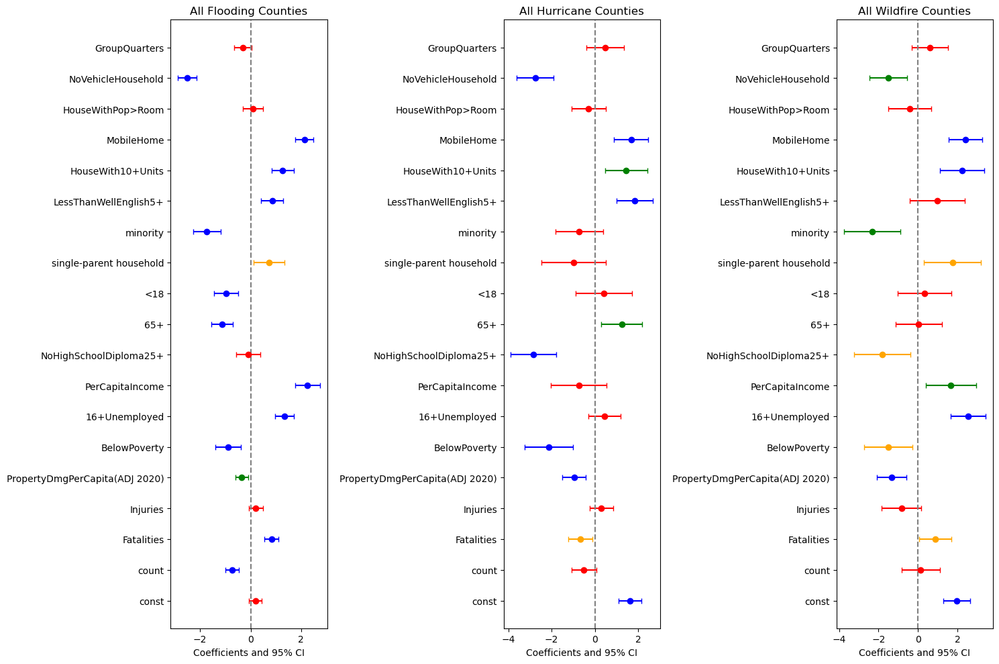

In [528]:
# Function to plot forest plot for given disaster data
def plot_forest(data, title, ax):
    variables = data['index']
    coefficients = pd.to_numeric(data['Coefficient'], errors='coerce')
    ci_lower = pd.to_numeric(data['CI_lower'], errors='coerce')
    ci_upper = pd.to_numeric(data['CI_upper'], errors='coerce')
    p_values = pd.to_numeric(data['p-value'], errors='coerce')
    
    # Determine colors based on p-value thresholds
    colors = p_values.apply(lambda x: 'blue' if x < 0.001 else ('green' if x < 0.01 else ('orange' if x < 0.05 else 'red')))
    
    # Calculate error bars for confidence intervals
    errors = [coefficients - ci_lower, ci_upper - coefficients]
    errors = [abs(e) for e in errors]
    
    # Create forest plot with colored points
    for i in range(len(variables)):
        ax.errorbar(coefficients[i], i, xerr=[[errors[0][i]], [errors[1][i]]], fmt='o', color=colors[i], capsize=3)
    
    ax.set_yticks(range(len(variables)))
    ax.set_yticklabels(variables)
    ax.set_xlabel('Coefficients and 95% CI')
    ax.axvline(x=0, color='grey', linestyle='--')
    ax.set_title(title)
# Prepare the data for each plot
columns = ["index", 'Coefficient', 'CI_lower', 'CI_upper', 'p-value']

# Extracting specific columns for each category
flooding = all_cor_table[['index', 'Coefficient of all flooding counties', 'CI_lower of all flooding counties', 'CI_upper of all flooding counties', 'p-value of all flooding counties']]
flooding.columns = columns
flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

hurricane = all_cor_table[['index', 'Coefficient of all hurricane counties', 'CI_lower of all hurricane counties', 'CI_upper of all hurricane counties', 'p-value of all hurricane counties']]
hurricane.columns = columns
hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

wildfire = all_cor_table[['index', 'Coefficient of all wildfire counties', 'CI_lower of all wildfire counties', 'CI_upper of all wildfire counties', 'p-value of all wildfire counties']]
wildfire.columns = columns
wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(15,10))
plot_forest(flooding, 'All Flooding Counties', axs[0])
plot_forest(hurricane, 'All Hurricane Counties', axs[1])
plot_forest(wildfire, 'All Wildfire Counties', axs[2])

plt.tight_layout()
plt.show()


In [532]:
medhigh_flooding_cor_use = medhigh_flooding_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
medhigh_flooding_cor_use = medhigh_flooding_cor_use.rename(columns={"Coefficient":"Coefficient of medhigh flooding counties",
                                                     "p-value":"p-value of medhigh flooding counties",
                                                     "Std Error":"Std Error of medhigh flooding counties",
                                                     "CI_lower":"CI_lower of medhigh flooding counties",
                                                     "CI_upper":"CI_upper of medhigh flooding counties"})

medhigh_hurricane_cor_use = medhigh_hurricane_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
medhigh_hurricane_cor_use = medhigh_hurricane_cor_use.rename(columns={"Coefficient":"Coefficient of medhigh hurricane counties",
                                                     "p-value":"p-value of medhigh hurricane counties",
                                                     "Std Error":"Std Error of medhigh hurricane counties"})

medhigh_wildfire_cor_use = medhigh_wildfire_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
medhigh_wildfire_cor_use = medhigh_wildfire_cor_use.rename(columns={"Coefficient":"Coefficient of medhigh wildfire counties",
                                                     "p-value":"p-value of medhigh wildfire counties",
                                                     "Std Error":"Std Error of medhigh wildfire counties"})

In [533]:
medhigh_cor_table = medhigh_flooding_cor_use
medhigh_cor_table["Coefficient of medhigh hurricane counties"] = medhigh_hurricane_cor_use["Coefficient of medhigh hurricane counties"]
medhigh_cor_table["p-value of medhigh hurricane counties"] = medhigh_hurricane_cor_use["p-value of medhigh hurricane counties"]
medhigh_cor_table["Std Error of medhigh hurricane counties"] = medhigh_hurricane_cor_use["Std Error of medhigh hurricane counties"]
medhigh_cor_table["CI_lower of medhigh hurricane counties"] = medhigh_hurricane_cor_use["CI_lower"]
medhigh_cor_table["CI_upper of medhigh hurricane counties"] = medhigh_hurricane_cor_use["CI_upper"]
medhigh_cor_table["Coefficient of medhigh wildfire counties"] = medhigh_wildfire_cor_use["Coefficient of medhigh wildfire counties"]
medhigh_cor_table["p-value of medhigh wildfire counties"] = medhigh_wildfire_cor_use["p-value of medhigh wildfire counties"]
medhigh_cor_table["Std Error of medhigh wildfire counties"] = medhigh_wildfire_cor_use["Std Error of medhigh wildfire counties"]
medhigh_cor_table["CI_lower of medhigh wildfire counties"] = medhigh_wildfire_cor_use["CI_lower"]
medhigh_cor_table["CI_upper of medhigh wildfire counties"] = medhigh_wildfire_cor_use["CI_upper"]
medhigh_cor_table

,Coefficient of medhigh flooding counties,p-value of medhigh flooding counties,Std Error of medhigh flooding counties,CI_lower of medhigh flooding counties,CI_upper of medhigh flooding counties,Coefficient of medhigh hurricane counties,p-value of medhigh hurricane counties,Std Error of medhigh hurricane counties,CI_lower of medhigh hurricane counties,CI_upper of medhigh hurricane counties,Coefficient of medhigh wildfire counties,p-value of medhigh wildfire counties,Std Error of medhigh wildfire counties,CI_lower of medhigh wildfire counties,CI_upper of medhigh wildfire counties
const,-0.35818*,0.01580,0.14829,-0.64900,-0.06737,0.8496**,0.00614,0.30881,0.24296,1.45624,1.63588***,0.00003,0.38736,0.87436,2.39740
count,-0.8506***,0.00000,0.15781,-1.16010,-0.54111,-0.18686,0.58654,0.34337,-0.86141,0.48768,-0.24374,0.67233,0.57585,-1.37582,0.88834
Fatalities,0.74186***,0.00000,0.15918,0.42968,1.05403,-0.81427*,0.01198,0.32294,-1.44868,-0.17987,0.93268*,0.04737,0.46889,0.01087,1.85448
Injuries,0.37595*,0.01709,0.15752,0.06703,0.68486,0.25331,0.42467,0.31705,-0.36953,0.87616,-0.67432,0.25298,0.58903,-1.83232,0.48367
PropertyDmgPerCapita(ADJ 2020),-0.33731*,0.02428,0.14962,-0.63074,-0.04388,-1.04743**,0.00105,0.31793,-1.67200,-0.42287,-1.36839**,0.00140,0.42525,-2.20439,-0.53238
BelowPoverty,-0.86754**,0.00464,0.30607,-1.46778,-0.26729,-2.0299**,0.00310,0.68304,-3.37171,-0.68809,-1.12806,0.12590,0.73552,-2.57404,0.31793
16+Unemployed,1.40776***,0.00000,0.21928,0.97772,1.83780,-0.01322,0.97581,0.43594,-0.86961,0.84317,2.69725***,0.00000,0.52583,1.66350,3.73101
PerCapitaIncome,2.17081***,0.00000,0.28170,1.61836,2.72326,0.26928,0.72678,0.77027,-1.24388,1.78244,2.67625***,0.00019,0.70999,1.28046,4.07204
NoHighSchoolDiploma25+,-0.32759,0.23735,0.27715,-0.87111,0.21594,-2.84647***,0.00000,0.60668,-4.03828,-1.65466,-1.44558,0.09393,0.86097,-3.13819,0.24703
65+,-0.95857***,0.00017,0.25458,-1.45783,-0.45932,2.31274***,0.00009,0.58581,1.16193,3.46354,-0.38821,0.57490,0.69162,-1.74790,0.97147


In [534]:
medhigh_cor_table = medhigh_cor_table.astype(str).apply(lambda x: x.str.replace('*', ''))
# medhigh_cor_table.to_csv(r"F:\PEP\Results\medhighcountiesreg.csv")
medhigh_cor_table = medhigh_cor_table.reset_index()

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3349320532.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\3349320532.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-valu

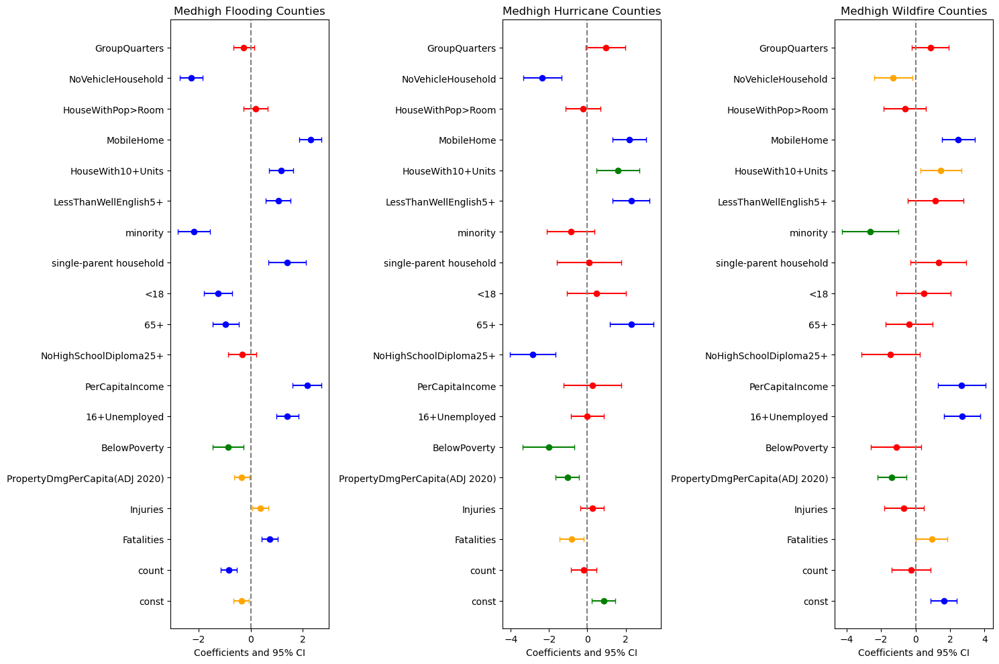

In [536]:
# Prepare the data for each plot
columns = ["index", 'Coefficient', 'CI_lower', 'CI_upper', 'p-value']

# Extracting specific columns for each category
flooding = medhigh_cor_table[['index', 'Coefficient of medhigh flooding counties', 'CI_lower of medhigh flooding counties', 'CI_upper of medhigh flooding counties', 'p-value of medhigh flooding counties']]
flooding.columns = columns
flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

hurricane = medhigh_cor_table[['index', 'Coefficient of medhigh hurricane counties', 'CI_lower of medhigh hurricane counties', 'CI_upper of medhigh hurricane counties', 'p-value of medhigh hurricane counties']]
hurricane.columns = columns
hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

wildfire = medhigh_cor_table[['index', 'Coefficient of medhigh wildfire counties', 'CI_lower of medhigh wildfire counties', 'CI_upper of medhigh wildfire counties', 'p-value of medhigh wildfire counties']]
wildfire.columns = columns
wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(15,10))
plot_forest(flooding, 'Medhigh Flooding Counties', axs[0])
plot_forest(hurricane, 'Medhigh Hurricane Counties', axs[1])
plot_forest(wildfire, 'Medhigh Wildfire Counties', axs[2])

plt.tight_layout()
plt.show()


In [517]:
high_flooding_cor_use = high_flooding_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
high_flooding_cor_use = high_flooding_cor_use.rename(columns={"Coefficient":"Coefficient of high flooding counties",
                                                     "p-value":"p-value of high flooding counties",
                                                     "Std Error":"Std Error of high flooding counties",
                                                     "CI_lower":"CI_lower of high flooding counties",
                                                     "CI_upper":"CI_upper of high flooding counties"})

high_hurricane_cor_use = high_hurricane_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
high_hurricane_cor_use = high_hurricane_cor_use.rename(columns={"Coefficient":"Coefficient of high hurricane counties",
                                                     "p-value":"p-value of high hurricane counties"})

high_wildfire_cor_use = high_wildfire_cor[["Coefficient","p-value","Std Error","CI_lower","CI_upper"]]
high_wildfire_cor_use = high_wildfire_cor_use.rename(columns={"Coefficient":"Coefficient of high wildfire counties",
                                                     "p-value":"p-value of high wildfire counties"})

In [523]:
high_cor_table = high_flooding_cor_use
high_cor_table["Coefficient of high hurricane counties"] = high_hurricane_cor_use["Coefficient of high hurricane counties"]
high_cor_table["p-value of high hurricane counties"] = high_hurricane_cor_use["p-value of high hurricane counties"]
high_cor_table["Std Error of high hurricane counties"] = high_hurricane_cor_use["Std Error"]
high_cor_table["CI_lower of high hurricane counties"] = high_hurricane_cor_use["CI_lower"]
high_cor_table["CI_upper of high hurricane counties"] = all_hurricane_cor_use["CI_upper"]
high_cor_table["Coefficient of high wildfire counties"] = high_wildfire_cor_use["Coefficient of high wildfire counties"]
high_cor_table["p-value of high wildfire counties"] = high_wildfire_cor_use["p-value of high wildfire counties"]
high_cor_table["Std Error of high wildfire counties"] = high_wildfire_cor_use["Std Error"]
high_cor_table["CI_lower of high wildfire counties"] = high_wildfire_cor_use["CI_lower"]
high_cor_table["CI_upper of high wildfire counties"] = high_wildfire_cor_use["CI_upper"]
high_cor_table

,Coefficient of high flooding counties,p-value of high flooding counties,Std Error of high flooding counties,CI_lower of high flooding counties,CI_upper of high flooding counties,Coefficient of high hurricane counties,p-value of high hurricane counties,Std Error of high hurricane counties,CI_lower of high hurricane counties,CI_upper of high hurricane counties,Coefficient of high wildfire counties,p-value of high wildfire counties,Std Error of all wildfire counties,CI_lower of all wildfire counties,CI_upper of all wildfire counties,Std Error of high wildfire counties,CI_lower of high wildfire counties,CI_upper of high wildfire counties
const,-1.21876***,0.00000,0.25930,-1.72793,-0.70959,1.1651*,0.03794,0.55676,0.06566,2.16821,0.71469,0.27390,0.65037,-0.57236,2.00175,0.65037,-0.57236,2.00175
count,-0.90198**,0.00136,0.28044,-1.45266,-0.35131,-0.75544,0.25780,0.66523,-2.06908,0.08034,1.00986,0.23440,0.84521,-0.66278,2.68250,0.84521,-0.66278,2.68250
Fatalities,1.24893***,0.00005,0.30453,0.65094,1.84692,-1.17137,0.06123,0.62145,-2.39855,-0.11632,0.99596,0.23481,0.83431,-0.65511,2.64703,0.83431,-0.65511,2.64703
Injuries,0.35886,0.22409,0.29490,-0.22021,0.93793,0.43381,0.47079,0.60010,-0.75121,0.83563,-1.30891,0.14315,0.88839,-3.06702,0.44919,0.88839,-3.06702,0.44919
PropertyDmgPerCapita(ADJ 2020),-0.33401,0.20934,0.26579,-0.85593,0.18791,-1.77483**,0.00288,0.58651,-2.93303,-0.40623,-1.70605*,0.03516,0.80118,-3.29156,-0.12054,0.80118,-3.29156,-0.12054
BelowPoverty,-0.23514,0.66294,0.53924,-1.29400,0.82372,-1.12038,0.35953,1.21929,-3.52813,-0.99735,0.41712,0.78011,1.49091,-2.53335,3.36759,1.49091,-2.53335,3.36759
16+Unemployed,1.47048***,0.00028,0.40299,0.67916,2.26180,1.01579,0.18852,0.76922,-0.50321,1.18696,0.76353,0.47639,1.06898,-1.35195,2.87902,1.06898,-1.35195,2.87902
PerCapitaIncome,2.28408***,0.00000,0.47908,1.34336,3.22481,-1.3278,0.35392,1.42823,-4.14815,0.54688,1.17658,0.34740,1.24747,-1.29213,3.64530,1.24747,-1.29213,3.64530
NoHighSchoolDiploma25+,-0.12211,0.80582,0.49656,-1.09718,0.85295,-4.18109**,0.00236,1.35339,-6.85365,-1.77568,-1.26074,0.36994,1.40112,-4.03351,1.51204,1.40112,-4.03351,1.51204
65+,-1.40337**,0.00331,0.47606,-2.33818,-0.46857,3.01787**,0.00685,1.10168,0.84235,2.19532,-1.58141,0.14535,1.07930,-3.71731,0.55448,1.07930,-3.71731,0.55448


In [524]:
high_cor_table = high_cor_table.astype(str).apply(lambda x: x.str.replace('*', ''))
high_cor_table.to_csv(r"F:\PEP\Results\highcountiesreg.csv")
high_cor_table = high_cor_table.reset_index()

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\2828952592.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\2828952592.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-valu

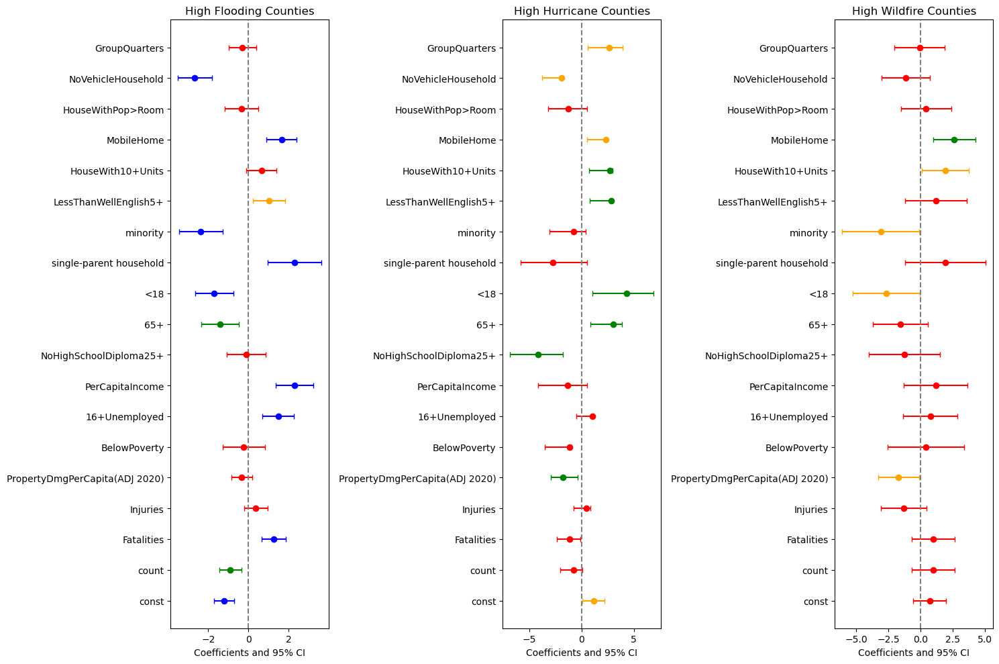

In [529]:
# Prepare the data for each plot
columns = ["index", 'Coefficient', 'CI_lower', 'CI_upper', 'p-value']

# Extracting specific columns for each category
flooding = high_cor_table[['index', 'Coefficient of high flooding counties', 'CI_lower of high flooding counties', 'CI_upper of high flooding counties', 'p-value of high flooding counties']]
flooding.columns = columns
flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = flooding[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

hurricane = high_cor_table[['index', 'Coefficient of high hurricane counties', 'CI_lower of high hurricane counties', 'CI_upper of high hurricane counties', 'p-value of high hurricane counties']]
hurricane.columns = columns
hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = hurricane[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

wildfire = high_cor_table[['index', 'Coefficient of high wildfire counties', 'CI_lower of high wildfire counties', 'CI_upper of high wildfire counties', 'p-value of high wildfire counties']]
wildfire.columns = columns
wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']] = wildfire[['Coefficient', 'CI_lower', 'CI_upper', 'p-value']].apply(pd.to_numeric, errors='coerce')

# Plotting
fig, axs = plt.subplots(1, 3, figsize=(15,10))
plot_forest(flooding, 'High Flooding Counties', axs[0])
plot_forest(hurricane, 'High Hurricane Counties', axs[1])
plot_forest(wildfire, 'High Wildfire Counties', axs[2])

plt.tight_layout()
plt.show()


In [443]:
all_flooding_cor_dis_use = all_flooding_cor_dis[["Coefficient","p-value"]]
all_flooding_cor_dis_use = all_flooding_cor_dis_use.rename(columns={"Coefficient":"Coefficient of all flooding counties",
                                                     "p-value":"p-value of all flooding counties"})

all_hurricane_cor_dis_use = all_hurricane_cor_dis[["Coefficient","p-value"]]
all_hurricane_cor_dis_use = all_hurricane_cor_dis_use.rename(columns={"Coefficient":"Coefficient of all hurricane counties",
                                                     "p-value":"p-value of all hurricane counties"})

all_wildfire_cor_dis_use = all_wildfire_cor_dis[["Coefficient","p-value"]]
all_wildfire_cor_dis_use = all_wildfire_cor_dis_use.rename(columns={"Coefficient":"Coefficient of all wildfire counties",
                                                     "p-value":"p-value of all wildfire counties"})

In [444]:
all_cor_dis_table = all_flooding_cor_dis_use
all_cor_dis_table["Coefficient of all hurricane counties"] = all_hurricane_cor_dis_use["Coefficient of all hurricane counties"]
all_cor_dis_table["p-value of all hurricane counties"] = all_hurricane_cor_dis_use["p-value of all hurricane counties"]
all_cor_dis_table["Coefficient of all wildfire counties"] = all_wildfire_cor_dis_use["Coefficient of all wildfire counties"]
all_cor_dis_table["p-value of all wildfire counties"] = all_wildfire_cor_dis_use["p-value of all wildfire counties"]
all_cor_dis_table

,Coefficient of all flooding counties,p-value of all flooding counties,Coefficient of all hurricane counties,p-value of all hurricane counties,Coefficient of all wildfire counties,p-value of all wildfire counties
const,0.19045,0.20967,1.63813***,0.00001,1.9616***,0.00000
count,-1.11279***,0.00000,-0.40156,0.29825,0.84396,0.12782
Fatalities,0.95777***,0.00000,-1.04049**,0.00632,1.05905*,0.02999
Injuries,0.28923,0.07669,0.93339*,0.01234,-1.0981,0.06367
PropertyDmgPerCapita(ADJ 2020),-0.42315**,0.00540,-0.60118,0.11098,-0.94842*,0.02913


In [537]:
all_cor_dis_table.to_csv(r"F:\PEP\Results\allcountiesreg_dis.csv")

In [445]:
medhigh_flooding_cor_dis_use = medhigh_flooding_cor_dis[["Coefficient","p-value"]]
medhigh_flooding_cor_dis_use = medhigh_flooding_cor_dis_use.rename(columns={"Coefficient":"Coefficient of medhigh flooding counties",
                                                     "p-value":"p-value of medhigh flooding counties"})

medhigh_hurricane_cor_dis_use = medhigh_hurricane_cor_dis[["Coefficient","p-value"]]
medhigh_hurricane_cor_dis_use = medhigh_hurricane_cor_dis_use.rename(columns={"Coefficient":"Coefficient of medhigh hurricane counties",
                                                     "p-value":"p-value of medhigh hurricane counties"})

medhigh_wildfire_cor_dis_use = medhigh_wildfire_cor_dis[["Coefficient","p-value"]]
medhigh_wildfire_cor_dis_use = medhigh_wildfire_cor_dis_use.rename(columns={"Coefficient":"Coefficient of medhigh wildfire counties",
                                                     "p-value":"p-value of medhigh wildfire counties"})

In [446]:
medhigh_cor_dis_table = medhigh_flooding_cor_dis_use
medhigh_cor_dis_table["Coefficient of medhigh hurricane counties"] = medhigh_hurricane_cor_dis_use["Coefficient of medhigh hurricane counties"]
medhigh_cor_dis_table["p-value of medhigh hurricane counties"] = medhigh_hurricane_cor_dis_use["p-value of medhigh hurricane counties"]
medhigh_cor_dis_table["Coefficient of medhigh wildfire counties"] = medhigh_wildfire_cor_dis_use["Coefficient of medhigh wildfire counties"]
medhigh_cor_dis_table["p-value of medhigh wildfire counties"] = medhigh_wildfire_cor_dis_use["p-value of medhigh wildfire counties"]
medhigh_cor_dis_table

,Coefficient of medhigh flooding counties,p-value of medhigh flooding counties,Coefficient of medhigh hurricane counties,p-value of medhigh hurricane counties,Coefficient of medhigh wildfire counties,p-value of medhigh wildfire counties
const,-0.35818*,0.04000,0.8496*,0.04778,1.63588***,0.00047
count,-1.30609***,0.00000,0.07983,0.85726,0.56832,0.38057
Fatalities,1.01953***,0.00000,-1.25708**,0.00434,1.16999*,0.03496
Injuries,0.38981*,0.03447,1.08685*,0.01166,-1.09191,0.11300
PropertyDmgPerCapita(ADJ 2020),-0.4186*,0.01678,-0.61163,0.15862,-0.99183*,0.04617


In [538]:
medhigh_cor_dis_table.to_csv(r"F:\PEP\Results\medcountiesreg_dis.csv")

In [447]:
high_flooding_cor_dis_use = high_flooding_cor_dis[["Coefficient","p-value"]]
high_flooding_cor_dis_use = high_flooding_cor_dis_use.rename(columns={"Coefficient":"Coefficient of high flooding counties",
                                                     "p-value":"p-value of high flooding counties"})

high_hurricane_cor_dis_use = high_hurricane_cor_dis[["Coefficient","p-value"]]
high_hurricane_cor_dis_use = high_hurricane_cor_dis_use.rename(columns={"Coefficient":"Coefficient of high hurricane counties",
                                                     "p-value":"p-value of high hurricane counties"})

high_wildfire_cor_dis_use = high_wildfire_cor_dis[["Coefficient","p-value"]]
high_wildfire_cor_dis_use = high_wildfire_cor_dis_use.rename(columns={"Coefficient":"Coefficient of high wildfire counties",
                                                     "p-value":"p-value of high wildfire counties"})

In [448]:
high_cor_dis_table = high_flooding_cor_dis_use
high_cor_dis_table["Coefficient of high hurricane counties"] = high_hurricane_cor_dis_use["Coefficient of high hurricane counties"]
high_cor_dis_table["p-value of high hurricane counties"] = high_hurricane_cor_dis_use["p-value of high hurricane counties"]
high_cor_dis_table["Coefficient of high wildfire counties"] = high_wildfire_cor_dis_use["Coefficient of high wildfire counties"]
high_cor_dis_table["p-value of high wildfire counties"] = high_wildfire_cor_dis_use["p-value of high wildfire counties"]
high_cor_dis_table

,Coefficient of high flooding counties,p-value of high flooding counties,Coefficient of high hurricane counties,p-value of high hurricane counties,Coefficient of high wildfire counties,p-value of high wildfire counties
const,-1.21876***,0.00006,1.1651,0.13349,0.71469,0.33564
count,-1.27041***,0.00005,-1.43228,0.07455,1.54261,0.08731
Fatalities,1.48569***,0.00002,-1.9186*,0.01721,1.21986,0.17707
Injuries,0.46227,0.17658,1.81703*,0.02021,-1.30787,0.18208
PropertyDmgPerCapita(ADJ 2020),-0.35199,0.24619,-1.18937,0.12699,-1.20144,0.14502


In [539]:
# high_cor_dis_table.to_csv(r"F:\PEP\Results\highcountiesreg_dis.csv")

In [449]:
# years = range(2001, 2021)

# hurricane_fips_by_year = {year: [] for year in years}
# flood_fips_by_year = {year: [] for year in years}
# wildfire_fips_by_year = {year: [] for year in years}

# def process_hazard(hazard_name, result_dict):
#     hazard_data = SHELDUS_0020_use[SHELDUS_0020_use['Hazard'] == hazard_name]
    
#     for year in years:
#         yearly_data = hazard_data[hazard_data['Year'] == year]
#         unique_fips = yearly_data['County FIPS'].unique().tolist()
#         result_dict[year] = unique_fips

# process_hazard('Hurricane/Tropical Storm', hurricane_fips_by_year)
# process_hazard('Flooding', flood_fips_by_year)
# process_hazard('Wildfire', wildfire_fips_by_year)

# hurricane_fips_list = [hurricane_fips_by_year[year] for year in years]
# flood_fips_list = [flood_fips_by_year[year] for year in years]
# wildfire_fips_list = [wildfire_fips_by_year[year] for year in years]

# print(hurricane_fips_list)
# print(flood_fips_list)
# print(wildfire_fips_list)

In [450]:
# years = range(2001, 2021)
# for i in range(20):
#     all_county = SHELDUS_0020_use[SHELDUS_0020_use["Year"]==years[0]]
#     all_fips = list(all_county["County FIPS"].unique())
#     net_mig = relevant_data[relevant_data["FIPS"].isin(all_fips)]
#     flooding_use = net_mig[net_mig["FIPS"].isin(flood_fips_list[i])]
#     hurricane_use= net_mig[net_mig["FIPS"].isin(hurricane_fips_list[i])]
#     wildfire_use = net_mig[net_mig["FIPS"].isin(wildfire_fips_list[i])]
    

In [451]:
relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
relevant_data['NetMigrationRate1'] = relevant_data[correct_netmig_columns].mean(axis=1)
relevant_data['NetMigrationRate2'] = (relevant_data['TotalNetMigration'] / relevant_data['AveragePopulation']) * 1000
final_data = relevant_data[['FIPS','STNAME_x', 'CTYNAME_x', 'TotalNetMigration', 'AveragePopulation', 'NetMigrationRate1', 'NetMigrationRate2']]

C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\433456365.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['AveragePopulation'] = (relevant_data['CENSUS2000POP'] + relevant_data['CENSUS2010POP']) / 2
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\433456365.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_data['TotalNetMigration'] = relevant_data[correct_netmig_columns].sum(axis=1)
C:\Users\xiang11\AppData\Local\Temp\ipykernel_9516\433456365.py:3: SettingWithCopyWarning: 


### Previous note

Social vulnerability
1) index
2) social vulnerability,hazards,net migration
3) Find coastal counties for hurricane

hierarchical regression

ACS in notion

climate gentrification

### Link different disaster (hard)
### Easier way, relation between population netflow and frequency disaster
move in or move out

dynamic time line
breakdown net population migration in high middle low level

different disaster level,